a. Directory Structure (notebooks for testing and src once build complete)


By grouping:

    Viewpoint and court functions into their own modules,
    Plot initialization and element creation into a common module,
    Animation update logic into one (or two) modules (with a “base” update for common elements and extensions for shot meter/feedback),
    Shot meter feature engineering in its own module,
    Bayesian and SHAP processing in another module, and
    Feedback (angle meter and related visualizations) in a separate module,

you create a clean, maintainable, and “pythonic” codebase. Adjustments in one area (say, updating the gauge) will only require you to change the functions in the feedback module without affecting the court drawing or the basic animation.

After each change, you would run your tests (for example in your notebooks) to validate that the entire system continues to work smoothly.


project/
│
├── notebooks/
│    ├── free_throw_predictions/
│        ├── animate_mod_nb.ipynb (we're here testing, will change the writefiles to ../src/freethrow_predictions/animate to get to being able to use with streamlit and such)
│    │    └── animate/
│    │        ├── __init__.py
│    │        ├── viewpoints.py
│    │        ├── court.py
│    │        ├── elements.py
│    │        ├── animation.py
│    │        ├── angle_meter.py
│    │        ├── animate_from_df.py
│    │        ├── animate_from_df_with_shot_meters.py
│    │        ├── bayes_angle_meter.py
│    │        └── ...
│
├── src/
|    ├── free_throw_predictions/
│    │    └── animate/
│    │        ├── __init__.py
│    │        ├── viewpoints.py
│    │        ├── court.py
│    │        ├── elements.py
│    │        ├── animation.py
│    │        ├── angle_meter.py
│    │        ├── animate_from_df.py
│    │        ├── animate_from_df_with_shot_meters.py
│    │        ├── bayes_angle_meter.py
│    │        └── ...
│
├── data/
│    └── processed/
│         └── final_granular_dataset.csv
└── ...



In [ ]:
Below is a step‐by‐step plan to reorganize and refactor your repository so that it becomes efficient, automated, and cohesive. The idea is to group related functionality into modules, keep tests and development notebooks separate from the production code (in **src**), and ensure that each component is well‐documented and isolated so that changes in one area do not affect the rest of the codebase.

---

## **Step 1. Define a Clean Directory Structure**

**Goal:** Separate development/testing notebooks from the production code that will eventually be imported (for example, by a Streamlit app).

**Plan:**

1. **Create Two Top-Level Directories:**
   - **notebooks/** – For interactive testing and exploratory analysis.
   - **src/** – For production-ready code.

2. **Within the `src/` Directory:**
   - Create a package named **free_throw_predictions**.
   - Under that, create a subpackage called **animate**.

3. **Proposed Structure:**

   ```
   project/
   │
   ├── notebooks/
   │    └── free_throw_predictions/
   │         └── animate_mod_nb.ipynb     # Your interactive testing notebook
   │
   ├── src/
   │    └── free_throw_predictions/
   │         └── animate/
   │              ├── __init__.py        # Marks 'animate' as a package
   │              ├── viewpoints.py      # Functions for retrieving camera viewpoints
   │              ├── court.py           # Functions for court drawing and hoop position
   │              ├── elements.py        # Plot initialization and element creation
   │              ├── animation.py       # Core animation update logic
   │              ├── angle_meter.py     # Functions for creating/updating angle meters
   │              ├── shot_meter.py      # Shot meter feature engineering functions
   │              ├── bayesian.py        # Bayesian and SHAP processing functions
   │              └── feedback.py        # Feedback and gauge visualization functions
   │
   ├── data/
   │    └── processed/
   │         └── final_granular_dataset.csv
   └── ...
   ```

*Note:* You can later add more modules (or even subpackages) as needed—for example, if you decide to separate testing utilities or configuration files.

---

## **Step 2. Group Functions by Their Purpose**

**Goal:** Make each module responsible for one area of functionality. This minimizes cross-dependencies and makes testing easier.

### **2.1. Viewpoint and Court Functions**

- **`viewpoints.py`**  
  *Contains:*  
  - `get_viewpoint(name: str) -> dict`  
  *Purpose:* Return preset camera settings (elevation and azimuth).

- **`court.py`**  
  *Contains:*  
  - `get_hoop_position(...)`  
  - `draw_court(...)`  
  *Purpose:* Compute court parameters and render the court (and hoop).

### **2.2. Plot Initialization and Element Creation**

- **`elements.py`**  
  *Contains:*  
  - `initialize_plot(...)`  
  - `initialize_elements(...)`  
  *Purpose:* Set up a Matplotlib 3D plot, create the ball, lines for the player skeleton, and text annotations.

### **2.3. Animation Update Logic**

- **`animation.py`**  
  *Contains:*  
  - Core update functions such as a “base” update (e.g. `update_player_frame(...)`) and an extended update (e.g. `update_full_frame(...)` that calls the base update plus the shot meter/feedback updates).  
  *Purpose:* Centralize all logic that updates the animation frame by frame.

### **2.4. Shot Meter Feature Engineering**

- **`shot_meter.py`**  
  *Contains:*  
  - Functions like `calculate_release_angles(...)`, `calculate_optimal_release_angle_ranges(...)`, and `calculate_optimal_max_angle_ranges(...)`  
  *Purpose:* Process the raw data and add columns that compute release angles, optimal ranges, and shot classifications.

### **2.5. Bayesian and SHAP Processing**

- **`bayesian.py`**  
  *Contains:*  
  - Functions to load precalculated Bayesian metrics, add Bayesian ranges to the dataset, classify metrics, and merge them with granular shot data.  
  *Purpose:* Encapsulate all logic related to Bayesian optimization and SHAP integration.

### **2.6. Feedback and Angle Meter Visualizations**

- **`feedback.py`**  
  *Contains:*  
  - Functions like `initialize_angle_meters(...)`, `update_angle_meter(...)`, `initialize_bar_meter(...)`, `initialize_line_graph(...)`, and helpers such as `generate_feedback_table_all_metrics(...)` and `display_combined_output(...)`.  
  *Purpose:* Provide the feedback visualization components (e.g. updating gauges with calculated, bayesian, or SHAP information).

---

## **Step 3. Refactor and Move Code into Modules**

**Goal:** Incrementally move code into the new modules and update import statements accordingly.

### **3.1. Create and Populate Modules**

1. **`viewpoints.py` & `court.py`:**  
   - Move the current content of your notebook cells (or files) for `get_viewpoint`, `get_hoop_position`, and `draw_court` into these modules.
   - Verify that these functions import only what they need (e.g. `import numpy as np` and `import matplotlib.pyplot as plt`).

2. **`elements.py`:**  
   - Move the initialization functions for plots and elements.
   - Ensure that functions like `initialize_plot(...)` and `initialize_elements(...)` have clear docstrings.

3. **`animation.py`:**  
   - Extract the common frame update logic (e.g. updating the ball, skeleton lines, and text) into a helper function such as `update_player_frame(...)`.
   - Create a second function (e.g. `update_full_frame(...)`) that calls the common update and then updates any shot meter or feedback-related components.
   - Update your notebook(s) to import these functions from `src/free_throw_predictions/animate/animation.py`.

4. **`shot_meter.py`:**  
   - Place all functions for shot meter feature engineering here.
   - Include docstrings explaining the purpose of each function and any default parameters (e.g. percentiles).

5. **`bayesian.py`:**  
   - Move your bayesian metrics loading, merging, and classification functions here.
   - For example, functions like `load_precalculated_bayesian_metrics(...)`, `add_bayesian_ranges_to_ml_dataset(...)`, `classify_metrics(...)`, and `merge_bayes_metrics_with_granular_data(...)`.

6. **`feedback.py`:**  
   - Place functions that handle the feedback display for the angle meter (e.g. `update_angle_meter(...)`, `initialize_bar_meter(...)`, `initialize_line_graph(...)`, `generate_feedback_table_all_metrics(...)`, etc.).
   - These functions should be isolated so that if you need to change the feedback logic (for example, updating the gauge), you only modify this module.

### **3.2. Update Import Statements**

- As you move functions, update any import statements in your notebooks and in other modules to point to the new module paths.  
  For example, in your notebook, you might now import:

  ```python
  from free_throw_predictions.animate.viewpoints import get_viewpoint
  from free_throw_predictions.animate.court import draw_court, get_hoop_position
  from free_throw_predictions.animate.elements import initialize_plot, initialize_elements
  from free_throw_predictions.animate.animation import update_full_frame, update_player_frame
  from free_throw_predictions.animate.shot_meter import calculate_release_angles, calculate_optimal_release_angle_ranges
  from free_throw_predictions.animate.bayesian import load_precalculated_bayesian_metrics, add_bayesian_ranges_to_ml_dataset
  from free_throw_predictions.animate.feedback import update_angle_meter, initialize_bar_meter, generate_feedback_table_all_metrics
  ```

- Test these changes using your interactive notebooks to ensure nothing is broken.

---

## **Step 4. Automate Testing and Build Processes**

**Goal:** Ensure that after each refactor step, you can automatically run tests to validate the changes.

### **4.1. Write Unit Tests**

- Create a **tests/** folder at the project root (or under a dedicated testing folder) and add test modules (e.g. `test_viewpoints.py`, `test_court.py`, etc.) that import functions from your **src/** folder.
- Use a testing framework (like `pytest`) to write tests that verify:
  - Correct values are returned by `get_viewpoint()`.
  - `draw_court()` and `get_hoop_position()` work without error.
  - Plot initialization functions create figures with expected properties.
  - Update functions correctly update Matplotlib objects when provided sample data.

### **4.2. Continuous Integration (Optional but Recommended)**

- Set up a CI pipeline (using GitHub Actions, Travis CI, etc.) that runs your tests on every commit. This ensures that your refactoring does not break existing functionality.

### **4.3. Automation Scripts**

- If needed, write automation scripts (e.g. a setup script) that package your **src/** folder so that it can be installed (for example, with `pip install -e .`).  
- Create a `setup.py` or `pyproject.toml` file so that your package is installable and its dependencies are managed.

---

## **Step 5. Validate the Entire System**

**Goal:** Make sure that after each module refactoring, you run the notebooks to verify that:
- The animations still work as expected.
- The court and viewpoint functions render correctly.
- The shot meter feature engineering correctly adds new columns to your dataset.
- The Bayesian and SHAP integrations are working and feedback displays are updated accordingly.

*Tip:* Use your interactive notebook (e.g. `animate_mod_nb.ipynb`) to run end-to-end tests, and document any differences or adjustments needed.

---

## **Step 6. Summary of Steps to Replace Functions**

When everything is working as expected, the following files in your **src/free_throw_predictions/animate/** folder will replace your old notebook writefiles:

- **`viewpoints.py`** – Contains `get_viewpoint`
- **`court.py`** – Contains `get_hoop_position` and `draw_court`
- **`elements.py`** – Contains `initialize_plot` and `initialize_elements`
- **`animation.py`** – Contains `update_player_frame` and `update_full_frame` (the animation update logic)
- **`shot_meter.py`** – Contains all shot meter feature engineering functions
- **`bayesian.py`** – Contains all Bayesian and SHAP processing functions
- **`feedback.py`** – Contains all feedback and angle meter visualization functions

After verifying each module with your tests and interactive notebooks, your production code will reside in **src/** while your testing and debugging remain in **notebooks/**.

---

## **Final Thoughts**

This modular approach gives you a cohesive, automated, and maintainable codebase. Each area of functionality is isolated; for example, changes in the angle meter feedback will only affect **feedback.py**. Automated tests (using `pytest` or a similar framework) and CI pipelines will ensure that the refactoring does not break functionality.

By following these steps and organizing your repository as shown, you achieve an efficient, modular, and pythonic codebase ready for further integration (e.g. into a Streamlit app) or extension.

Feel free to ask for more details on any particular module or step if needed!

In [1]:
%%writefile animate/__init__.py
# Create __init__.py in notebooks/animate/
# Empty file to mark 'animate' as a package


Overwriting animate/__init__.py


In [19]:
%%writefile animate/viewpoints.py
import logging
import pandas as pd
import numpy as np

logger = logging.getLogger(__name__)

# Define common viewpoints
COMMON_VIEWPOINTS = {
    "side_view_right": {"elev": 0, "azim": 90},
    "side_view_left": {"elev": 0, "azim": -90},
    "top_down": {"elev": 90, "azim": 0},
    "diagonal_view": {"elev": 45, "azim": 45},
    "player_centric": {"elev": 30, "azim": 0},
    "diagonal_player_centric": {"elev": 30, "azim": 45},
    "inverse_player_centric": {"elev": 30, "azim": 180}
}

def get_viewpoint(name: str) -> dict:
    """
    Retrieve viewpoint parameters by name.
    
    Parameters:
    - name (str): The name of the viewpoint.
    
    Returns:
    - dict: Dictionary containing 'elev' and 'azim'.
    """
    try:
        viewpoint = COMMON_VIEWPOINTS[name]
        logger.debug(f"Retrieved viewpoint '{name}': {viewpoint}")
        return viewpoint
    except KeyError:
        logger.error(f"Viewpoint '{name}' not found. Available viewpoints: {list(COMMON_VIEWPOINTS.keys())}")
        raise ValueError(f"Viewpoint '{name}' not found. Choose from {list(COMMON_VIEWPOINTS.keys())}")

def enable_interactive_view(fig, ax, debug=False):
    """
    Enables interactive rotation and zoom for the 3D axes via key presses.
      - Arrow keys (up, down, left, right) adjust the elevation and azimuth.
      - '+' and '-' keys adjust the distance (zoom).
    """
    state = {
        'curr_elev': ax.elev,
        'curr_azim': ax.azim,
        'curr_dist': ax.dist if hasattr(ax, 'dist') else 10
    }
    
    def on_key_press(event):
        if event.key == 'left':
            state['curr_azim'] -= 5
        elif event.key == 'right':
            state['curr_azim'] += 5
        elif event.key == 'up':
            state['curr_elev'] += 5
        elif event.key == 'down':
            state['curr_elev'] -= 5
        elif event.key == '+':
            state['curr_dist'] = max(1, state['curr_dist'] - 0.5)
        elif event.key == '-':
            state['curr_dist'] = min(25, state['curr_dist'] + 0.5)
        else:
            return
        
        ax.view_init(elev=state['curr_elev'], azim=state['curr_azim'])
        ax.dist = state['curr_dist']
        if debug:
            logger.debug(f"Interactive view updated: elev={state['curr_elev']}, azim={state['curr_azim']}, dist={state['curr_dist']}")
        fig.canvas.draw_idle()
    
    fig.canvas.mpl_connect('key_press_event', on_key_press)
    if debug:
        logger.debug("Interactive 3D view controls enabled (arrow keys, plus, minus).")


Overwriting animate/viewpoints.py


In [3]:
%%writefile animate/court.py
import logging
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mplbasketball.court3d import Court3D, draw_court_3d

logger = logging.getLogger(__name__)

def get_hoop_position(court_type: str = "nba", units: str = "ft", debug: bool = False) -> (float, float, float):
    """
    Calculate the 3D position of the basketball hoop based on court specifications.

    Parameters:
    - court_type (str): Type of the court ('nba', 'wnba', 'ncaa').
    - units (str): Units of measurement ('ft' or 'm').
    - debug (bool): Flag to enable debug logging.

    Returns:
    - x, y, z (float): Coordinates of the hoop in 3D space.
    """
    try:
        court = Court3D(court_type=court_type, units=units)
        params = court.court_parameters
        # The hoop is located a certain distance from the edge of the court
        x = params['court_dims'][0] / 2 - params['hoop_distance_from_edge']
        y = 0.0  # Centered along the y-axis
        z = params['hoop_height']
        if debug:
            logger.debug(f"Calculated hoop position at (x={x}, y={y}, z={z}) for court type '{court_type}' in '{units}' units.")
        return x, y, z
    except KeyError as e:
        logger.error(f"Key error when accessing court parameters: {e}")
        raise
    except Exception as e:
        logger.error(f"Unexpected error in get_hoop_position: {e}")
        raise


def draw_court(ax: plt.Axes, court_type: str = "nba", units: str = "ft", debug: bool = False) -> None:
    """
    Draw the basketball court and hoops on the given axes.

    Parameters:
    - ax (plt.Axes): The Matplotlib 3D axis object.
    - court_type (str): Type of the court ('nba', 'wnba', 'ncaa').
    - units (str): Units of measurement ('ft' or 'm').
    - debug (bool): Flag to enable debug logging.

    Returns:
    - None
    """
    try:
        # Draw the court using mplbasketball
        draw_court_3d(ax, court_type=court_type, units=units, origin=np.array([0.0, 0.0]), line_width=2)
        if debug:
            logger.debug("Court drawn successfully using mplbasketball.")

        # Get court parameters
        court = Court3D(court_type=court_type, units=units)
        court_params = court.court_parameters
        if debug:
            logger.debug(f"Court Parameters in draw_court: {court_params}")

        # Get hoop position
        hoop_x, hoop_y, hoop_z = get_hoop_position(court_type=court_type, units=units, debug=debug)


        # Draw the hoop as a circle
        hoop_radius = court_params['hoop_diameter'] / 2
        theta_circle = np.linspace(0, 2 * np.pi, 100)
        hoop_xs = hoop_x + hoop_radius * np.cos(theta_circle)
        hoop_ys = hoop_y + hoop_radius * np.sin(theta_circle)
        hoop_zs = np.full_like(hoop_xs, hoop_z)

        ax.plot(hoop_xs, hoop_ys, hoop_zs, c='orange', lw=3)
        if debug:
            logger.debug(f"Hoop drawn at position ({hoop_x}, {hoop_y}, {hoop_z}) with radius {hoop_radius}.")

        # Plot half-court line
        half_court_x = np.linspace(-court_params['court_dims'][0]/2, court_params['court_dims'][0]/2, 100)
        half_court_y = np.full_like(half_court_x, 0.0)
        half_court_z = np.full_like(half_court_x, 0.0)
        ax.plot(half_court_x, half_court_y, half_court_z, c='black', lw=2, linestyle='--', label='Half-Court Line')
        if debug:
            logger.debug("Half-court line plotted.")

        # Plot sidelines
        sideline_x = np.linspace(-court_params['court_dims'][0]/2, court_params['court_dims'][0]/2, 100)
        sideline_y_positive = np.full_like(sideline_x, court_params['court_dims'][1]/2)
        sideline_z = np.full_like(sideline_x, 0.0)
        ax.plot(sideline_x, sideline_y_positive, sideline_z, c='blue', lw=2, label='Sideline')
        if debug:
            logger.debug("Positive sideline plotted.")

        sideline_y_negative = np.full_like(sideline_x, -court_params['court_dims'][1]/2)
        ax.plot(sideline_x, sideline_y_negative, sideline_z, c='blue', lw=2, label='Sideline')
        if debug:
            logger.debug("Negative sideline plotted.")

        # Plot baselines
        baseline_y = np.linspace(-court_params['court_dims'][1]/2, court_params['court_dims'][1]/2, 100)
        baseline_z = np.full_like(baseline_y, 0.0)
        ax.plot(court_params['court_dims'][0]/2, baseline_y, baseline_z, c='green', lw=2, label='Baseline')
        if debug:
            logger.debug("Positive baseline plotted.")

        ax.plot(-court_params['court_dims'][0]/2, baseline_y, baseline_z, c='green', lw=2, label='Baseline')
        if debug:
            logger.debug("Negative baseline plotted.")

        if debug:
            logger.debug("Additional court features (half-court, sidelines, baselines) drawn successfully.")
    except KeyError as e:
        logger.error(f"Key error in draw_court: {e}")
        raise
    except Exception as e:
        logger.error(f"Error drawing court or hoop: {e}")
        raise


Overwriting animate/court.py


In [4]:
%%writefile animate/elements.py
import logging
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import pandas as pd
import numpy as np

logger = logging.getLogger(__name__)

def initialize_elements(
    ax: plt.Axes,
    connections: list,
    player_color: str,
    player_lw: float,
    ball_color: str,
    ball_size: float,
    debug: bool = False
) -> (dict, plt.Line2D, plt.Text, plt.Text, plt.Text):
    """
    Initialize plot elements such as lines for the player skeleton and the ball.

    Returns:
    - lines (dict): Dictionary of line objects for each connection.
    - ball (plt.Line2D): The ball plot object.
    - release_text (plt.Text): Text object for release point indicator.
    - motion_text (plt.Text): Text object for motion phase indicator.
    - distance_text (plt.Text): Text object for distance to hoop.
    """
    try:
        # Initialize lines for each body connection
        lines = {connection: ax.plot([], [], [], c=player_color, lw=player_lw)[0] for connection in connections}
        
        # Initialize the ball as a point
        ball, = ax.plot([], [], [], "o", markersize=ball_size, c=ball_color)
        
        # Text elements for annotations
        release_text = ax.text2D(0.05, 0.95, "", transform=ax.transAxes, color="red", fontsize=14, weight="bold")
        motion_text = ax.text2D(0.05, 0.90, "", transform=ax.transAxes, color="blue", fontsize=12, weight="bold")
        
        # New text element for distance (positioned below motion_text)
        distance_text = ax.text2D(0.05, 0.85, "", transform=ax.transAxes, color="green", fontsize=12, weight="bold")
        
        if debug:
            logger.debug("Elements initialized (lines, ball, text labels).")
        
        return lines, ball, release_text, motion_text, distance_text
    except Exception as e:
        logger.error(f"Error initializing elements: {e}")
        raise

def initialize_plot(zlim=20, elev=30, azim=60, figsize=(12, 10), debug=False):
    """
    Initialize a 3D plot with specified view settings and outputs setup details.

    Parameters:
    - zlim (float): The limit for the z-axis (height).
    - elev (float): Elevation angle in the z plane for the camera view.
    - azim (float): Azimuth angle in the x,y plane for the camera view.
    - figsize (tuple): Figure size.
    - debug (bool): Flag to enable debug logging.

    Returns:
    - fig: The Matplotlib figure object.
    - ax: The Matplotlib 3D axis object.
    """
    try:
        fig = plt.figure(figsize=figsize)
        ax = fig.add_subplot(111, projection="3d")
        ax.set_zlim([0, zlim])
        ax.set_box_aspect([1, 1, 1])
        ax.view_init(elev=elev, azim=azim)
        ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
        ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_zticks([])
        if debug:
            logger.debug(f"Initialized 3D plot with Z limit: {zlim}, Elevation: {elev}, Azimuth: {azim}")
        return fig, ax
    except Exception as e:
        logger.error(f"Failed to initialize plot: {e}")
        raise



Overwriting animate/elements.py


In [5]:
%%writefile animate/animate_from_df.py

import logging
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib.lines import Line2D
from IPython.display import HTML
from mplbasketball.court3d import Court3D, draw_court_3d

from animate.elements import initialize_elements, initialize_plot
from animate.court import draw_court, get_hoop_position
from animate.viewpoints import get_viewpoint


logger = logging.getLogger(__name__)

def update_frame(
    ax: plt.Axes,
    frame: int,
    df: pd.DataFrame,
    release_frame: int,
    lines: dict,
    ball: plt.Line2D,
    release_text: plt.Text,
    motion_text: plt.Text,
    connections: list,
    ball_color: str,
    highlight_color: str,
    debug: bool = False
) -> None:
    """
    Update function for each frame in the animation.

    Parameters:
    - ax (plt.Axes): The Matplotlib 3D axis object.
    - frame (int): The current frame number.
    - df (pd.DataFrame): DataFrame containing motion data.
    - release_frame (int): Frame index of the release point.
    - lines (dict): Dictionary of line objects for skeleton.
    - ball (plt.Line2D): Ball object for animation.
    - release_text (plt.Text): Text object for release point.
    - motion_text (plt.Text): Text object for motion phase.
    - connections (list): Joint connections.
    - ball_color (str): Default ball color.
    - highlight_color (str): Highlight color for release point.
    - debug (bool): Flag to enable debug logging.

    Returns:
    - None
    """
    try:
        if debug and frame % 10 == 0:
            logger.debug(f"Updating frame {frame}")

        # Highlight the release frame
        if frame == release_frame:
            ball.set_color(highlight_color)
            release_text.set_text("Release Point!")
            if debug:
                logger.debug(f"Frame {frame} is the release frame. Ball color changed to {highlight_color}.")
        else:
            ball.set_color(ball_color)
            release_text.set_text("")

        # Update motion phase text if 'shooting_motion' exists
        if 'shooting_motion' in df.columns:
            shooting_motion = df.at[frame, 'shooting_motion']
            motion_text.set_text("Shooting Motion" if shooting_motion == 1 else "")
        else:
            motion_text.set_text("")

        # Update lines for joints
        for connection in connections:
            part1, part2 = connection
            if (f"{part1}_x" in df.columns and f"{part2}_x" in df.columns and
                not pd.isna(df.at[frame, f"{part1}_x"]) and not pd.isna(df.at[frame, f"{part2}_x"])):
                x = [df.at[frame, f"{part1}_x"], df.at[frame, f"{part2}_x"]]
                y = [df.at[frame, f"{part1}_y"], df.at[frame, f"{part2}_y"]]
                z = [df.at[frame, f"{part1}_z"], df.at[frame, f"{part2}_z"]]
                lines[connection].set_data_3d(x, y, z)
            else:
                # If data is missing, hide the line
                lines[connection].set_data([], [])
                lines[connection].set_3d_properties([])

        # Update ball position if ball coordinates exist
        if 'ball_x' in df.columns and 'ball_y' in df.columns and 'ball_z' in df.columns:
            ball_x = df.at[frame, 'ball_x']
            ball_y = df.at[frame, 'ball_y']
            ball_z = df.at[frame, 'ball_z']
            if not (pd.isna(ball_x) or pd.isna(ball_y) or pd.isna(ball_z)):
                ball.set_data_3d([ball_x], [ball_y], [ball_z])
            else:
                # Hide the ball if data is missing
                ball.set_data([], [])
                ball.set_3d_properties([])
        else:
            # Hide the ball if columns are missing
            ball.set_data([], [])
            ball.set_3d_properties([])
    except Exception as e:
        logger.error(f"Error updating frame {frame}: {e}")
        raise



def animate_trial_from_df(
    df: pd.DataFrame,
    release_frame: int,
    viewpoint_name: str = "side_view_right",
    connections: list = None,
    zlim: float = 15.0,
    player_color: str = "purple",
    player_lw: float = 2.0,
    ball_color: str = "#ee6730",
    ball_size: float = 20.0,
    highlight_color: str = "red",
    show_court: bool = True,
    court_type: str = "nba",
    units: str = "ft",
    notebook_mode: bool = True,
    debug: bool = False
) -> HTML:
    """
    Animate a basketball trial from a DataFrame.

    Parameters:
    - df (pd.DataFrame): DataFrame containing motion data.
    - release_frame (int): Frame index of the release point.
    - viewpoint_name (str): Name of the predefined viewpoint.
    - connections (list): List of joint connections.
    - zlim (float): The limit for the z-axis (height).
    - player_color (str): Color for player skeleton.
    - player_lw (float): Line width for player skeleton.
    - ball_color (str): Color for the ball.
    - ball_size (float): Size of the ball marker.
    - highlight_color (str): Highlight color for release point.
    - show_court (bool): Whether to display the court.
    - court_type (str): Type of the court ('nba', 'wnba', 'ncaa').
    - units (str): Units of measurement ('ft' or 'm').
    - notebook_mode (bool): Whether to display animation in Jupyter notebook.
    - debug (bool): Flag to enable debug logging.

    Returns:
    - HTML: HTML representation of the animation for notebook display.
    """
    try:
        if connections is None:
            logger.error("No connections provided for player skeleton.")
            raise ValueError("Connections list cannot be None.")

        # Close any existing figures to prevent duplicate animations
        plt.close('all')

        if debug:
            logger.debug("Starting animation setup.")
            logger.debug(f"Total frames in DataFrame: {len(df)}")
            logger.debug(f"Release frame index provided: {release_frame}")
            logger.debug(f"Selected viewpoint: {viewpoint_name}")

        # Retrieve elev and azim based on viewpoint_name
        viewpoint = get_viewpoint(viewpoint_name)
        elev = viewpoint['elev']
        azim = viewpoint['azim']

        # Plot setup with predefined viewpoint
        fig, ax = initialize_plot(zlim=zlim, elev=elev, azim=azim, figsize=(12, 10), debug=debug)

        # Draw court and get hoop position
        if show_court:
            draw_court(ax, court_type=court_type, units=units, debug=debug)
            hoop_x, hoop_y, hoop_z = get_hoop_position(court_type=court_type, units=units, debug=debug)
            if debug:
                logger.debug(f"Hoop position retrieved: ({hoop_x}, {hoop_y}, {hoop_z})")
        else:
            hoop_x, hoop_y, hoop_z = None, None, None
            if debug:
                logger.debug("Court not shown. Hoop position set to None.")

        # Initialize elements for animation
        lines, ball, release_text, motion_text, distance_text = initialize_elements(
            ax, connections, player_color, player_lw, ball_color, ball_size, debug=debug
        )

        # Compute axes limits based on player data and hoop position
        if debug:
            logger.debug("Calculating axes limits to include player and hoop.")

        # Extract all x and y coordinates for the player
        player_x_cols = [col for col in df.columns if col.endswith('_x')]
        player_y_cols = [col for col in df.columns if col.endswith('_y')]

        player_x = df[player_x_cols].values.flatten()
        player_y = df[player_y_cols].values.flatten()

        # Remove NaN values
        player_x = player_x[~np.isnan(player_x)]
        player_y = player_y[~np.isnan(player_y)]

        if len(player_x) == 0 or len(player_y) == 0:
            logger.warning("No player coordinates found. Axes limits may not be set correctly.")

        # Get court parameters
        if show_court:
            court = Court3D(court_type=court_type, units=units)
            court_params = court.court_parameters
        else:
            court_params = {'court_length': 94.0, 'court_width': 50.0}  # Default values

        # Initialize min and max with player coordinates
        x_min = player_x.min() - 10.0 if len(player_x) > 0 else -court_params['court_length']/2
        x_max = player_x.max() + 10.0 if len(player_x) > 0 else court_params['court_length']/2
        y_min = player_y.min() - 10.0 if len(player_y) > 0 else -court_params['court_width']/2
        y_max = player_y.max() + 10.0 if len(player_y) > 0 else court_params['court_width']/2

        # Include hoop position in the limits if court is shown and hoop position is valid
        if show_court and hoop_x is not None and hoop_y is not None:
            x_min = min(x_min, hoop_x - 10.0)
            x_max = max(x_max, hoop_x + 10.0)
            y_min = min(y_min, hoop_y - 10.0)
            y_max = max(y_max, hoop_y + 10.0)
            if debug:
                logger.debug(f"Including hoop position in axes limits.")

        if debug:
            logger.debug(f"Player X range: {player_x.min()} to {player_x.max()}")
            logger.debug(f"Player Y range: {player_y.min()} to {player_y.max()}")
            if show_court:
                logger.debug(f"Hoop position: ({hoop_x}, {hoop_y})")
            logger.debug(f"Using xbuffer: 10.0, ybuffer: 10.0")

        # Set fixed axes limits
        ax.set_xlim([x_min, x_max])
        ax.set_ylim([y_min, y_max])

        if debug:
            logger.debug(f"Set axes limits: x=({x_min}, {x_max}), y=({y_min}, {y_max})")

        # Set plot title to include the viewpoint name
        ax.set_title(f"Animation - {viewpoint_name}", fontsize=16)
        if debug: 
            logger.debug(f"Set plot title to 'Animation - {viewpoint_name}'")

        # Create custom legend handles for static court features
        hoop_handle = Line2D([0], [0], color='orange', lw=3, label='Hoop')
        baseline_handle = Line2D([0], [0], color='blue', lw=2, label='Baseline')
        sideline_handle = Line2D([0], [0], color='green', lw=2, label='Sideline')

        # Create handles for dynamic elements
        player_handle = Line2D([0], [0], color=player_color, lw=player_lw, label='Player')
        ball_handle = Line2D([0], [0], marker='o', color='w', label='Ball',
                             markerfacecolor=ball_color, markersize=10)

        # Add legend with both static and dynamic elements (excluding distance)
        ax.legend(handles=[
            hoop_handle,  # Hoop in orange
            sideline_handle,  # Sideline in green
            baseline_handle,  # Baseline in blue
            player_handle,  # Player skeleton in purple
            ball_handle  # Ball in orange
        ], loc='upper right')

        if debug:
            logger.debug("Legend added with static court features and dynamic elements.")

        # Update function for animation
        def update_func(frame: int):
            """
            Wrapper function for updating the frame in the animation.
            """
            update_frame(
                ax=ax,
                frame=frame,
                df=df,
                release_frame=release_frame,
                lines=lines,
                ball=ball,
                release_text=release_text,
                motion_text=motion_text,
                connections=connections,
                ball_color=ball_color,
                highlight_color=highlight_color,
                debug=debug
            )

            # Update the distance text if available
            if 'distance_to_hoop' in df.columns:
                distance = df.at[frame, 'distance_to_hoop']
                if not pd.isna(distance):
                    distance_text.set_text(f"Distance to Hoop: {distance:.2f} ft")
                else:
                    distance_text.set_text("")
            else:
                distance_text.set_text("")

        # Animation setup
        anim = FuncAnimation(fig, update_func, frames=len(df), interval=1000 / 30, blit=False)

        if notebook_mode:
            if debug:
                logger.debug("Returning animation for notebook display.")
            return HTML(anim.to_jshtml())
        else:
            if debug:
                logger.debug("Returning animation object.")
            return anim
    except Exception as e:
        logger.error(f"An error occurred during animation: {e}")
        raise






Overwriting animate/animate_from_df.py


In [6]:
%%writefile animate/animate_from_df_main.py

import logging
import pandas as pd
from IPython.display import display

from animate.animate_from_df import animate_trial_from_df

joint_configs = [
    {
        'name': 'knee',
        'min_angle_key': 'knee_max_angle_filtered_optimal_min',
        'max_angle_key': 'knee_max_angle_filtered_optimal_max',
        'release_min_angle_key': 'knee_release_angle_filtered_optimal_min',
        'release_max_angle_key': 'knee_release_angle_filtered_optimal_max',
        'angle_key': 'knee_angle',
        'is_max_key': 'is_knee_max_angle',
        'classification_key': 'knee_max_angle_shot_classification',
        'release_classification_key': 'knee_release_angle_shot_classification'
    },
    {
        'name': 'elbow',
        'min_angle_key': 'elbow_max_angle_filtered_optimal_min',
        'max_angle_key': 'elbow_max_angle_filtered_optimal_max',
        'release_min_angle_key': 'elbow_release_angle_filtered_optimal_min',
        'release_max_angle_key': 'elbow_release_angle_filtered_optimal_max',
        'angle_key': 'elbow_angle',
        'is_max_key': 'is_elbow_max_angle',
        'classification_key': 'elbow_max_angle_shot_classification',
        'release_classification_key': 'elbow_release_angle_shot_classification'
    },
    {
        'name': 'wrist',
        'min_angle_key': 'max_wrist_angle_filtered_optimal_min',
        'max_angle_key': 'max_wrist_angle_filtered_optimal_max',
        'release_min_angle_key': 'wrist_release_angle_filtered_optimal_min',
        'release_max_angle_key': 'wrist_release_angle_filtered_optimal_max',
        'angle_key': 'wrist_angle',
        'is_max_key': 'is_max_wrist_angle',
        'classification_key': 'max_wrist_angle_shot_classification',
        'release_classification_key': 'wrist_release_angle_shot_classification'
    }
]


# Configure logging for debugging
logging.basicConfig(level=logging.DEBUG, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

def main():
    try:
        # Load data from the specified CSV file
        data_path = "../../data/processed/final_granular_dataset.csv"
        final_granular_df_with_stats = pd.read_csv(data_path)
        logger.debug(f"Loaded data from {data_path} with shape {final_granular_df_with_stats.shape}")

        # Define connections between joints
        connections = [
            ("R_EYE", "L_EYE"), ("R_EYE", "NOSE"), ("L_EYE", "NOSE"),
            ("R_EYE", "R_EAR"), ("L_EYE", "L_EAR"), ("R_SHOULDER", "L_SHOULDER"),
            ("R_SHOULDER", "R_ELBOW"), ("L_SHOULDER", "L_ELBOW"), ("R_ELBOW", "R_WRIST"),
            ("L_ELBOW", "L_WRIST"), ("R_SHOULDER", "R_HIP"), ("L_SHOULDER", "L_HIP"),
            ("R_HIP", "L_HIP"), ("R_HIP", "R_KNEE"), ("L_HIP", "L_KNEE"),
            ("R_KNEE", "R_ANKLE"), ("L_KNEE", "L_ANKLE"), ("R_WRIST", "R_1STFINGER"),
            ("R_WRIST", "R_5THFINGER"), ("L_WRIST", "L_1STFINGER"), ("L_WRIST", "L_5THFINGER"),
            ("R_ANKLE", "R_1STTOE"), ("R_ANKLE", "R_5THTOE"), ("L_ANKLE", "L_1STTOE"),
            ("L_ANKLE", "L_5THTOE"), ("R_ANKLE", "R_CALC"), ("L_ANKLE", "L_CALC"),
            ("R_1STTOE", "R_5THTOE"), ("L_1STTOE", "L_5THTOE"), ("R_1STTOE", "R_CALC"),
            ("L_1STTOE", "L_CALC"), ("R_5THTOE", "R_CALC"), ("L_5THTOE", "L_CALC"),
            ("R_1STFINGER", "R_5THFINGER"), ("L_1STFINGER", "L_5THFINGER")
        ]
        logger.debug("Defined joint connections for player skeleton.")

        # Select a specific trial for visualization
        trial_id_to_visualize = 'T0088'  # Replace with actual trial ID you want to visualize
        trial_data = final_granular_df_with_stats[final_granular_df_with_stats['trial_id'] == trial_id_to_visualize]
        trial_data = trial_data.sort_values(by='frame_time').reset_index(drop=True)
        logger.debug(f"Selected trial ID '{trial_id_to_visualize}' with {len(trial_data)} frames.")

        # Determine the release frame (the frame where release_point_filter is 1)
        release_frames = trial_data.index[trial_data["release_point_filter"] == 1].tolist()
        release_frame = release_frames[0] if release_frames else None
        if release_frame is not None:
            logger.debug(f"Release frame found at index {release_frame}.")
        else:
            logger.warning("No release frame found in the trial data.")

        # Set parameters for visualization
        viewpoint_name = "diagonal_player_centric"  # Choose from COMMON_VIEWPOINTS
        zlim = 15        # Adjust for height


        # Call the first animation function
        animation_html = animate_trial_from_df(
            df=trial_data,
            release_frame=release_frame,
            viewpoint_name=viewpoint_name,
            connections=connections,
            zlim=zlim,
            player_color="purple",
            player_lw=2.0,
            ball_color="#ee6730",
            ball_size=20.0,
            highlight_color="red",
            show_court=True,
            court_type="nba",
            units="ft",
            notebook_mode=True,
            debug=True  # Enable detailed logging for troubleshooting
        )
        
        # Display the first animation
        display(animation_html)

    except Exception as e:
        logger.error(f"An error occurred in main: {e}")
        raise

if __name__ == "__main__":
    main()


Overwriting animate/animate_from_df_main.py


### Add on Shot meters

- Basic logistic
  - No predictions needed
  - Take out the outliers and base it within the successful shots angles


- Bayes optimized angles with Shap post recommendations, graphs, and trends

### add on shaps/bayes optimization angles

In [7]:
%%writefile animate/calc_bayes_shap_feature_engineering.py
import os
import json
import pickle
import logging
import requests
from io import BytesIO
from pathlib import Path
from datetime import datetime
from typing import List, Tuple, Dict, Optional

import numpy as np
import pandas as pd

# add for if we ever want to recalculate the shap min and max values
from ml.config.config_loader import load_config
from ml.config.config_models import AppConfig
from ml.shap.shap_utils import load_dataset, setup_logging, load_configuration, initialize_logger
from ml.shap.predict_with_shap_usage import predict_and_shap
    
# ------------------------------------------------------------------------------
# Logging configuration (used by bayesian metrics functions)
# ------------------------------------------------------------------------------
logger = logging.getLogger('combined_feature_engineering')
if not logger.hasHandlers():
    logger.setLevel(logging.DEBUG)
    handler = logging.StreamHandler()
    formatter = logging.Formatter('%(asctime)s - %(levelname)s - %(message)s')
    handler.setFormatter(formatter)
    logger.addHandler(handler)


def round_numeric_columns(df: pd.DataFrame, decimals: int = 2) -> pd.DataFrame:
    """
    Rounds all float columns in the DataFrame to the specified number of decimals.
    """
    float_cols = df.select_dtypes(include=['float']).columns
    df[float_cols] = df[float_cols].round(decimals)
    return df

# ------------------------------------------------------------------------------
# SHOT METER FEATURE ENGINEERING FUNCTIONS
# ------------------------------------------------------------------------------

def calculate_release_angles(df: pd.DataFrame, debug: bool = False) -> pd.DataFrame:
    """
    Calculate and merge release angles (mean knee, wrist, and elbow angles) based on release_point_filter.
    """
    release_df = df[df['release_point_filter'] == 1]
    if debug:
        print(f"[calculate_release_angles] release_df shape: {release_df.shape}")

    release_angles = (
        release_df.groupby('trial_id')
        .agg({
            'knee_angle': 'mean',
            'wrist_angle': 'mean',
            'elbow_angle': 'mean'
        })
        .rename(columns={
            'knee_angle': 'release_knee_angle',
            'wrist_angle': 'release_wrist_angle',
            'elbow_angle': 'release_elbow_angle'
        })
    )
    if debug:
        print(f"[calculate_release_angles] release_angles shape: {release_angles.shape}")
        print(f"[calculate_release_angles] New columns: {list(release_angles.columns)}")

    df = df.merge(release_angles, on='trial_id', how='left')
    if debug:
        print(f"[calculate_release_angles] Final df shape after merge: {df.shape}")
    else:
        print("[calculate_release_angles] Step completed.")

    return df


def calculate_optimal_release_angle_ranges(
    df: pd.DataFrame,
    debug: bool = False,
    calc_feedback_range_percentile: float = 10  # new single parameter for feedback range
) -> pd.DataFrame:
    """
    Compute initial and filtered optimal angle ranges for knee, wrist, and elbow at the release point.
    
    Instead of using two percentiles to determine the feedback range, this version uses a single 
    parameter (calc_feedback_range_percentile). For each joint, it computes the full original range 
    from the release data and then calculates a symmetric margin:
    
        margin = (orig_max - orig_min) * (calc_feedback_range_percentile / 100) / 2
    
    Then, for each joint, the filtered optimal range is defined as:
    
        filtered_optimal_min = optimal_value - margin
        filtered_optimal_max = optimal_value + margin
    
    The resulting boundaries are used for classifying each shot as 'Early', 'Late', or 'Good'.
    """
    step = "Optimal Release Angle Ranges"
    # Filter the release data (release_point_filter==1 and result==1)
    release_df = df[(df['release_point_filter'] == 1) & (df['result'] == 1)]
    if debug:
        print(f"[{step}] Filtered release_df shape: {release_df.shape}")
    else:
        print(f"[{step}] Filtering completed.")
    
    # Prepare new columns (set as NaN by default)
    new_cols = [
        'knee_release_angle_initial_optimal_min', 'knee_release_angle_initial_optimal_max',
        'wrist_release_angle_initial_optimal_min', 'wrist_release_angle_initial_optimal_max',
        'elbow_release_angle_initial_optimal_min', 'elbow_release_angle_initial_optimal_max'
    ]
    for col in new_cols:
        df[col] = float('nan')
    
    if not release_df.empty:
        # For each joint, compute the full original range and calculate margin
        # Also, retrieve the optimal release angle from the merged column (assumed constant across rows)
        # Note: The optimal value is taken from the first available row for each joint.
        # This block computes the optimal ranges for knee, wrist, and elbow.
        # -- Knee --
        orig_min_knee = release_df['knee_angle'].min()
        orig_max_knee = release_df['knee_angle'].max()
        full_range_knee = orig_max_knee - orig_min_knee
        margin_knee = full_range_knee * (calc_feedback_range_percentile / 100.0) / 2.0
        optimal_knee = df['release_knee_angle'].iloc[0]
        knee_filtered_optimal_min = optimal_knee - margin_knee
        knee_filtered_optimal_max = optimal_knee + margin_knee

        # -- Wrist --
        orig_min_wrist = release_df['wrist_angle'].min()
        orig_max_wrist = release_df['wrist_angle'].max()
        full_range_wrist = orig_max_wrist - orig_min_wrist
        margin_wrist = full_range_wrist * (calc_feedback_range_percentile / 100.0) / 2.0
        optimal_wrist = df['release_wrist_angle'].iloc[0]
        wrist_filtered_optimal_min = optimal_wrist - margin_wrist
        wrist_filtered_optimal_max = optimal_wrist + margin_wrist

        # -- Elbow --
        orig_min_elbow = release_df['elbow_angle'].min()
        orig_max_elbow = release_df['elbow_angle'].max()
        full_range_elbow = orig_max_elbow - orig_min_elbow
        margin_elbow = full_range_elbow * (calc_feedback_range_percentile / 100.0) / 2.0
        optimal_elbow = df['release_elbow_angle'].iloc[0]
        elbow_filtered_optimal_min = optimal_elbow - margin_elbow
        elbow_filtered_optimal_max = optimal_elbow + margin_elbow

        if debug:
            print(f"[{step}] Computed feedback ranges using calc_feedback_range_percentile = {calc_feedback_range_percentile}%:")
            print(f"         Knee: full_range={full_range_knee:.2f}, margin={margin_knee:.2f}, range=[{knee_filtered_optimal_min:.2f}, {knee_filtered_optimal_max:.2f}]")
            print(f"         Wrist: full_range={full_range_wrist:.2f}, margin={margin_wrist:.2f}, range=[{wrist_filtered_optimal_min:.2f}, {wrist_filtered_optimal_max:.2f}]")
            print(f"         Elbow: full_range={full_range_elbow:.2f}, margin={margin_elbow:.2f}, range=[{elbow_filtered_optimal_min:.2f}, {elbow_filtered_optimal_max:.2f}]")
        
        # Save the filtered optimal ranges into the dataframe
        df['knee_release_angle_filtered_optimal_min'] = knee_filtered_optimal_min
        df['knee_release_angle_filtered_optimal_max'] = knee_filtered_optimal_max
        df['wrist_release_angle_filtered_optimal_min'] = wrist_filtered_optimal_min
        df['wrist_release_angle_filtered_optimal_max'] = wrist_filtered_optimal_max
        df['elbow_release_angle_filtered_optimal_min'] = elbow_filtered_optimal_min
        df['elbow_release_angle_filtered_optimal_max'] = elbow_filtered_optimal_max

        # Define a helper function for classification.
        def classify_joint(angle_value, min_val, max_val):
            if angle_value < min_val:
                return "Early"
            elif angle_value > max_val:
                return "Late"
            else:
                return "Good"

        # Loop over the joints to classify the shots.
        for joint in ['knee', 'wrist', 'elbow']:
            # For release metrics, use the computed release value.
            angle_col = f"release_{joint}_angle"
            optimal_min_col = f"{joint}_release_angle_filtered_optimal_min"
            optimal_max_col = f"{joint}_release_angle_filtered_optimal_max"
            classification_col = f"{joint}_release_angle_shot_classification"
            df[classification_col] = df.apply(
                lambda row: classify_joint(row[angle_col], row[optimal_min_col], row[optimal_max_col]),
                axis=1
            )

    else:
        if debug:
            print(f"[{step}] No rows found with release_point_filter==1 and result==1.")
        else:
            print(f"[{step}] No valid rows; step completed.")
    
    return df




def calculate_optimal_max_angle_ranges(
    df: pd.DataFrame,
    output_dir: str,
    output_filename: str = "final_granular_logistic_optimized_meter_dataset.csv",
    debug: bool = False,
    calc_feedback_range_percentile: float = 10  # new single parameter for feedback range
) -> pd.DataFrame:
    """
    Calculates optimal max angle ranges (for wrist, elbow, and knee) during active shooting motion.
    
    Instead of using two percentiles to compute the range, this version uses a single parameter 
    (calc_feedback_range_percentile) to calculate a symmetric feedback range. For each angle:
    
        full_range = max(angle) - min(angle)  (from successful shots)
        feedback_diff = full_range * (calc_feedback_range_percentile / 100)
        margin = feedback_diff / 2
        
    Then, using an "optimal" value (taken as the mean of the angle for successful shots), 
    the filtered range is defined as:
    
        filtered_optimal_min = optimal_value - margin
        filtered_optimal_max = optimal_value + margin
    
    These values are then used for classification.
    """
    step = "Optimal Max Angle Ranges"
    if debug:
        print(f"[{step}] Initial df shape: {df.shape}")
        print(f"[{step}] Columns: {df.columns.to_list()}")
        total_trials_before = df['trial_id'].nunique()
        print(f"[{step}] Total trials before filtering (result): {total_trials_before}")
    else:
        print(f"[{step}] Step started.")
    
    # Filter the data for shooting motion.
    motion_df = df[df['shooting_motion'] == 1]
    if debug:
        print(f"[{step}] Motion df shape: {motion_df.shape}")
    else:
        print(f"[{step}] Shooting motion filtering completed.")
    
    # Calculate max angles per trial.
    max_angles_per_trial = (
        motion_df.groupby('trial_id')
        .agg({'wrist_angle': 'max', 'elbow_angle': 'max', 'knee_angle': 'max'})
        .reset_index()
    )
    if debug:
        print(f"[{step}] Calculated max angles per trial. Shape: {max_angles_per_trial.shape}")
    
    merged_df = motion_df.merge(
        max_angles_per_trial.rename(columns={
            'wrist_angle': 'wrist_max_angle',
            'elbow_angle': 'elbow_max_angle',
            'knee_angle': 'knee_max_angle'
        }),
        on='trial_id',
        how='left'
    )
    merged_df['is_wrist_max_angle'] = (merged_df['wrist_angle'] == merged_df['wrist_max_angle']).astype(int)
    merged_df['is_elbow_max_angle'] = (merged_df['elbow_angle'] == merged_df['elbow_max_angle']).astype(int)
    merged_df['is_knee_max_angle'] = (merged_df['knee_angle'] == merged_df['knee_max_angle']).astype(int)
    if debug:
        print(f"[{step}] Merged df shape after marking max points: {merged_df.shape}")
    
    # Filter successful shots.
    successful_shots_df = merged_df[merged_df['result'] == 1]
    if debug:
        print(f"[{step}] Successful shots df shape: {successful_shots_df.shape}")
        print(f"[{step}] Trials after result filter: {successful_shots_df['trial_id'].nunique()}")
    else:
        print(f"[{step}] Successful shots filtering completed.")
    
    # Dictionary to store computed optimal ranges.
    stats = {}
    # For each angle (using the "max" prefix), compute a symmetric feedback range.
    for joint in ['wrist', 'elbow', 'knee']:
        angle_col = f"{joint}_max_angle"
        orig_min = successful_shots_df[angle_col].min()
        orig_max = successful_shots_df[angle_col].max()
        full_range = orig_max - orig_min
        feedback_diff = full_range * (calc_feedback_range_percentile / 100.0)
        margin = feedback_diff / 2.0
        optimal_value = successful_shots_df[angle_col].mean()
        filtered_optimal_min = optimal_value - margin
        filtered_optimal_max = optimal_value + margin
        
        stats[f"{joint}_max_angle_filtered_optimal_min"] = filtered_optimal_min
        stats[f"{joint}_max_angle_filtered_optimal_max"] = filtered_optimal_max
        
        if debug:
            print(f"[{step}] For {angle_col}: full_range={full_range:.2f}, feedback_diff={feedback_diff:.2f}, margin={margin:.2f}, optimal={optimal_value:.2f}, range=[{filtered_optimal_min:.2f}, {filtered_optimal_max:.2f}]")
    
    # Save the computed stats into the merged_df as constants.
    for key, value in stats.items():
        merged_df[key] = value
    
    # Define a helper function for classification.
    def classify_joint(angle_value, min_val, max_val):
        if angle_value < min_val:
            return "Early"
        elif angle_value > max_val:
            return "Late"
        else:
            return "Good"
    
    # Loop over the joints to classify the shots based on max angles.
    for joint in ['wrist', 'elbow', 'knee']:
        classification_col = f"{joint}_max_angle_shot_classification"
        optimal_min = stats[f"{joint}_max_angle_filtered_optimal_min"]
        optimal_max = stats[f"{joint}_max_angle_filtered_optimal_max"]
        # Use the original angle column (e.g., 'wrist_angle') for classification.
        merged_df[classification_col] = merged_df.apply(
            lambda row, min_val=optimal_min, max_val=optimal_max, joint=joint: classify_joint(row[f"{joint}_max_angle"], min_val, max_val),
            axis=1
        )
    
    merged_df = round_numeric_columns(merged_df, decimals=2)
    
    output_path = os.path.join(output_dir, output_filename)
    merged_df.to_csv(output_path, index=False)
    if debug:
        new_cols = list(stats.keys()) + [
            'wrist_max_angle_shot_classification',
            'elbow_max_angle_shot_classification',
            'knee_max_angle_shot_classification',
            'is_wrist_max_angle', 'is_elbow_max_angle', 'is_knee_max_angle'
        ]
        print(f"[{step}] Updated dataset saved to {output_path}")
        print(f"[{step}] New columns added: {new_cols}")
        print(f"[{step}] Data types of new columns:")
        print(merged_df[new_cols].dtypes)
    else:
        print(f"[{step}] Step completed.")
    
    return merged_df




def load_features_from_pickle(pickle_path: str, y_variable: str = 'result') -> List[str]:
    """
    Load features from a pickle file (list or DataFrame) and remove the y variable.
    """
    try:
        if pickle_path.startswith('http://') or pickle_path.startswith('https://'):
            response = requests.get(pickle_path)
            response.raise_for_status()
            pickle_file = BytesIO(response.content)
            features_data = pickle.load(pickle_file)
        else:
            with open(pickle_path, 'rb') as f:
                features_data = pickle.load(f)
        if isinstance(features_data, pd.DataFrame):
            features = list(features_data.columns)
        elif isinstance(features_data, list):
            features = features_data
        else:
            raise ValueError("Pickle file must contain a list or a DataFrame of features.")
        if y_variable in features:
            features.remove(y_variable)
        logger.debug(f"[load_features_from_pickle] Loaded features: {features}")
        return features
    except Exception as e:
        logger.error(f"[load_features_from_pickle] Error: {e}")
        raise


def load_precalculated_bayesian_metrics(
    bayesian_metrics_file_path: str,
    debug: bool = False
) -> pd.DataFrame:
    """
    Load precalculated bayesian metrics from a CSV file and rename the columns.
    """
    try:
        if debug:
            logger.debug(f"[load_precalculated_bayesian_metrics] Loading from {bayesian_metrics_file_path}...")
        df = pd.read_csv(bayesian_metrics_file_path)
        required_columns = [
            "Parameter",
            "Optimized (Candidate, Real)",
            "Baseline (Real)",
            "Min (Real)",
            "Max (Real)",
            "Success Rate (Baseline)",
            "Success Rate (Candidate)"
        ]
        df = df[required_columns]
        df.rename(
            columns={
                "Optimized (Candidate, Real)": "bayes_optimized",
                "Baseline (Real)": "baseline",
                "Min (Real)": "bayes_min",
                "Max (Real)": "bayes_max",
                "Success Rate (Baseline)": "baseline_success_rate",
                "Success Rate (Candidate)": "bayes_success_rate"
            },
            inplace=True
        )
        if debug:
            logger.debug(f"[load_precalculated_bayesian_metrics] DataFrame shape: {df.shape}")
        return df
    except Exception as e:
        logger.error(f"[load_precalculated_bayesian_metrics] Error: {e}")
        raise


def add_bayesian_ranges_to_ml_dataset(
    bayesian_metrics_data: pd.DataFrame,
    final_ml_data_path: str,
    output_dir: str,
    bayes_min_max_range_percentile: float,       # new parameter, e.g., 10 for 10%
    output_filename: str = "ml_dataset_with_bayesian_metrics.csv",
    debug: bool = False
) -> pd.DataFrame:
    """
    Append precalculated bayesian metrics (optimized, min, max) to the final ML dataset.

    In this updated version, instead of basing bayes_min and bayes_max on quantiles
    of the metric values, we use the full original range of the metric (bayes_orig_min and bayes_orig_max)
    to determine a symmetric range. We calculate the difference as:
    
        bayes_min_max_diff = (bayes_orig_max - bayes_orig_min) * (bayes_min_max_range_percentile / 100)
    
    and define the margin as half of that difference. The bayesian range is then defined as:
    
        bayes_min = bayes_optimized - margin
        bayes_max = bayes_optimized + margin
    
    Additionally, we add a constraint so that bayes_min cannot be lower than bayes_orig_min and
    bayes_max cannot be higher than bayes_orig_max.
    
    The original min and max values are stored as bayes_orig_min and bayes_orig_max.
    """
    step = "Add Bayesian Ranges to ML Dataset"
    try:
        # Map metric name (lowercase) to its bayes_optimized value.
        opt_dict = pd.Series(
            bayesian_metrics_data['bayes_optimized'].values,
            index=bayesian_metrics_data['Parameter'].str.lower()
        ).to_dict()
        
        if debug:
            logger.debug(f"[{step}] Loading final ML dataset from {final_ml_data_path}...")
        final_ml_data = pd.read_csv(final_ml_data_path)
        
        for metric, opt_value in opt_dict.items():
            optimized_col = f"{metric}_bayes_optimized"
            # Add the bayes_optimized value as a new column.
            final_ml_data[optimized_col] = opt_value
            if debug:
                logger.debug(f"[{step}] Added column '{optimized_col}' with value: {opt_value}")
            
            if metric in final_ml_data.columns:
                # Retrieve bayes_optimized value (assumed constant).
                bayes_opt_val = final_ml_data[optimized_col].iloc[0]
                
                # Obtain the original full range of the metric.
                orig_min = final_ml_data[metric].min()
                orig_max = final_ml_data[metric].max()
                full_range = orig_max - orig_min
                
                # Compute the bayes_min_max difference based on the new parameter.
                bayes_min_max_diff = full_range * (bayes_min_max_range_percentile / 100.0)
                # The margin is half of that difference.
                margin = bayes_min_max_diff / 2.0
                
                # Define the new bayesian range centered on bayes_opt_val.
                new_min = bayes_opt_val - margin
                new_max = bayes_opt_val + margin
                
                # Constrain the range so it does not exceed the original bounds.
                if new_min < orig_min:
                    new_min = orig_min
                if new_max > orig_max:
                    new_max = orig_max
                
                # Save the computed bayesian range.
                final_ml_data[f"{metric}_bayes_min"] = new_min
                final_ml_data[f"{metric}_bayes_max"] = new_max
                if debug:
                    logger.debug(f"[{step}] For metric '{metric}':")
                    logger.debug(f"         bayes_opt_val: {bayes_opt_val}")
                    logger.debug(f"         orig_min: {orig_min}, orig_max: {orig_max} (full_range: {full_range})")
                    logger.debug(f"         bayes_min_max_diff (full_range * {bayes_min_max_range_percentile}%): {bayes_min_max_diff}")
                    logger.debug(f"         margin (each side): {margin}")
                    logger.debug(f"         Set bayes_min: {new_min}, bayes_max: {new_max}")
                
                # Also store the original min and max values.
                final_ml_data[f"{metric}_bayes_orig_min"] = orig_min
                final_ml_data[f"{metric}_bayes_orig_max"] = orig_max
            else:
                if debug:
                    logger.warning(f"[{step}] Base metric column '{metric}' not found in final ML data; skipping bayesian range computation.")
        
        # Round numeric columns.
        final_ml_data = round_numeric_columns(final_ml_data, decimals=2)
        
        output_path = os.path.join(output_dir, output_filename)
        final_ml_data.to_csv(output_path, index=False)
        if debug:
            logger.debug(f"[{step}] Updated ML dataset saved to {output_path}")
        else:
            print(f"[{step}] Step completed.")
        return final_ml_data
    except Exception as e:
        logger.error(f"[{step}] Error: {e}")
        raise




def classify_metrics(
    final_ml_data: pd.DataFrame,
    bayesian_metrics: List[str],
    output_dir: str,
    output_filename: str = "classified_ml_dataset.csv",
    debug: bool = False
) -> pd.DataFrame:
    """
    Classify each bayesian metric in the ML dataset as 'Early', 'Late', or 'Good'
    based on the corresponding bayesian min/max values.
    
    This updated version accumulates new columns in a dictionary and then concatenates
    them all at once to reduce DataFrame fragmentation.
    """
    step = "Classify Metrics"
    try:
        # Create a dictionary to hold all new columns for batch addition.
        new_cols = {}
        
        # Loop over each metric and compute the required new columns.
        for metric in bayesian_metrics:
            base_metric_col = metric
            bayes_min_col = f"{metric}_bayes_min"
            bayes_max_col = f"{metric}_bayes_max"
            classification_col = f"{metric}_bayes_classification"
            
            # Skip metric if required bayesian range columns are missing.
            if bayes_min_col not in final_ml_data.columns or bayes_max_col not in final_ml_data.columns:
                if debug:
                    logger.warning(f"[{step}] Bayesian range columns for '{metric}' not found. Skipping classification.")
                continue
            
            # Compute the classification column using np.select.
            new_cols[classification_col] = np.select(
                [
                    final_ml_data[base_metric_col] < final_ml_data[bayes_min_col],
                    final_ml_data[base_metric_col] > final_ml_data[bayes_max_col]
                ],
                ['Early', 'Late'],
                default='Good'
            )
            
            # Compute the unit change column if the bayes optimized column exists.
            bayes_optimized_col = f"{metric}_bayes_optimized"
            if bayes_optimized_col in final_ml_data.columns:
                new_cols[f"{metric}_bayes_unit_change"] = final_ml_data[base_metric_col] - final_ml_data[bayes_optimized_col]
                if debug:
                    logger.debug(f"[{step}] Prepared column '{metric}_bayes_unit_change' computed as {base_metric_col} - {bayes_optimized_col}.")
            else:
                if debug:
                    logger.warning(f"[{step}] Bayes optimized column '{bayes_optimized_col}' not found for metric '{metric}'.")
        
        # After processing all metrics, create a DataFrame from the new columns dictionary.
        new_cols_df = pd.DataFrame(new_cols, index=final_ml_data.index)
        
        # Concatenate the new columns with the original DataFrame.
        final_ml_data = pd.concat([final_ml_data, new_cols_df], axis=1)
        
        # Use copy() to defragment the DataFrame.
        final_ml_data = final_ml_data.copy()
        
        if debug:
            logger.debug(f"[{step}] Classification and bayesian unit change computation completed for all metrics.")
        
        # Round numeric columns as before.
        final_ml_data = round_numeric_columns(final_ml_data, decimals=2)
        
        # Save the updated dataset.
        output_path = os.path.join(output_dir, output_filename)
        final_ml_data.to_csv(output_path, index=False)
        if debug:
            logger.debug(f"[{step}] Classified dataset saved to {output_path}")
        else:
            print(f"[{step}] Step completed.")
        
        return final_ml_data
    except Exception as e:
        logger.error(f"[{step}] Error: {e}")
        raise



def merge_bayes_metrics_with_granular_data(
    granular_df: pd.DataFrame,
    ml_df: pd.DataFrame,
    bayesian_metrics: List[str],
    output_dir: str,
    output_filename: str = "bayesian_shot_meter_granular_dataset.csv",
    debug: bool = False
) -> pd.DataFrame:
    """
    Merge the ML dataset (with bayesian metrics) with the granular dataset on 'trial_id'.
    """
    step = "Merge Bayesian Metrics with Granular Data"
    try:
        if debug:
            logger.debug(f"[{step}] Granular df trial_id count: {granular_df['trial_id'].nunique()}")
            logger.debug(f"[{step}] ML df trial_id count: {ml_df['trial_id'].nunique()}")
            logger.debug(f"[{step}] Performing left join on 'trial_id'...")
        merged_dataset = granular_df.merge(ml_df, on='trial_id', how='left', suffixes=('', '_meter'))
        merged_dataset = round_numeric_columns(merged_dataset, decimals=2)
        
        output_path = os.path.join(output_dir, output_filename)
        merged_dataset.to_csv(output_path, index=False)
        if debug:
            logger.debug(f"[{step}] Merged dataset shape: {merged_dataset.shape}")
            logger.debug(f"[{step}] Merged dataset saved to {output_path}")
        else:
            print(f"[{step}] Step completed.")
        return merged_dataset
    except Exception as e:
        logger.error(f"[{step}] Error: {e}")
        raise


def bayesian_optimized_granular_data_main(
    bayesian_metrics_file_path: str = "../../data/predictions/bayesian_optimization_results/bayesian_optimization_results.csv",
    final_ml_file_path: str = "../../data/processed/final_ml_dataset.csv",
    final_ml_with_predictions_path: str = "../../data/model/predictions/final_dataset_with_predictions_and_shap.csv",
    final_granular_file_path: str = "../../data/processed/final_granular_dataset.csv",
    pickle_path: str = "../../data/preprocessor/features_info/final_ml_df_selected_features_columns.pkl",
    y_variable: str = "result",
    output_dir: str = "../../data/model/shot_meter_docs/",
    debug: bool = False,
    bayes_min_max_range_percentile: float = 10, 
    output_filename: str = "bayesian_shot_meter_granular_dataset.csv"
) -> Tuple[pd.DataFrame, Dict[str, Dict[str, float]]]:
    """
    Main function for bayesian optimization processing. Loads feature names,
    bayesian metrics, adds these metrics to the ML dataset (with new bayesian min/max computed using the provided percentiles),
    performs classification, and finally merges with the granular dataset.
    """
    step = "Bayesian Optimized Granular Data Main"
    try:
        if debug:
            logger.debug(f"[{step}] Starting main function.")

        # Step 0: Load feature names from pickle
        if debug:
            logger.debug(f"[{step}] Loading feature names from: {pickle_path}")
        bayesian_metrics = load_features_from_pickle(pickle_path=pickle_path, y_variable=y_variable)
        if debug:
            logger.debug(f"[{step}] Loaded bayesian metrics: {bayesian_metrics}")

        # Step 1: Load precalculated bayesian metrics table
        combined_data = load_precalculated_bayesian_metrics(
            bayesian_metrics_file_path=bayesian_metrics_file_path,
            debug=debug
        )

        # Step 2: Add bayesian ranges to the ML dataset.
        final_ml_bayes_df = add_bayesian_ranges_to_ml_dataset(
            bayesian_metrics_data=combined_data,
            final_ml_data_path=final_ml_with_predictions_path,
            output_dir=output_dir,
            bayes_min_max_range_percentile=bayes_min_max_range_percentile,
            debug=debug
        )

        # Step 3: Classify metrics in the ML dataset
        final_ml_bayes_df = classify_metrics(
            final_ml_data=final_ml_bayes_df,
            bayesian_metrics=bayesian_metrics,
            output_dir=output_dir,
            debug=debug
        )

        # (Optional) Debug: Load original ML dataset to check columns
        final_ml_data = pd.read_csv(final_ml_with_predictions_path)
        if debug:
            logger.debug(f"[{step}] Final ML dataset columns: {final_ml_data.columns.to_list()}")

        # Step 4: Merge the ML dataset with the granular dataset
        granular_df = pd.read_csv(final_granular_file_path)
        merged_data = merge_bayes_metrics_with_granular_data(
            granular_df=granular_df,
            ml_df=final_ml_bayes_df,
            bayesian_metrics=bayesian_metrics,
            output_dir=output_dir,
            debug=debug,
            output_filename=output_filename
        )

        # Step 5: Build the bayesian_metrics_dict for downstream use
        bayesian_metrics_dict = {}
        for metric in bayesian_metrics:
            optimized_metric_col = f"{metric}_bayes_optimized"
            bayes_classification_col = f"{metric}_bayes_classification"
            shap_importance_col = f"shap_{metric}_importance"
            min_col = f"{metric}_bayes_min"
            max_col = f"{metric}_bayes_max"
            orig_min_col = f"{metric}_bayes_orig_min"
            orig_max_col = f"{metric}_bayes_orig_max"
            if optimized_metric_col in merged_data.columns:
                bayesian_metrics_dict[metric] = {
                    'bayes_optimal': merged_data.at[0, optimized_metric_col],
                    'bayes_original': merged_data.at[0, metric],
                    'bayes_min': merged_data.at[0, min_col] if min_col in merged_data.columns else None,
                    'bayes_max': merged_data.at[0, max_col] if max_col in merged_data.columns else None,
                    'bayes_orig_min': merged_data.at[0, orig_min_col] if orig_min_col in merged_data.columns else None,
                    'bayes_orig_max': merged_data.at[0, orig_max_col] if orig_max_col in merged_data.columns else None,
                    'bayes_classification': merged_data.at[0, bayes_classification_col] if bayes_classification_col in merged_data.columns else "Good",
                    'shap_importance': merged_data.at[0, shap_importance_col] if shap_importance_col in merged_data.columns else None
                }
            else:
                if debug:
                    logger.warning(f"[{step}] Optimized metric column for '{metric}' not found. Skipping.")
        no_change_list = ["calculated_release_angle", "release_angle"]
        for metric, values in bayesian_metrics_dict.items():
            filter_name = metric if metric in no_change_list else metric.replace("release_", "").replace("_max", "")
            bayesian_metrics_dict[metric]['filter_name'] = filter_name

        for metric in bayesian_metrics:
            shap_direction_col = f"shap_{metric}_direction"
            if shap_direction_col in merged_data.columns:
                bayesian_metrics_dict[metric]['shap_direction'] = merged_data.at[0, shap_direction_col]
                if debug:
                    logger.debug(f"[{step}] Extracted '{shap_direction_col}': {merged_data.at[0, shap_direction_col]}")
            else:
                if debug:
                    logger.warning(f"[{step}] Missing shap_direction column '{shap_direction_col}' for metric '{metric}'.")
                bayesian_metrics_dict[metric]['shap_direction'] = None

        if debug:
            logger.debug(f"[{step}] Bayesian Metrics Dictionary:\n{json.dumps(bayesian_metrics_dict, indent=4)}")

        bayesian_metrics_output_path = os.path.join(output_dir, "bayesian_metrics_dict.json")
        with open(bayesian_metrics_output_path, 'w') as f:
            json.dump(bayesian_metrics_dict, f, indent=4)
        if debug:
            logger.debug(f"[{step}] Bayesian metrics dictionary saved to {bayesian_metrics_output_path}")
        else:
            print(f"[{step}] Step completed.")

        return merged_data, bayesian_metrics_dict

    except Exception as e:
        logger.error(f"[{step}] Error: {e}")
        raise


def automated_bayes_shap_summary(
    granular_data_path: str,
    release_angles_output_dir: str,
    max_angles_output_dir: str,
    bayesian_metrics_file_path: str,
    final_ml_file_path: str,
    final_ml_with_predictions_path: str,
    pickle_path: str,
    y_variable: str,
    bayes_min_max_range_percentile: float,
    calc_feedback_range_percentile: float,
    output_dir: str,
    output_filename: str,
    debug: bool = False,
    # New parameters for reloading SHAP predictions:
    reload_shap_data: bool = False,
    new_shap_min_max_percentile: Optional[float] = None,
    config: Optional["AppConfig"] = None  # Make sure to import AppConfig from your config module
) -> Tuple[pd.DataFrame, Dict[str, Dict[str, float]], Dict[str, Dict[str, int]]]:
    """
    Automated summary function that runs the entire data merging and bayesian metrics
    processing pipeline. It:
      1. Loads the granular dataset.
      2. Calculates release angles and optimal release angle ranges using the specified feedback range.
      3. Saves an intermediate dataset (optional).
      4. Calculates optimal max angle ranges using the specified feedback range.
      5. Optionally reloads the SHAP predictions (via predict_and_shap) using a new metrics_percentile.
      6. Runs the bayesian optimization merging and classification.
      7. Summarizes the bayesian classification results (counts of 'Good', 'Early', 'Late')
         for each metric.
    
    New Parameters:
      - reload_shap_data: If True, re-run the predict_and_shap module to recalculate SHAP columns.
      - new_shap_min_max_percentile: If provided (and reload_shap_data is True), use this percentile when
          recalculating SHAP feedback.
      - config: An AppConfig object required to run predict_and_shap. If not provided, you must load it before calling.
    
    Returns:
      A tuple containing:
        - The final merged DataFrame.
        - The bayesian metrics dictionary.
        - A summary dictionary with counts for each bayes_classification per metric.
    """
    # 1. Load granular dataset
    if debug:
        print("[automated_bayes_shap_summary] Loading granular dataset...")
    df_granular = pd.read_csv(granular_data_path)
    
    # 2. Calculate release angles and optimal release angle ranges.
    if debug:
        print("[automated_bayes_shap_summary] Calculating release angles...")
    df_granular = calculate_release_angles(df_granular, debug=debug)
    if debug:
        print("[automated_bayes_shap_summary] Calculating optimal release angle ranges...")
    df_granular = calculate_optimal_release_angle_ranges(
        df_granular,
        debug=debug,
        calc_feedback_range_percentile=calc_feedback_range_percentile
    )
    # Optionally save the intermediate release angles dataset.
    release_angles_output_path = os.path.join(release_angles_output_dir, "granular_with_release_angles.csv")
    df_granular.to_csv(release_angles_output_path, index=False)
    if debug:
        print(f"[automated_bayes_shap_summary] Granular dataset with release angles saved to {release_angles_output_path}")
    
    # 3. Calculate optimal max angle ranges.
    if debug:
        print("[automated_bayes_shap_summary] Calculating optimal max angle ranges...")
    max_angles_output_filename = "final_granular_logistic_optimized_meter_dataset.csv"
    df_granular = calculate_optimal_max_angle_ranges(
        df_granular,
        output_dir=max_angles_output_dir,
        output_filename=max_angles_output_filename,
        debug=debug,
        calc_feedback_range_percentile=calc_feedback_range_percentile
    )
    
    # 4. Optionally, if requested, reload the SHAP predictions with an updated percentile.
    #    This re-runs the predict_and_shap module so that the final ML dataset (with SHAP columns)
    #    reflects the new metrics_percentile.
    if reload_shap_data:
        if config is None:
            raise ValueError("To reload SHAP data, you must provide a valid AppConfig via the 'config' parameter.")
        # Use the new_shap_min_max_percentile if provided; otherwise, default to the original one.
        reload_percentile = new_shap_min_max_percentile if new_shap_min_max_percentile is not None else 10.0
        if debug:
            print(f"[automated_bayes_shap_summary] Reloading SHAP data with metrics_percentile = {reload_percentile}")
        # Here we assume that the raw data for prediction is available.
        # For example, you might reload the raw dataset (or use the one already processed).
        # In this example, we assume raw data is available at granular_data_path (adjust if needed).
        df_predict = pd.read_csv(final_ml_file_path)
        # We choose a temporary output directory for the reloaded SHAP data.
        predictions_output_path = Path(config.paths.predictions_output_dir).resolve() / "shap_results"
        model_output_dir = predictions_output_path 
        shap_results = predict_and_shap(
            config=config,
            df_input=df_predict,
            save_dir=model_output_dir,
            columns_to_add=['trial_id'],
            generate_summary_plot=True,
            generate_dependence_plots=True,
            generate_force_plots=True,
            force_plot_indices=[0],
            top_n_features=10,
            use_mad=False,
            logger=logger,
            features_file=(Path(config.paths.data_dir) / config.paths.features_metadata_file).resolve(),
            ordinal_file=Path(f'{Path("../../data") / "preprocessor" / "features_info"}/ordinal_categoricals.pkl'),
            nominal_file=Path(f'{Path("../../data") / "preprocessor" / "features_info"}/nominal_categoricals.pkl'),
            numericals_file=Path(f'{Path("../../data") / "preprocessor" / "features_info"}/numericals.pkl'),
            y_variable_file=Path(f'{Path("../../data") / "preprocessor" / "features_info"}/y_variable.pkl'),
            model_save_dir_override=Path(config.paths.model_save_base_dir),
            transformers_dir_override=Path(config.paths.transformers_save_base_dir),
            metrics_percentile=reload_percentile
        )

    # 5. Run bayesian optimized granular data processing.
    merged_data, bayesian_metrics_dict = bayesian_optimized_granular_data_main(
        bayesian_metrics_file_path=bayesian_metrics_file_path,
        final_ml_file_path=final_ml_file_path,
        final_ml_with_predictions_path=final_ml_with_predictions_path,
        final_granular_file_path=os.path.join(max_angles_output_dir, max_angles_output_filename),
        pickle_path=pickle_path,
        y_variable=y_variable,
        output_dir=output_dir,
        debug=debug,
        bayes_min_max_range_percentile=bayes_min_max_range_percentile,
        output_filename=output_filename
    )
    
    # 6. Summarize bayesian classification results: count how many 'Good', 'Early', 'Late' per metric.
    classification_summary = {}
    for metric in bayesian_metrics_dict.keys():
        col = f"{metric}_bayes_classification"
        if col in merged_data.columns:
            classification_summary[metric] = merged_data[col].value_counts().to_dict()
        else:
            classification_summary[metric] = {"Error": "Column not found"}
    
    return merged_data, bayesian_metrics_dict, classification_summary




# ------------------------------------------------------------------------------
# Main Block (Example usage)
# ------------------------------------------------------------------------------

if __name__ == "__main__":
    # # ------------------------------------------------------------------------------
    # # Import configuration loader and models

    # # Predict with shap so we can adjust the percentile if we ever want to
    # # Main testing block for trying multiple models.
    config_path = Path('../../data/model/preprocessor_config/preprocessor_config.yaml')
    try:
        config: AppConfig = load_config(config_path)
        print(f"Configuration loaded successfully from {config_path}.")
    except Exception as e:
        print(f"❌ Failed to load configuration: {e}")
        exit(1)
        
    # ------------------------------------------------------------------------------
    # Bayesian Shap calc merge    
    # Example file paths and parameters (adjust these as needed)
    granular_data_path = "../../data/processed/final_granular_dataset.csv"
    release_angles_output_dir = "../../data/model/shot_meter_docs/"
    max_angles_output_dir = "../../data/model/shot_meter_docs/"
    bayesian_metrics_file_path = "../../data/predictions/bayesian_optimization_results/bayesian_optimization_results.csv"
    final_ml_file_path = "../../data/processed/final_ml_dataset.csv"
    final_ml_with_predictions_path = "../../data/predictions/shap_results/final_predictions_with_shap.csv"
    pickle_path = "../../data/preprocessor/features_info/final_ml_df_selected_features_columns.pkl"
    y_variable = "result"
    bayes_min_max_range_percentile = 10
    calc_feedback_range_percentile = 10
    new_shap_min_max_percentile = 10
    output_dir = "../../data/model/shot_meter_docs/"
    output_filename = "bayesian_shot_meter_granular_dataset.csv"
    debug = True
    
    # Run the automated summary function
    merged_data, bayesian_metrics_dict, classification_summary = automated_bayes_shap_summary(
        granular_data_path=granular_data_path,
        release_angles_output_dir=release_angles_output_dir,
        max_angles_output_dir=max_angles_output_dir,
        bayesian_metrics_file_path=bayesian_metrics_file_path,
        final_ml_file_path=final_ml_file_path,
        final_ml_with_predictions_path=final_ml_with_predictions_path,
        pickle_path=pickle_path,
        y_variable=y_variable,
        bayes_min_max_range_percentile=bayes_min_max_range_percentile,
        output_dir=output_dir,
        output_filename=output_filename,
        debug=debug,
        calc_feedback_range_percentile=calc_feedback_range_percentile,
        #Only needed if we want to reload the shap data
        reload_shap_data=True,
        new_shap_min_max_percentile=new_shap_min_max_percentile,
        config=config
    )
    
    # Print out a summary of bayesian classifications
    print("Bayesian Classification Summary (counts per metric):")
    for metric, counts in classification_summary.items():
        print(f"{metric}: {counts}")

Overwriting animate/calc_bayes_shap_feature_engineering.py


2025-02-04 13:35:18,059 - WARNING -   Missing column: release_ball_direction_x_filtered_optimal_min
2025-02-04 13:35:18,060 - WARNING -   Missing column: release_ball_direction_x_filtered_optimal_max
2025-02-04 13:35:18,060 - WARNING -   Missing column: release_ball_direction_x_shot_classification
2025-02-04 13:35:18,061 - WARNING -   Missing column: release_ball_direction_z_filtered_optimal_min
2025-02-04 13:35:18,062 - WARNING -   Missing column: release_ball_direction_z_filtered_optimal_max
2025-02-04 13:35:18,062 - WARNING -   Missing column: release_ball_direction_z_shot_classification
2025-02-04 13:35:18,063 - WARNING -   Missing column: release_ball_direction_y_filtered_optimal_min
2025-02-04 13:35:18,064 - WARNING -   Missing column: release_ball_direction_y_filtered_optimal_max
2025-02-04 13:35:18,064 - WARNING -   Missing column: release_ball_direction_y_shot_classification
2025-02-04 13:35:18,066 - WARNING -   Missing column: release_ball_speed_filtered_optimal_min
2025-02-0


Feedback Table:


,Metric_Key,Ongoing Metric Name,filtered_optimal_min,filtered_optimal_max,shot_classification,actual_value
0,release_ball_direction_x,ball_direction_x,NaN,NaN,NaN,0.38
1,release_ball_direction_z,ball_direction_z,NaN,NaN,NaN,0.93
2,release_ball_direction_y,ball_direction_y,NaN,NaN,NaN,0.00
3,elbow_release_angle,elbow_angle,70.24,74.41,Good,72.33
4,elbow_max_angle,elbow_angle,103.08,105.02,Late,106.27
5,wrist_release_angle,wrist_angle,27.12,29.08,Good,28.10
6,wrist_max_angle,wrist_angle,37.89,39.19,Early,35.92
7,knee_release_angle,knee_angle,31.89,33.40,Good,32.65
8,knee_max_angle,knee_angle,61.42,62.39,Late,63.54
9,release_ball_speed,ball_speed,NaN,NaN,NaN,9.91


2025-02-04 13:35:18,218 - INFO - Animation.save using <class 'matplotlib.animation.HTMLWriter'>


Gauge fill updated: theta2=100.66°.
Using fallback columns: elbow_max_angle_filtered_optimal_min and elbow_max_angle_filtered_optimal_max.
Created Calculated Min line at 103.1°.
Created Calculated Max line at 105.0°.
Frame=0, feedback_mode='calculated' => Ongoing elbow_angle: 100.7° | Shot Class: Late
Gauge fill updated: theta2=100.66°.
Using fallback columns: elbow_max_angle_filtered_optimal_min and elbow_max_angle_filtered_optimal_max.
Updated Calculated Min line to 103.1°.
Updated Calculated Max line to 105.0°.
Frame=0, feedback_mode='calculated' => Ongoing elbow_angle: 100.7° | Shot Class: Late
Gauge fill updated: theta2=104.06°.
Using fallback columns: elbow_max_angle_filtered_optimal_min and elbow_max_angle_filtered_optimal_max.
Updated Calculated Min line to 103.1°.
Updated Calculated Max line to 105.0°.
Frame=1, feedback_mode='calculated' => Ongoing elbow_angle: 104.1° | Shot Class: Late
Gauge fill updated: theta2=106.18°.
Using fallback columns: elbow_max_angle_filtered_optima

Metric_Key,Ongoing Metric Name,filtered_optimal_min,filtered_optimal_max,shot_classification,actual_value
release_ball_direction_x,ball_direction_x,NaN,NaN,NaN,0.38
release_ball_direction_z,ball_direction_z,NaN,NaN,NaN,0.93
release_ball_direction_y,ball_direction_y,NaN,NaN,NaN,0.00
elbow_release_angle,elbow_angle,70.24,74.41,Good,72.33
elbow_max_angle,elbow_angle,103.08,105.02,Late,106.27
wrist_release_angle,wrist_angle,27.12,29.08,Good,28.10
wrist_max_angle,wrist_angle,37.89,39.19,Early,35.92
knee_release_angle,knee_angle,31.89,33.40,Good,32.65
knee_max_angle,knee_angle,61.42,62.39,Late,63.54
release_ball_speed,ball_speed,NaN,NaN,NaN,9.91


Gauge fill updated: theta2=100.66°.
Using fallback columns: elbow_max_angle_filtered_optimal_min and elbow_max_angle_filtered_optimal_max.
Updated Calculated Min line to 103.1°.
Updated Calculated Max line to 105.0°.
Frame=0, feedback_mode='calculated' => Ongoing elbow_angle: 100.7° | Shot Class: Late


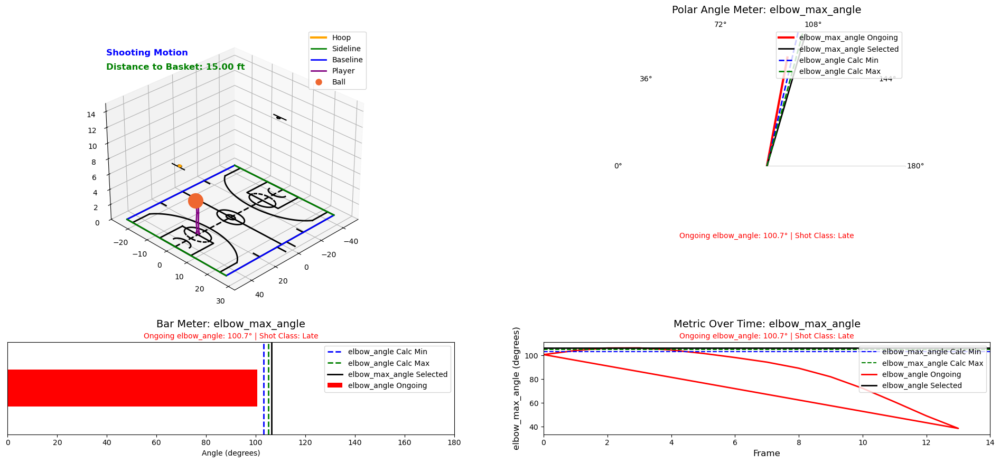

In [8]:
# Calculated, Bayesian, and SHAP feedback logic in `update_meter_with_mode`.
"""
Updated to unify calculated, bayesian, and shap feedback logic in `update_meter_with_mode`.
Introduces a polar subplot for the angle meter with angular ticks and a dynamic line graph.
"""

import logging
import pandas as pd 
import json
from IPython.display import HTML, display
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib.lines import Line2D
from matplotlib.gridspec import GridSpec
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from mplbasketball.court3d import Court3D, draw_court_3d
import matplotlib as mpl
import numpy as np

from animate.court import draw_court, get_hoop_position
from animate.viewpoints import get_viewpoint
from animate.calc_bayes_shap_feature_engineering import automated_bayes_shap_summary
from matplotlib.patches import Wedge

# Configure logging
logger = logging.getLogger('bayes_animate')
if not logger.hasHandlers():
    logger.setLevel(logging.DEBUG)  # Set to DEBUG to capture all logs
    handler = logging.StreamHandler()
    formatter = logging.Formatter('%(asctime)s - %(levelname)s - %(message)s')
    handler.setFormatter(formatter)
    logger.addHandler(handler)

# Increase the animation embed limit to 30 MB
mpl.rcParams['animation.embed_limit'] = 30.0  # Value is in MB

# Define calculated metrics list
CALCULATED_METRICS = [
    'release_knee_angle',
    'release_wrist_angle',
    'release_elbow_angle',
    'wrist_max_angle',
    'elbow_max_angle',
    'knee_max_angle'
]


def load_bayesian_metrics_dict(
    json_path: str,
    debug: bool = False
) -> dict:
    """
    Load the Bayesian metrics dictionary from a JSON file.

    Parameters:
        json_path (str): Path to the JSON file.
        debug (bool): Whether to print debug information. Default is False.

    Returns:
        dict: Bayesian metrics dictionary without 'filter_name'.
    """
    try:
        with open(json_path, 'r') as f:
            bayesian_metrics_dict = json.load(f)
        
        if debug:
            logger.debug(f"Loaded Bayesian metrics dictionary from {json_path}")
            logger.debug(json.dumps(bayesian_metrics_dict, indent=4))
        return bayesian_metrics_dict
    except FileNotFoundError:
        logger.error(f"Bayesian metrics JSON file not found at {json_path}")
        raise
    except json.JSONDecodeError:
        logger.error(f"JSON decoding failed for file {json_path}")
        raise

def generate_feedback_table_all_metrics(feedback_mode, bayesian_metrics_dict, trial_data, debug=False):
    """
    Generates a comprehensive feedback table for all metrics based on the feedback mode.
    
    Parameters:
        feedback_mode (str): The mode of feedback ('bayesian', 'shap', 'calculated').
        bayesian_metrics_dict (dict): Dictionary containing Bayesian metrics for all selected metrics.
        trial_data (pd.DataFrame): DataFrame containing the trial data.
        debug (bool): If True, outputs debugging information.
    
    Returns:
        pd.DataFrame: A DataFrame containing the feedback data for all metrics, including the actual metric value
                    ('actual_value') for comparison with the classification.
    """
    try:
        feedback_records = []

        for metric_key, metric_info in bayesian_metrics_dict.items():
            # Use the metric key as the selected metric.
            selected_metric = metric_key  # e.g., 'release_ball_direction_x'
            filter_name = metric_info.get('filter_name', selected_metric)

            record = {
                'Metric_Key': metric_key,
                'Ongoing Metric Name': filter_name
            }
            if debug:
                logger.debug(f"Processing metric: {metric_key} (Filter: {filter_name})")
            
            # Define columns based on feedback mode.
            if feedback_mode.lower() == "bayesian":
                columns = {
                    'bayes_classification': f"{selected_metric}_bayes_classification",
                    'bayes_optimized': f"{selected_metric}_bayes_optimized",
                    'bayes_max': f"{selected_metric}_bayes_max",
                    'bayes_min': f"{selected_metric}_bayes_min",
                    'bayes_unit_change': f"{selected_metric}_bayes_unit_change",
                    'shap_importance': f"shap_{selected_metric}_importance"
                }
            elif feedback_mode.lower() == "shap":
                columns = {
                    'shap_unit_change': f"shap_{selected_metric}_unit_change",
                    'shap_unit': f"shap_{selected_metric}_unit",
                    'shap_direction': f"shap_{selected_metric}_direction",
                    'shap_importance': f"shap_{selected_metric}_importance",
                    'shap_goal': f"shap_{selected_metric}_goal",
                    'shap_min': f"shap_{selected_metric}_min",
                    'shap_max': f"shap_{selected_metric}_max",
                    'shap_classification': f"shap_{selected_metric}_classification"
                }
            elif feedback_mode.lower() == "calculated":
                columns = {
                    'filtered_optimal_min': f"{selected_metric}_filtered_optimal_min",
                    'filtered_optimal_max': f"{selected_metric}_filtered_optimal_max",
                    'shot_classification': f"{selected_metric}_shot_classification"
                }
            else:
                raise ValueError("Invalid feedback mode selected.")

            # Extract values from trial_data for the defined columns.
            for key, col in columns.items():
                if col in trial_data.columns:
                    value = trial_data.at[0, col]
                    record[key] = value
                    if debug:
                        logger.debug(f"  {key}: {value}")
                else:
                    record[key] = np.nan
                    logger.warning(f"  Missing column: {col}")

            # NEW: Add the actual metric value from trial_data for comparison.
            if selected_metric in trial_data.columns:
                record['actual_value'] = trial_data.at[0, selected_metric]
                if debug:
                    logger.debug(f"  actual_value: {record['actual_value']}")
            else:
                record['actual_value'] = np.nan
                logger.warning(f"  Missing ongoing metric column: {selected_metric}")
            
            feedback_records.append(record)

        feedback_df = pd.DataFrame(feedback_records)

        if debug:
            logger.debug("Feedback table generated successfully.")
            logger.debug(feedback_df.head())

        return feedback_df

    except Exception as e:
        logger.error(f"Error in generate_feedback_table_all_metrics: {e}")
        raise




def add_bayes_optimal_lines(
    ax: plt.Axes,
    min_angle: float,
    max_angle: float,
    feedback_mode: str = None,  # new
    debug: bool = False
) -> None:
    """
    Add optimal min and max lines to the angle meter, including release min and max angles.
    """
    try:
        # Convert angles to radians
        min_angle_rad = min_angle * np.pi / 180
        max_angle_rad = max_angle * np.pi / 180

        # Check if lines already exist
        if not hasattr(ax, 'optimal_min_line'):
            ax.optimal_min_line, = ax.plot(
                [0, min_angle_rad], [0, 1], color='blue', lw=2, linestyle="--", label='Bayes Min'
            )
        if not hasattr(ax, 'optimal_max_line'):
            ax.optimal_max_line, = ax.plot(
                [0, max_angle_rad], [0, 1], color='green', lw=2, linestyle="--", label='Bayes Max'
            )

        if debug:
            logger.debug(
                f"Added optimal lines at {min_angle}°, {max_angle}° with labels 'Bayes Min' and 'Bayes Max'."
            )
    except Exception as e:
        logger.error(f"Error in add_bayes_optimal_lines: {e}")
        raise

def add_bayes_optimal_lines_to_bar(ax_bar, min_val, max_val, selected_metric: str, feedback_mode: str, debug=False):
    try:
        # Determine the labels based on the feedback mode:
        if feedback_mode.lower() == "shap":
            min_label = f"{selected_metric} SHAP Min"
            max_label = f"{selected_metric} SHAP Max"
        elif feedback_mode.lower() == "calculated":
            min_label = f"{selected_metric} Calc Min"
            max_label = f"{selected_metric} Calc Max"
        else:  # Assume bayesian or default
            min_label = f"{selected_metric} Bayes Min"
            max_label = f"{selected_metric} Bayes Max"

        if not hasattr(ax_bar, 'bar_min_line'):
            ax_bar.bar_min_line = ax_bar.axvline(x=min_val, color='blue', lw=2, linestyle='--', label=min_label)
        if not hasattr(ax_bar, 'bar_max_line'):
            ax_bar.bar_max_line = ax_bar.axvline(x=max_val, color='green', lw=2, linestyle='--', label=max_label)
        if debug:
            logger.debug(f"Added bar optimal lines at {min_val} and {max_val} with labels '{min_label}' and '{max_label}'.")
    except Exception as e:
        logger.error(f"Error in add_bayes_optimal_lines_to_bar: {e}")
        raise


def initialize_bayes_elements(
    ax: plt.Axes,
    connections: list,
    player_color: str,
    player_lw: float,
    ball_color: str,
    ball_size: float,
    debug: bool = False
) -> (dict, plt.Line2D, plt.Text, plt.Text, plt.Text):
    """
    Initialize plot elements such as lines for the player skeleton and the ball.
    """
    try:
        # Initialize lines for each body connection
        lines = {connection: ax.plot([], [], [], c=player_color, lw=player_lw)[0] for connection in connections}
        
        # Initialize the ball as a point
        ball, = ax.plot([], [], [], "o", markersize=ball_size, c=ball_color)
        
        # Text elements for annotations
        release_text = ax.text2D(0.05, 0.95, "", transform=ax.transAxes, color="red", fontsize=14, weight="bold")
        motion_text = ax.text2D(0.05, 0.90, "", transform=ax.transAxes, color="blue", fontsize=12, weight="bold")
        
        # New text element for distance (positioned below motion_text)
        distance_text = ax.text2D(0.05, 0.85, "", transform=ax.transAxes, color="green", fontsize=12, weight="bold")
        
        if debug:
            logger.debug("Elements initialized (lines, ball, text labels).")
        
        return lines, ball, release_text, motion_text, distance_text
    except Exception as e:
        logger.error(f"Error initializing elements: {e}")
        raise

def update_bayes_frame(
    ax: plt.Axes,
    frame: int,
    df: pd.DataFrame,
    release_frame: int,
    lines: dict,
    ball: plt.Line2D,
    release_text: plt.Text,
    motion_text: plt.Text,
    connections: list,
    ball_color: str,
    highlight_color: str,
    debug: bool = False
):
    """
    Update the player's skeleton, ball position, and annotations for each frame.
    """
    try:
        # Update lines based on player joint positions
        for connection in connections:
            joint_start, joint_end = connection
            x_start = df.at[frame, f"{joint_start}_x"]
            y_start = df.at[frame, f"{joint_start}_y"]
            z_start = df.at[frame, f"{joint_start}_z"]
            x_end = df.at[frame, f"{joint_end}_x"]
            y_end = df.at[frame, f"{joint_end}_y"]
            z_end = df.at[frame, f"{joint_end}_z"]
            lines[connection].set_data([x_start, x_end], [y_start, y_end])
            lines[connection].set_3d_properties([z_start, z_end])
        
        # Update ball position
        ball_x = df.at[frame, "ball_x"]
        ball_y = df.at[frame, "ball_y"]
        ball_z = df.at[frame, "ball_z"]
        ball.set_data([ball_x], [ball_y])
        ball.set_3d_properties([ball_z])
        
        # Update annotations
        if frame == release_frame:
            release_text.set_text("Release Point")
            release_text.set_color(highlight_color)
        else:
            release_text.set_text("")
        
        if df.at[frame, "shooting_motion"] == 1:
            motion_text.set_text("Shooting Motion")
        else:
            motion_text.set_text("")
        
        if debug:
            logger.debug(f"Updated frame {frame}: Player and ball positions updated.")
    except Exception as e:
        logger.error(f"Error updating frame {frame}: {e}")
        raise


def update_meter_with_mode(
    ax_meter,
    df,
    frame,
    needle,
    one_liner,  # single text element for combined information
    angle_key: str,
    feedback_key: str,
    feedback_mode: str = "calculated",
    bayesian_metrics_dict: dict = None,
    debug: bool = False,
    conditional_max: bool = False
):
    """
    Update the polar angle meter based on the chosen feedback mode.
    This version updates a single dynamic text element (one_liner) that shows:
      "Ongoing {selected_metric_filter_name}: {angle:.1f}°"
    and, for SHAP feedback, appends the SHAP classification, unit change, unit, direction, and importance.
    
    Additionally, for calculated feedback mode, the shot classification is appended to the text.
    
    Parameters:
      - ax_meter: The polar axes.
      - df: DataFrame with the current frame data.
      - frame: The current frame index.
      - needle: The dynamic needle line.
      - one_liner: The single text element to display combined information.
      - angle_key: The column name for the ongoing angle (usually the filter name).
      - feedback_key: The key for looking up the metric in the dictionary.
      - feedback_mode: One of "calculated", "bayesian", or "shap".
      - bayesian_metrics_dict: The dictionary with metric info.
      - debug: If True, print debug information.
      - conditional_max: If True, apply conditional logic for max lines.
    """
    try:
        # Update the needle and compute the current angle in radians
        current_angle_degs = df.loc[frame, angle_key]
        rad = current_angle_degs * np.pi / 180.0
        needle.set_data([rad, rad], [0, 0.8])
        
        # Update gauge fill if it exists
        if hasattr(ax_meter, 'gauge_fill'):
            ax_meter.gauge_fill.theta2 = current_angle_degs
            if debug:
                print(f"Gauge fill updated: theta2={current_angle_degs}°.")
        
        # Start building the info string for the one-liner text element
        info = f"Ongoing {angle_key}: {current_angle_degs:.1f}°"
        
        if feedback_mode.lower() == "calculated":
            # --- NEW CODE: Compute optimal range based on percentiles for calculated feedback ---
            if selected_metric := feedback_key:  # use the selected metric name (or feedback_key)
                if selected_metric in df.columns:
                    # Fallback to the existing fixed columns if available
                    calc_min_col = f"{feedback_key}_filtered_optimal_min"
                    calc_max_col = f"{feedback_key}_filtered_optimal_max"
                    calc_min = df.loc[frame, calc_min_col] if calc_min_col in df.columns else np.nan
                    calc_max = df.loc[frame, calc_max_col] if calc_max_col in df.columns else np.nan
                    if debug:
                        print(f"Using fallback columns: {calc_min_col} and {calc_max_col}.")
            else:
                raise ValueError("Selected metric not found in DataFrame.")
            
            # Draw or update the calculated optimal lines
            if not hasattr(ax_meter, 'calc_min_line'):
                calc_min_rad = calc_min * np.pi / 180.0
                ax_meter.calc_min_line, = ax_meter.plot([0, calc_min_rad], [0, 1],
                                                        color='blue', lw=2, linestyle='--',
                                                        label=f"{angle_key} Calc Min")
                if debug:
                    print(f"Created Calculated Min line at {calc_min:.1f}°.")
            else:
                calc_min_rad = calc_min * np.pi / 180.0
                ax_meter.calc_min_line.set_data([0, calc_min_rad], [0, 1])
                if debug:
                    print(f"Updated Calculated Min line to {calc_min:.1f}°.")
            if not hasattr(ax_meter, 'calc_max_line'):
                calc_max_rad = calc_max * np.pi / 180.0
                if (not conditional_max) or (current_angle_degs >= calc_max):
                    ax_meter.calc_max_line, = ax_meter.plot([0, calc_max_rad], [0, 1],
                                                            color='green', lw=2, linestyle='--',
                                                            label=f"{angle_key} Calc Max")
                    if debug:
                        print(f"Created Calculated Max line at {calc_max:.1f}°.")
            else:
                calc_max_rad = calc_max * np.pi / 180.0
                if (not conditional_max) or (current_angle_degs >= calc_max):
                    ax_meter.calc_max_line.set_data([0, calc_max_rad], [0, 1])
                    if debug:
                        print(f"Updated Calculated Max line to {calc_max:.1f}°.")
            
            # NEW: Append shot classification to the info string if available
            shot_class_col = f"{feedback_key}_shot_classification"
            if shot_class_col in df.columns:
                shot_classification = df.loc[frame, shot_class_col]
                info += f" | Shot Class: {shot_classification}"
            else:
                info += " | Shot Class: N/A"
        
        elif feedback_mode.lower() == "bayesian":
            bayes_min_col = f"{feedback_key}_bayes_min"
            bayes_max_col = f"{feedback_key}_bayes_max"
            bayes_class_col = f"{feedback_key}_bayes_classification"
            if bayes_min_col in df.columns:
                bayes_min = df.loc[frame, bayes_min_col]
            else:
                bayes_min = bayesian_metrics_dict.get(feedback_key.lower(), {}).get("bayes_min", 0)
            if bayes_max_col in df.columns:
                bayes_max = df.loc[frame, bayes_max_col]
            else:
                bayes_max = bayesian_metrics_dict.get(feedback_key.lower(), {}).get("bayes_max", 180)
            if not hasattr(ax_meter, 'bayes_min_line'):
                ax_meter.bayes_min_line, = ax_meter.plot(
                    [0, bayes_min * np.pi / 180.0], [0, 1],
                    color='blue', lw=2, linestyle='--', label=f"{angle_key} Bayes Min"
                )
                if debug:
                    print(f"Created Bayes Min line at {bayes_min:.1f}°.")
            else:
                ax_meter.bayes_min_line.set_data([0, bayes_min * np.pi / 180.0], [0, 1])
                if debug:
                    print(f"Updated Bayes Min line to {bayes_min:.1f}°.")
            if (not conditional_max) or (current_angle_degs >= bayes_max):
                if not hasattr(ax_meter, 'bayes_max_line'):
                    ax_meter.bayes_max_line, = ax_meter.plot(
                        [0, bayes_max * np.pi / 180.0], [0, 1],
                        color='green', lw=2, linestyle='--', label=f"{angle_key} Bayes Max"
                    )
                    if debug:
                        print(f"Created Bayes Max line at {bayes_max:.1f}°.")
                else:
                    ax_meter.bayes_max_line.set_data([0, bayes_max * np.pi / 180.0], [0, 1])
                    if debug:
                        print(f"Updated Bayes Max line to {bayes_max:.1f}°.")
            if bayes_class_col in df.columns:
                bayes_classification = df.loc[frame, bayes_class_col]
            else:
                bayes_classification = bayesian_metrics_dict.get(feedback_key.lower(), {}).get("bayes_classification", "N/A")
            info += f" | Bayes Class: {bayes_classification}"
        
        elif feedback_mode.lower() == "shap":
            # Existing SHAP logic remains unchanged
            selected_metric = feedback_key  # for consistency
            shap_class_col = f"shap_{selected_metric}_classification"
            shap_unit_change_col = f"shap_{selected_metric}_unit_change"
            shap_unit_col = f"shap_{selected_metric}_unit"
            shap_direction_col = f"shap_{selected_metric}_direction"
            shap_imp_col = f"shap_{selected_metric}_importance"
            if shap_class_col in df.columns:
                shap_class = df.loc[frame, shap_class_col]
            else:
                shap_class = "N/A"
            if shap_unit_change_col in df.columns:
                shap_unit_change = df.loc[frame, shap_unit_change_col]
            else:
                shap_unit_change = "N/A"
            if shap_unit_col in df.columns:
                shap_unit = df.loc[frame, shap_unit_col]
            else:
                shap_unit = ""
            if shap_direction_col in df.columns:
                shap_direction = df.loc[frame, shap_direction_col]
            else:
                shap_direction = "N/A"
            if shap_imp_col in df.columns:
                shap_imp = df.loc[frame, shap_imp_col]
                try:
                    shap_importance = f"{float(shap_imp):.3f}"
                except (ValueError, TypeError):
                    shap_importance = shap_imp
            else:
                shap_importance = "N/A"
            # NEW code for SHAP min/max lines:
            shap_min_col = f"shap_{selected_metric}_min"
            shap_max_col = f"shap_{selected_metric}_max"
            if shap_min_col in df.columns:
                shap_min = df.loc[frame, shap_min_col]
            else:
                shap_min = 0
            if shap_max_col in df.columns:
                shap_max = df.loc[frame, shap_max_col]
            else:
                shap_max = 180
            shap_min_rad = shap_min * np.pi / 180.0
            shap_max_rad = shap_max * np.pi / 180.0
            if not hasattr(ax_meter, 'shap_min_line'):
                ax_meter.shap_min_line, = ax_meter.plot(
                    [0, shap_min_rad], [0, 1],
                    color='blue', lw=2, linestyle='--', label=f"{angle_key} SHAP Min"
                )
            else:
                ax_meter.shap_min_line.set_data([0, shap_min_rad], [0, 1])
            if (not conditional_max) or (current_angle_degs >= shap_max):
                if not hasattr(ax_meter, 'shap_max_line'):
                    ax_meter.shap_max_line, = ax_meter.plot(
                        [0, shap_max_rad], [0, 1],
                        color='green', lw=2, linestyle='--', label=f"{angle_key} SHAP Max"
                    )
                else:
                    ax_meter.shap_max_line.set_data([0, shap_max_rad], [0, 1])
            one_liner_str = (f"Ongoing {angle_key}: {df.loc[frame, angle_key]:.1f}° | "
                             f"SHAP Class: {shap_class} | Unit Change: {shap_unit_change} {shap_unit} | "
                             f"Direction: {shap_direction} | SHAP Imp: {shap_importance}")
        
        else:
            logger.warning(f"Unknown feedback mode: {feedback_mode}")
            info += " | Class: N/A | SHAP: N/A | Direction: N/A"
            if debug:
                print("Set default one-liner info to N/A for unknown feedback mode.")
        
        # For bayesian and non-SHAP modes, use the info string; for SHAP, use the one_liner_str built above
        one_liner.set_text(info if feedback_mode.lower() != "shap" else one_liner_str)
        
        if debug:
            print(f"Frame={frame}, feedback_mode='{feedback_mode}' => {one_liner.get_text()}")
    
    except Exception as e:
        logger.error(f"Error in update_meter_with_mode: {e}")
        raise








def initialize_bar_meter(ax_bar, min_val, max_val):
    """
    Initializes a horizontal bar to represent the angle from min_val to max_val.
    Returns the bar container so you can update it each frame.
    """
    ax_bar.set_xlim([min_val, max_val])
    ax_bar.set_ylim([-0.5, 0.5])  # Just enough space for a single bar
    ax_bar.set_xlabel("Angle (degrees)")
    ax_bar.set_yticks([])

    # Draw a single bar initially at zero
    bar_container = ax_bar.barh(
        y=0, width=0, height=0.4, color='red', align='center'
    )

    return bar_container

def update_bar_meter(bar_container, current_angle, min_val=0, max_val=180):
    """
    Updates the bar's width so that it visually represents the `current_angle`.
    """
    # bar_container is usually a list with a single bar (bar_container[0])
    bar = bar_container[0]
    
    # Constrain/clip angle if needed (optional).
    clipped_angle = max(min_val, min(current_angle, max_val))
    
    # Update the bar width
    bar.set_width(clipped_angle)



def initialize_line_graph(
    ax_line,
    static_min: float,
    static_max: float,
    selected_metric_filter_name: str,
    selected_metric: str,
    feedback_mode: str,
    debug=False
):
    """
    Initialize the line graph subplot with dynamic metric tracking.
    Updated to include the selected metric in the title and appropriate legend labels.
    
    static_min and static_max are the values to be used for the min and max lines.
    The dynamic (ongoing) metric line is drawn in red.
    
    CHANGES:
      - The title now includes the metric name.
      - The red ongoing line is labeled as "{selected_metric} Ongoing".
    """
    try:
        # CHANGED: Update title to include the metric name (or filter name)
        ax_line.set_title(f"Metric Over Time: {selected_metric}", fontsize=14, pad=20)
        ax_line.set_xlabel("Frame", fontsize=12)
        ax_line.set_ylabel(f"{selected_metric} (degrees)", fontsize=12)

        # Dynamic (ongoing) metric line in red, labeled appropriately
        line_metric, = ax_line.plot([], [], lw=2, color='red',
                                    label=f"{selected_metric_filter_name} Ongoing")

        # Determine labels based on feedback mode
        if feedback_mode.lower() == "shap":
            min_label = f"{selected_metric} SHAP Min"
            max_label = f"{selected_metric} SHAP Max"
        elif feedback_mode.lower() == "calculated":
            min_label = f"{selected_metric} Calc Min"
            max_label = f"{selected_metric} Calc Max"
        else:  # bayesian or default
            min_label = f"{selected_metric} Bayes Min"
            max_label = f"{selected_metric} Bayes Max"

        # Static min and max lines
        line_min = ax_line.axhline(y=static_min, color='blue', linestyle='--', label=min_label)
        line_max = ax_line.axhline(y=static_max, color='green', linestyle='--', label=max_label)

        # Optional trial max line (initially invisible)
        line_trial_max, = ax_line.plot([], [], lw=2, color='red', linestyle='--',
                                       label=f"{selected_metric} Trial Max")
        line_trial_max.set_visible(False)

        data_frames = []
        data_values = []

        # Set initial y-limits with padding
        initial_lower = static_min - 5
        initial_upper = static_max + 5
        ax_line.set_ylim(initial_lower, initial_upper)

        # Create a temporary legend (may be rebuilt later)
        ax_line.legend(loc='upper right')

        if debug:
            logger.debug("Line graph initialized with dynamic metric tracking.")

        return {
            'line_metric': line_metric,
            'line_min': line_min,
            'line_max': line_max,
            'line_trial_max': line_trial_max,
            'data_frames': data_frames,
            'data_values': data_values,
            'current_ymin': initial_lower,
            'current_ymax': initial_upper,
            'current_trial_max': static_max,
            'trial_max_reached': False
        }
    except Exception as e:
        logger.error(f"Error initializing line graph: {e}")
        raise



def animate_trial_with_calc_bayes_shap_angle_meter(
    df: pd.DataFrame,
    release_frame: int,
    selected_metric: str,
    bayesian_metrics_dict: dict,
    feedback_mode: str = "bayesian",
    viewpoint_name: str = "side_view_right",
    connections: list = None,
    zlim: float = 15.0,
    player_color: str = "purple",
    player_lw: float = 2.0,
    ball_color: str = "#ee6730",
    ball_size: float = 20.0,
    highlight_color: str = "red",
    show_court: bool = True,
    court_type: str = "nba",
    units: str = "ft",
    notebook_mode: bool = True,
    debug: bool = False,
    frames_to_animate: list = None,
    show_selected_metric: bool = False,
    # New arguments for toggling each plot:
    polar_plot: bool = True,
    bar_plot: bool = True,
    line_plot: bool = True
) -> HTML:
    """
    Animate a basketball trial with integrated angle and line meters.
    Each subplot builds its own legend based on the feedback mode and persistent line objects.
    
    NEW FEATURES:
      - The polar meter now includes a solid black line for "{selected_metric} Selected" in its legend.
      - The bar meter now includes a solid black line for "{selected_metric} Selected" in its legend.
      - In the polar plot, the dynamic "Ongoing: {angle}" text is removed (since the title already shows the angle)
        and instead a new text element is placed in the bottom 25% of the chart (centered) showing combined
        polar information (e.g. classification and SHAP details).
    
    All existing functionality remains intact.
    """
    try:
        if connections is None:
            logger.error("No connections provided for player skeleton.")
            raise ValueError("Connections list cannot be None.")

        if debug:
            logger.debug("Starting animation setup.")
            logger.debug(f"Total frames in DataFrame: {len(df)}")
            logger.debug(f"Release frame index provided: {release_frame}")
            logger.debug(f"Selected viewpoint: {viewpoint_name}")
            logger.debug(f"Selected metric for angle meter: {selected_metric}")

        # Retrieve viewpoint
        try:
            viewpoint = get_viewpoint(viewpoint_name)
            elev = viewpoint['elev']
            azim = viewpoint['azim']
            if debug:
                logger.debug(f"Retrieved viewpoint '{viewpoint_name}': elev={elev}, azim={azim}")
        except KeyError:
            logger.error(f"Invalid viewpoint_name: {viewpoint_name}. Using default.")
            viewpoint = get_viewpoint("side_view_right")
            elev = viewpoint['elev']
            azim = viewpoint['azim']
            if debug:
                logger.debug(f"Using default viewpoint: elev={elev}, azim={azim}")

        # Set up figure and subplots
        fig = plt.figure(figsize=(24, 10))
        gs = GridSpec(2, 2, figure=fig, height_ratios=[3, 1])
        
        # 3D subplot (always created)
        ax_3d = fig.add_subplot(gs[0, 0], projection='3d')
        ax_3d.view_init(elev=elev, azim=azim)
        ax_3d.set_zlim(0, zlim)

        # Create the polar meter if requested
        if polar_plot:
            ax_meter = fig.add_subplot(gs[0, 1], polar=True)
        else:
            ax_meter = None

        # Create the bar meter if requested
        if bar_plot:
            ax_bar = fig.add_subplot(gs[1, 0])
        else:
            ax_bar = None

        # Create the line graph if requested
        if line_plot:
            ax_line = fig.add_subplot(gs[1, 1])
        else:
            ax_line = None

        # --- Draw court and hoop on the 3D plot ---
        if show_court:
            draw_court(ax_3d, court_type=court_type, units=units, debug=debug)
            hoop_x, hoop_y, hoop_z = get_hoop_position(court_type=court_type, units=units, debug=debug)
        else:
            hoop_x = hoop_y = hoop_z = None

        # Initialize dynamic 3D plot elements
        lines, ball, release_text, motion_text, distance_text = initialize_bayes_elements(
            ax=ax_3d, connections=connections, player_color=player_color,
            player_lw=player_lw, ball_color=ball_color, ball_size=ball_size, debug=debug)

        # Retrieve the filter name for the selected metric
        metric_info = bayesian_metrics_dict.get(selected_metric.lower())
        if not metric_info:
            logger.error(f"Selected metric '{selected_metric}' not found in bayesian_metrics_dict.")
            raise ValueError(f"Selected metric '{selected_metric}' not found in bayesian_metrics_dict.")
        selected_metric_filter_name = metric_info.get('filter_name', selected_metric)
        if debug:
            logger.debug(f"Selected metric filter name: {selected_metric_filter_name}")

        # Compute static min/max values based on the feedback mode
        if feedback_mode.lower() == "shap":
            shap_min_col = f"shap_{selected_metric}_min"
            shap_max_col = f"shap_{selected_metric}_max"
            static_min = df.loc[0, shap_min_col] if shap_min_col in df.columns else 0
            static_max = df.loc[0, shap_max_col] if shap_max_col in df.columns else 180
        elif feedback_mode.lower() == "calculated":
            # --- UPDATED: Use filtered optimal columns for calculated feedback mode ---
            calc_min_col = f"{selected_metric}_filtered_optimal_min"
            calc_max_col = f"{selected_metric}_filtered_optimal_max"
            static_min = df.loc[0, calc_min_col] if calc_min_col in df.columns else 0
            static_max = df.loc[0, calc_max_col] if calc_max_col in df.columns else 180
        else:
            static_min = metric_info.get("bayes_min", 0)
            static_max = metric_info.get("bayes_max", 180)

        # ----- Initialize the Polar Meter -----
        if polar_plot:
            if not hasattr(ax_meter, 'gauge_fill'):
                ax_meter.gauge_fill = Wedge(center=(0, 0), r=1.0, theta1=0, theta2=0,
                                            facecolor='red', alpha=0.3, transform=ax_meter.transData)
                ax_meter.add_patch(ax_meter.gauge_fill)
            needle, = ax_meter.plot([0, 0], [0, 0.8], lw=3, color='red',
                                    label=f"{selected_metric.lower()} Ongoing")
            ax_meter.gauge_fill.set_zorder(1)
            needle.set_zorder(2)
            
            ax_meter.set_title(f"Polar Angle Meter: {selected_metric}", fontsize=14, pad=20)
            
            # NEW: Create a single one-liner text element at the bottom 25% of the chart.
            one_liner = ax_meter.text(0.5, 0.25, "", transform=ax_meter.transAxes,
                                    ha='center', va='center', fontsize=10, color='red', zorder=12)
            
            ax_meter.set_theta_offset(np.pi)
            ax_meter.set_theta_direction(-1)
            angle_ticks = np.linspace(0, np.pi, 6)
            angle_labels = [f'{int(deg)}°' for deg in np.linspace(0, 180, 6)]
            ax_meter.set_xticks(angle_ticks)
            ax_meter.set_xticklabels(angle_labels)
            ax_meter.set_yticklabels([])
            ax_meter.grid(False)
            ax_meter.set_ylim(0, 1)
            ax_meter.fill_between(np.linspace(np.pi, 2*np.pi, 100), 0, 1, color="white", zorder=10)
            ax_meter.spines['polar'].set_visible(False)
            ax_meter.plot([0, np.pi], [0, 1], color='black', lw=1)
            
            # NEW: Create the selected metric line (solid black) in the polar plot if not present
            selected_value = df[selected_metric].iloc[0]
            selected_value_rad = selected_value * np.pi / 180.0
            if not hasattr(ax_meter, 'selected_metric_line'):
                ax_meter.selected_metric_line, = ax_meter.plot(
                    [0, selected_value_rad], [0, 1],
                    color='black', lw=2, linestyle='-', label=f"{selected_metric} Selected"
                )
            # Build the polar legend so it includes the selected line
            ax_meter.legend(loc='upper right')
            
            # Instead of multiple text elements, we now store only one_liner.
            angle_meter_obj = {
                'ax_meter': ax_meter,
                'needle': needle,
                'one_liner': one_liner  # <-- our combined dynamic text element
            }
        else:
            angle_meter_obj = None

        # ----- Initialize the Bar Meter -----
        if bar_plot:
            ax_bar.set_title(f"Bar Meter: {selected_metric}", fontsize=14, pad=20)
            # NEW: Add a dynamic text element below the title for the bar meter
            bar_ongoing_text = ax_bar.text(0.5, 1.02, "", transform=ax_bar.transAxes,
                                           ha='center', va='bottom', fontsize=10, color='red')
            bar_container = initialize_bar_meter(ax_bar, min_val=0, max_val=180)
            add_bayes_optimal_lines_to_bar(ax_bar, static_min, static_max, selected_metric_filter_name, feedback_mode, debug)
            # NEW: Label the red bar as "Ongoing" and also create a vertical black line for the selected value
            bar_container[0].set_label(f"{selected_metric_filter_name} Ongoing")
            if not hasattr(ax_bar, 'selected_metric_line'):
                selected_value = df[selected_metric].iloc[0]
                ax_bar.selected_metric_line = ax_bar.axvline(
                    x=selected_value, color='black', lw=2, linestyle='-', label=f"{selected_metric} Selected"
                )
            # Rebuild the bar meter legend to include all handles
            bar_handles = []
            if hasattr(ax_bar, 'bar_min_line'):
                bar_handles.append(ax_bar.bar_min_line)
            if hasattr(ax_bar, 'bar_max_line'):
                bar_handles.append(ax_bar.bar_max_line)
            if hasattr(ax_bar, 'selected_metric_line'):
                bar_handles.append(ax_bar.selected_metric_line)
            if hasattr(ax_bar, 'trial_release_line'):
                bar_handles.append(ax_bar.trial_release_line)
            bar_handles.append(bar_container[0])
            ax_bar.legend(handles=bar_handles, loc='upper right')
        else:
            bar_container = None

        # ----- Initialize the Line Graph -----
        if line_plot:
            line_graph_obj = initialize_line_graph(ax_line, static_min, static_max, selected_metric_filter_name, selected_metric, feedback_mode, debug)
            # NEW: Add a dynamic text element below the title for the line graph
            line_ongoing_text = ax_line.text(0.5, 1.02, "", transform=ax_line.transAxes,
                                            ha='center', va='bottom', fontsize=10, color='red')
            # Optionally add a selected metric line to the line graph (already handled in initialize_line_graph if needed)
            if show_selected_metric:
                selected_value = df[selected_metric].iloc[0]
                line_graph_obj['selected_metric_line'] = ax_line.axhline(
                    y=selected_value, color='black', linestyle='-', lw=2, label=f"{selected_metric_filter_name} Selected"
                )
                # Rebuild the legend to include the selected line:
                line_handles = [
                    line_graph_obj['line_min'],
                    line_graph_obj['line_max'],
                    line_graph_obj['line_metric'],
                    line_graph_obj['selected_metric_line']
                ]
                ax_line.legend(handles=line_handles, loc='upper right')
        else:
            line_graph_obj = None
            line_ongoing_text = None

        # ----- Create legend for 3D plot (unchanged) -----
        hoop_handle = Line2D([0], [0], color='orange', lw=3, label='Hoop')
        baseline_handle = Line2D([0], [0], color='blue', lw=2, label='Baseline')
        sideline_handle = Line2D([0], [0], color='green', lw=2, label='Sideline')
        player_handle = Line2D([0], [0], color=player_color, lw=player_lw, label='Player')
        ball_handle = Line2D([0], [0], marker='o', color='w', label='Ball', markerfacecolor=ball_color, markersize=10)
        ax_3d.legend(handles=[hoop_handle, sideline_handle, baseline_handle, player_handle, ball_handle], loc='upper right')

        if debug:
            logger.debug(f"Initialized angle meter for metric '{selected_metric_filter_name}' (if enabled).")

        # Adjust line graph y-limits if line graph exists
        if line_plot:
            ax_line.set_ylim(bottom=min(static_min, df[selected_metric_filter_name].min() - 5),
                             top=max(static_max, df[selected_metric_filter_name].max() + 5))
            if debug:
                logger.debug("Adjusted y-limits for line graph.")

        # Create trial release lines if a release point exists (colored purple)
        if df.loc[release_frame, 'release_point_filter'] == 1:
            trial_release = df.loc[release_frame, selected_metric_filter_name]
            if debug:
                logger.debug(f"Trial release for metric '{selected_metric_filter_name}': {trial_release}")
        else:
            trial_release = None

        # ----- Define the update function for the animation -----
        def update_func(frame: int):
            # Update the 3D plot elements (always)
            update_bayes_frame(ax=ax_3d, frame=frame, df=df, release_frame=release_frame,
                            lines=lines, ball=ball, release_text=release_text,
                            motion_text=motion_text, connections=connections,
                            ball_color=ball_color, highlight_color=highlight_color, debug=debug)
            
            # Update the polar meter if enabled
            if polar_plot and angle_meter_obj:
                update_meter_with_mode(
                    ax_meter=angle_meter_obj['ax_meter'], df=df, frame=frame,
                    needle=angle_meter_obj['needle'], one_liner=angle_meter_obj['one_liner'],
                    angle_key=selected_metric_filter_name, feedback_key=selected_metric,
                    feedback_mode=feedback_mode, bayesian_metrics_dict=bayesian_metrics_dict, debug=debug
                )

                if frame == 0:
                    angle_meter_obj['ax_meter'].legend(loc='upper right')
            
            # Build the dynamic one-liner text based on the feedback mode.
            if feedback_mode.lower() == "bayesian":
                bayes_class_col = f"{selected_metric}_bayes_classification"
                if bayes_class_col in df.columns:
                    bayes_class = df.loc[frame, bayes_class_col]
                else:
                    bayes_class = "N/A"
                bayes_unit_change_col = f"{selected_metric}_bayes_unit_change"
                if bayes_unit_change_col in df.columns:
                    bayes_unit_change = df.loc[frame, bayes_unit_change_col]
                else:
                    bayes_unit_change = "N/A"
                one_liner_str = (f"Ongoing {selected_metric_filter_name}: {df.loc[frame, selected_metric_filter_name]:.1f}° | "
                                f"Bayes Class: {bayes_class} | Unit Change: {bayes_unit_change}")
            elif feedback_mode.lower() == "shap":
                # Define SHAP columns.
                shap_class_col = f"shap_{selected_metric}_classification"
                shap_unit_change_col = f"shap_{selected_metric}_unit_change"
                shap_unit_col = f"shap_{selected_metric}_unit"
                shap_direction_col = f"shap_{selected_metric}_direction"
                shap_importance_col = f"shap_{selected_metric}_importance"
                # Retrieve each value or use a default.
                if shap_class_col in df.columns:
                    shap_class = df.loc[frame, shap_class_col]
                else:
                    shap_class = "N/A"
                if shap_unit_change_col in df.columns:
                    shap_unit_change = df.loc[frame, shap_unit_change_col]
                else:
                    shap_unit_change = "N/A"
                if shap_unit_col in df.columns:
                    shap_unit = df.loc[frame, shap_unit_col]
                else:
                    shap_unit = ""
                if shap_direction_col in df.columns:
                    shap_direction = df.loc[frame, shap_direction_col]
                else:
                    shap_direction = "N/A"
                if shap_importance_col in df.columns:
                    shap_imp = df.loc[frame, shap_importance_col]
                    try:
                        shap_importance = f"{float(shap_imp):.3f}"
                    except (ValueError, TypeError):
                        shap_importance = shap_imp
                else:
                    shap_importance = "N/A"
                # Build the one-liner string for SHAP feedback.
                one_liner_str = (f"Ongoing {selected_metric_filter_name}: {df.loc[frame, selected_metric_filter_name]:.1f}° | "
                                f"SHAP Class: {shap_class} | Unit Change: {shap_unit_change} {shap_unit} | "
                                f"Direction: {shap_direction} | SHAP Imp: {shap_importance}")
            elif feedback_mode.lower() == "calculated":
                # NEW: Append shot classification to the one-liner text for calculated feedback mode.
                shot_class_col = f"{selected_metric}_shot_classification"
                if shot_class_col in df.columns:
                    shot_classification = df.loc[frame, shot_class_col]
                else:
                    shot_classification = "N/A"
                one_liner_str = (f"Ongoing {selected_metric_filter_name}: {df.loc[frame, selected_metric_filter_name]:.1f}° | "
                                 f"Shot Class: {shot_classification}")
            else:
                one_liner_str = (f"Ongoing {selected_metric_filter_name}: {df.loc[frame, selected_metric_filter_name]:.1f}°")

            
            # Update the bar meter one-liner text.
            if bar_plot and bar_container is not None:
                current_angle = df.loc[frame, selected_metric_filter_name]
                update_bar_meter(bar_container=bar_container, current_angle=current_angle, min_val=0, max_val=180)
                bar_ongoing_text.set_text(one_liner_str)
                if 'distance_to_basket' in df.columns:
                    distance = df.at[frame, 'distance_to_basket']
                    distance_text.set_text(f"Distance to Basket: {distance:.2f} ft" if not pd.isna(distance) else "")
                else:
                    distance_text.set_text("")
            
            # Update the line graph one-liner text.
            if line_plot and line_graph_obj is not None:
                frame_number = frame
                metric_value = df.loc[frame, selected_metric_filter_name]
                line_graph_obj['data_frames'].append(frame_number)
                line_graph_obj['data_values'].append(metric_value)
                line_graph_obj['line_metric'].set_data(line_graph_obj['data_frames'], line_graph_obj['data_values'])
                ax_line.set_xlim(left=0, right=max(line_graph_obj['data_frames']) + 1)
                current_min = min(line_graph_obj['data_values']) - 5
                current_max = max(line_graph_obj['data_values']) + 5
                if current_min < line_graph_obj['current_ymin'] or current_max > line_graph_obj['current_ymax']:
                    new_ymin = min(line_graph_obj['current_ymin'], current_min)
                    new_ymax = max(line_graph_obj['current_ymax'], current_max)
                    ax_line.set_ylim(new_ymin, new_ymax)
                    line_graph_obj['current_ymin'] = new_ymin
                    line_graph_obj['current_ymax'] = new_ymax
                if "max_" in selected_metric:
                    if metric_value > line_graph_obj['current_trial_max']:
                        line_graph_obj['current_trial_max'] = metric_value
                        if not hasattr(line_graph_obj['line_trial_max'], 'xdata'):
                            line_graph_obj['line_trial_max'].set_data([frame_number], [metric_value])
                        else:
                            current_x = line_graph_obj['line_trial_max'].get_xdata()
                            current_y = line_graph_obj['line_trial_max'].get_ydata()
                            new_x = np.append(current_x, frame_number)
                            new_y = np.append(current_y, metric_value)
                            line_graph_obj['line_trial_max'].set_data(new_x, new_y)
                        line_graph_obj['line_trial_max'].set_visible(True)
                else:
                    line_graph_obj['line_trial_max'].set_visible(False)
                if trial_release is not None and frame >= release_frame:
                    if "release_" in selected_metric and line_graph_obj and 'trial_release_line' in line_graph_obj:
                        line_graph_obj['trial_release_line'].set_visible(True)
                line_ongoing_text.set_text(one_liner_str)
            
            fig.canvas.draw_idle()

        if frames_to_animate:
            frames = frames_to_animate
        else:
            frames = range(len(df))

        anim = FuncAnimation(fig, update_func, frames=frames, interval=1000/30, blit=False)
        if notebook_mode:
            return HTML(anim.to_jshtml())
        else:
            return anim

    except json.JSONDecodeError:
        logger.error("Error decoding JSON.")
        raise
    except Exception as e:
        logger.error(f"An unexpected error occurred: {e}")
        raise








    
def display_combined_output(feedback_table, animation_html, feedback_mode):
    """
    Displays the feedback table and animation side by side.

    Parameters:
        feedback_table (pd.DataFrame): The feedback metrics table.
        animation_html (IPython.display.HTML): The animation HTML object.
        feedback_mode (str): The current feedback mode for labeling purposes.
    """
    # Convert Feedback Table to HTML
    feedback_table_html = feedback_table.to_html(index=False)

    # Create an HTML layout to display both the table and the animation side by side
    combined_html = f"""
    <div style="display: flex; justify-content: space-between;">
        <div style="width: 50%;">
            <h3>Feedback Table ({feedback_mode.capitalize()} Mode)</h3>
            {feedback_table_html}
        </div>
        <div style="width: 45%;">
            <h3>Animation</h3>
            {animation_html.data}
        </div>
    </div>
    """

    # Display the combined layout
    display(HTML(combined_html))


def run_shot_meter_animation(
    bayesian_metrics_json_path: str,
    merged_data_path: str,
    trial_id: str,
    selected_metric: str,
    feedback_mode: str = "bayesian",
    viewpoint_name: str = "diagonal_player_centric",
    connections: list = None,
    debug: bool = False,
    frames_to_animate: list = None,
    show_selected_metric: bool = False,
    polar_plot: bool = True,
    bar_plot: bool = True,
    line_plot: bool = True,
    lower_range_min_percentile: int = 10,
    upper_range_max_percentile: int = 90
):
    """
    Run the complete shot-meter animation pipeline.
    This function loads the metrics and data, initializes all plots (3D, polar, bar, line),
    runs the animation, and displays the combined output.
    
    Note: The texts placed immediately under each subplot title display detailed feedback per model.
    """
    try:
        bayesian_metrics_dict = load_bayesian_metrics_dict(bayesian_metrics_json_path, debug=debug)
        merged_data = pd.read_csv(merged_data_path)
        if debug:
            logger.debug(f"Merged data loaded with {len(merged_data)} rows.")
        else:
            print("Data loaded successfully.")
        
        trial_data = merged_data[merged_data['trial_id'] == trial_id].sort_values(by='frame_time').reset_index(drop=True)
        if trial_data.empty:
            logger.error(f"No data found for trial_id {trial_id}.")
            raise ValueError(f"No data found for trial_id {trial_id}.")
        if debug:
            logger.debug(f"Trial data for {trial_id} contains {len(trial_data)} frames (shape {trial_data.shape}).")
        
        metric_info = bayesian_metrics_dict.get(selected_metric.lower())
        if not metric_info:
            logger.error(f"Selected metric '{selected_metric}' not found in the metrics dictionary.")
            raise ValueError(f"Selected metric '{selected_metric}' not found.")
        selected_metric_filter_name = metric_info.get('filter_name', selected_metric)
        if debug:
            logger.debug(f"Selected metric filter name: {selected_metric_filter_name}")
        
        release_frames = trial_data.index[trial_data["release_point_filter"] == 1].tolist()
        release_frame = release_frames[0] if release_frames else None
        if release_frame is None:
            logger.warning(f"No release frame found for trial {trial_id}.")
        else:
            if debug:
                logger.debug(f"Release frame for trial {trial_id} is {release_frame}.")
        
        shooting_frames = trial_data[trial_data['shooting_motion'] == 1].index.tolist()
        if release_frame is not None and release_frame not in shooting_frames:
            shooting_frames.append(release_frame)
        if debug:
            logger.debug(f"Animating {len(shooting_frames)} frames.")
        
        feedback_table = generate_feedback_table_all_metrics(feedback_mode, bayesian_metrics_dict, trial_data, debug=debug)
        print("\nFeedback Table:")
        display(feedback_table)
        
        animation_html = animate_trial_with_calc_bayes_shap_angle_meter(
            df=trial_data,
            release_frame=release_frame,
            selected_metric=selected_metric,
            bayesian_metrics_dict=bayesian_metrics_dict,
            feedback_mode=feedback_mode,
            viewpoint_name=viewpoint_name,
            connections=connections,
            debug=debug,
            frames_to_animate=shooting_frames,
            show_selected_metric=show_selected_metric,
            polar_plot=polar_plot,
            bar_plot=bar_plot,
            line_plot=line_plot
        )
        
        display_combined_output(feedback_table, animation_html, feedback_mode)
        if not debug:
            print("Shot meter animation completed successfully.")
    
    except Exception as e:
        logger.error(f"Error in run_shot_meter_animation: {e}")
        raise


def initialize_bar_meter(ax_bar, min_val, max_val):
    """
    Initialize a horizontal bar for the bar meter.
    """
    ax_bar.set_xlim([min_val, max_val])
    ax_bar.set_ylim([-0.5, 0.5])
    ax_bar.set_xlabel("Angle (degrees)")
    ax_bar.set_yticks([])
    bar_container = ax_bar.barh(y=0, width=0, height=0.4, color='red', align='center')
    return bar_container

def update_bar_meter(bar_container, current_angle, min_val=0, max_val=180):
    """
    Update the bar meter width based on the current angle.
    """
    bar = bar_container[0]
    clipped_angle = max(min_val, min(current_angle, max_val))
    bar.set_width(clipped_angle)

def initialize_line_graph(ax_line, static_min: float, static_max: float,
                          selected_metric_filter_name: str, selected_metric: str,
                          feedback_mode: str, debug=False):
    """
    Initialize the line graph subplot with dynamic metric tracking.
    static_min and static_max are used for the static min/max lines.
    """
    try:
        ax_line.set_title(f"Metric Over Time: {selected_metric}", fontsize=14, pad=20)
        ax_line.set_xlabel("Frame", fontsize=12)
        ax_line.set_ylabel(f"{selected_metric} (degrees)", fontsize=12)

        line_metric, = ax_line.plot([], [], lw=2, color='red',
                                    label=f"{selected_metric_filter_name} Ongoing")
        if feedback_mode.lower() == "shap":
            min_label = f"{selected_metric} SHAP Min"
            max_label = f"{selected_metric} SHAP Max"
        elif feedback_mode.lower() == "calculated":
            min_label = f"{selected_metric} Calc Min"
            max_label = f"{selected_metric} Calc Max"
        else:
            min_label = f"{selected_metric} Bayes Min"
            max_label = f"{selected_metric} Bayes Max"

        line_min = ax_line.axhline(y=static_min, color='blue', linestyle='--', label=min_label)
        line_max = ax_line.axhline(y=static_max, color='green', linestyle='--', label=max_label)

        line_trial_max, = ax_line.plot([], [], lw=2, color='red', linestyle='--',
                                       label=f"{selected_metric} Trial Max")
        line_trial_max.set_visible(False)

        data_frames = []
        data_values = []

        initial_lower = static_min - 5
        initial_upper = static_max + 5
        ax_line.set_ylim(initial_lower, initial_upper)
        ax_line.legend(loc='upper right')

        if debug:
            logger.debug("Line graph initialized with dynamic metric tracking.")

        return {
            'line_metric': line_metric,
            'line_min': line_min,
            'line_max': line_max,
            'line_trial_max': line_trial_max,
            'data_frames': data_frames,
            'data_values': data_values,
            'current_ymin': initial_lower,
            'current_ymax': initial_upper,
            'current_trial_max': static_max,
            'trial_max_reached': False
        }
    except Exception as e:
        logger.error(f"Error initializing line graph: {e}")
        raise


# Main execution
if __name__ == "__main__":

        
    import numpy as np  # Ensure numpy is imported
    # # Define paths with placeholders for timestamps
    # bayesian_metrics_json_path = "../../data/model/shot_meter_docs/bayesian_metrics_dict.json"
    # merged_data_path = "../../data/model/shot_meter_docs/bayesian_shot_meter_granular_dataset_with_predictions_and_shap.csv"

    # # Load bayesian_metrics_dict
    # bayesian_metrics_dict = load_bayesian_metrics_dict(
    #     json_path=bayesian_metrics_json_path,
    #     debug=True
    # )

    # # Load merged_data
    # merged_data = pd.read_csv(merged_data_path)
    # print("columns in merged_data", merged_data.columns.to_list())

    # # 1) All SHAP columns (start with shap_)
    # shap_columns = [col for col in merged_data.columns if col.startswith("shap_")]

    # # 2) "Calculated" columns (the ones that contain _filtered_optimal_ or _shot_classification)
    # #    e.g. release_knee_angle_filtered_optimal_min, release_knee_angle_filtered_optimal_max, release_knee_shot_classification, etc.
    # calc_minmax_columns = [col for col in merged_data.columns 
    #                     if "_filtered_optimal_min" in col or "_filtered_optimal_max" in col]

    # calc_shot_classif_columns = [col for col in merged_data.columns
    #                             if col.endswith("_shot_classification")]

    # # 3) All Bayesian columns (start or contain _bayes_):
    # bayes_columns = [col for col in merged_data.columns if "_bayes_" in col]

    # # Print them out
    # print("SHAP columns:")
    # for col in shap_columns:
    #     print("   ", col)

    # print("\nCalculated min/max columns:")
    # for col in calc_minmax_columns:
    #     print("   ", col)

    # print("\nCalculated shot_classification columns:")
    # for col in calc_shot_classif_columns:
    #     print("   ", col)

    # print("\nBayesian columns:")
    # for col in bayes_columns:
    #     print("   ", col)

    # # **Select trial and metric**
    # selected_trial_id = 'T0001'
    # selected_metric = 'elbow_max_angle'  # Example metric

    # # **Filter data for the selected trial**
    # trial_data = merged_data[merged_data['trial_id'] == selected_trial_id].sort_values(by='frame_time').reset_index(drop=True)

    # # **Retrieve filter_name for the selected_metric**
    # metric_info = bayesian_metrics_dict.get(selected_metric.lower())
    # if not metric_info:
    #     logger.error(f"Selected metric '{selected_metric}' not found in bayesian_metrics_dict.")
    #     raise ValueError(f"Selected metric '{selected_metric}' not found in bayesian_metrics_dict.")

    # selected_metric_filter_name = metric_info.get('filter_name', selected_metric)
    # logger.debug(f"Selected metric based on filter_name: {selected_metric_filter_name}")

    # # Determine release frame
    # release_frames = trial_data.index[trial_data["release_point_filter"] == 1].tolist()
    # release_frame = release_frames[0] if release_frames else None

    # if release_frame is None:
    #     logger.warning(f"No release frame found for trial_id {selected_trial_id}.")

    # # Filter frames where shooting_motion == 1
    # shooting_frames = trial_data[trial_data['shooting_motion'] == 1].index.tolist()

    # if not shooting_frames:
    #     logger.warning(f"No shooting_motion frames found for trial_id {selected_trial_id}.")
    # else:
    #     logger.info(f"Number of shooting_motion frames: {len(shooting_frames)}")

    # # Ensure release_frame is included in the animation frames
    # if release_frame is not None and release_frame not in shooting_frames:
    #     shooting_frames.append(release_frame)
    #     logger.info(f"Added release_frame {release_frame} to shooting_frames.")

    # # Define connections outside and pass them
    # connections = [
    #     ("R_EYE", "L_EYE"), ("R_EYE", "NOSE"), ("L_EYE", "NOSE"),
    #     ("R_EYE", "R_EAR"), ("L_EYE", "L_EAR"), ("R_SHOULDER", "L_SHOULDER"),
    #     ("R_SHOULDER", "R_ELBOW"), ("L_SHOULDER", "L_ELBOW"), ("R_ELBOW", "R_WRIST"),
    #     ("L_ELBOW", "L_WRIST"), ("R_SHOULDER", "R_HIP"), ("L_SHOULDER", "L_HIP"),
    #     ("R_HIP", "L_HIP"), ("R_HIP", "R_KNEE"), ("L_HIP", "L_KNEE"),
    #     ("R_KNEE", "R_ANKLE"), ("L_KNEE", "L_ANKLE"), ("R_WRIST", "R_1STFINGER"),
    #     ("R_WRIST", "R_5THFINGER"), ("L_WRIST", "L_1STFINGER"), ("L_WRIST", "L_5THFINGER"),
    #     ("R_ANKLE", "R_1STTOE"), ("R_ANKLE", "R_5THTOE"), ("L_ANKLE", "L_1STTOE"),
    #     ("L_ANKLE", "L_5THTOE"), ("R_ANKLE", "R_CALC"), ("L_ANKLE", "L_CALC"),
    #     ("R_1STTOE", "R_5THTOE"), ("L_1STTOE", "L_5THTOE"), ("R_1STTOE", "R_CALC"),
    #     ("L_1STTOE", "L_CALC"), ("R_5THTOE", "R_CALC"), ("L_5THTOE", "L_CALC"),
    #     ("R_1STFINGER", "R_5THFINGER"), ("L_1STFINGER", "L_5THFINGER")
    # ]

    # # Feedback mode = shap: use shap_{selected_metric}_min, shap_{selected_metric}_max, and the {selected_metric} for lines on the graph. 
    # # Feedback mode = bayesian: use {selected_metric}_bayes_min, {selected_metric}_bayes_max, and the {selected_metric} for lines on the graph. 
    # # Feedback mode = calculated: use {selected_metric}_optimal_min, {selected_metric}_optimal_max, and the {selected_metric} for lines on the graph. 

    # # shap feedback mode:
    # #     shap_{selected_metric}_unit_change
    # #     shap_{selected_metric}_unit
    # #     shap_{selected_metric}_direction
    # #     shap_{selected_metric}_importance
    # #     shap_{selected_metric}_goal
    # #     shap_{selected_metric}_min
    # #     shap_{selected_metric}_max
    # #     shap_{selected_metric}_classification
    # # calculated feedback mode:
    # #     {selected_metric}_filtered_optimal_min
    # #     {selected_metric}_filtered_optimal_max
    # #     {selected_metric}_shot_classification
    # # bayesian feedback mode:
    # #     {selected_metric}_bayes_min
    # #     {selected_metric}_bayes_max
    # #     {selected_metric}_bayes_optimized
    # #     {selected_metric}_bayes_classification
    # #     {selected_metric}__bayes_unit_change  
    # # **Select Feedback Mode**
    # feedback_mode = "shap"  # Options: 'bayesian', 'shap', 'calculated'

    # # **Generate Feedback Table for All Metrics**
    # feedback_table = generate_feedback_table_all_metrics(
    #     feedback_mode=feedback_mode,
    #     bayesian_metrics_dict=bayesian_metrics_dict,
    #     trial_data=trial_data
    # )

    # # **Display the Feedback Table and Animation Together**
    # # Removed the separate display of the feedback table to prevent duplication
    # print("\nFeedback Table:")
    # display(feedback_table)

    # # **Animate the trial with only shooting_motion frames**
    # animation_html = animate_trial_with_calc_bayes_shap_angle_meter(
    #     df=trial_data,
    #     release_frame=release_frame,
    #     selected_metric=selected_metric,
    #     bayesian_metrics_dict=bayesian_metrics_dict,
    #     feedback_mode=feedback_mode,  # or "calculated", "bayesian"
    #     viewpoint_name="diagonal_player_centric",
    #     connections=connections,
    #     debug=True,
    #     frames_to_animate=shooting_frames, 
    #     show_selected_metric=True,
    #     polar_plot=True,   # show polar plot
    #     bar_plot=True,     # show bar meter
    #     line_plot=True     # show line graph
    # )


    # # **Display the Feedback Table and Animation Together**
    # display_combined_output(feedback_table, animation_html, feedback_mode)

    bayesian_metrics_json_path = "../../data/model/shot_meter_docs/bayesian_metrics_dict.json"
    merged_data_path = "../../data/model/shot_meter_docs/bayesian_shot_meter_granular_dataset.csv"
    selected_trial_id = "T0001"
    selected_metric = "elbow_max_angle"
    
    # Define connections for the player skeleton (example list)
    connections = [
        ("R_EYE", "L_EYE"), ("R_EYE", "NOSE"), ("L_EYE", "NOSE"),
        ("R_EYE", "R_EAR"), ("L_EYE", "L_EAR"), ("R_SHOULDER", "L_SHOULDER"),
        ("R_SHOULDER", "R_ELBOW"), ("L_SHOULDER", "L_ELBOW"), ("R_ELBOW", "R_WRIST"),
        ("L_ELBOW", "L_WRIST"), ("R_SHOULDER", "R_HIP"), ("L_SHOULDER", "L_HIP"),
        ("R_HIP", "L_HIP"), ("R_HIP", "R_KNEE"), ("L_HIP", "L_KNEE"),
        ("R_KNEE", "R_ANKLE"), ("L_KNEE", "L_ANKLE"), ("R_WRIST", "R_1STFINGER"),
        ("R_WRIST", "R_5THFINGER"), ("L_WRIST", "L_1STFINGER"), ("L_WRIST", "L_5THFINGER"),
        ("R_ANKLE", "R_1STTOE"), ("R_ANKLE", "R_5THTOE"), ("L_ANKLE", "L_1STTOE"),
        ("L_ANKLE", "L_5THTOE"), ("R_ANKLE", "R_CALC"), ("L_ANKLE", "L_CALC"),
        ("R_1STTOE", "R_5THTOE"), ("L_1STTOE", "L_5THTOE"), ("R_1STTOE", "R_CALC"),
        ("L_1STTOE", "L_CALC"), ("R_5THTOE", "R_CALC"), ("L_5THTOE", "L_CALC"),
        ("R_1STFINGER", "R_5THFINGER"), ("L_1STFINGER", "L_5THFINGER")
    ]
    
    run_shot_meter_animation(
        bayesian_metrics_json_path=bayesian_metrics_json_path,
        merged_data_path=merged_data_path,
        trial_id=selected_trial_id,
        selected_metric=selected_metric,
        feedback_mode="calculated",  # Options: "bayesian", "shap", "calculated"
        viewpoint_name="diagonal_player_centric",
        connections=connections,
        debug=True,
        polar_plot=True,
        bar_plot=True,
        line_plot=True,
        show_selected_metric = True,
        lower_range_min_percentile=10,
        upper_range_max_percentile=90
    )


[Config Loader] ✅ Successfully loaded configuration from ..\..\data\model\preprocessor_config\preprocessor_config.yaml
Configuration loaded successfully from ..\..\data\model\preprocessor_config\preprocessor_config.yaml.
[run_shot_meter_animation] Percentile values changed from defaults: bayesian_range_percentile=10, calculated_range_percentile=10, shap_range_percentile=1. Triggering update.
[automated_bayes_shap_summary] Loading granular dataset...
[automated_bayes_shap_summary] Calculating release angles...
[calculate_release_angles] release_df shape: (125, 214)
[calculate_release_angles] release_angles shape: (125, 3)
[calculate_release_angles] New columns: ['release_knee_angle', 'release_wrist_angle', 'release_elbow_angle']
[calculate_release_angles] Final df shape after merge: (16047, 217)
[automated_bayes_shap_summary] Calculating optimal release angle ranges...
[Optimal Release Angle Ranges] Filtered release_df shape: (88, 217)
[Optimal Release Angle Ranges] Computed feedback ra

2025-02-04 16:00:49,942 - INFO - Best model identified from tuning results: XGBoost
2025-02-04 16:00:49,956 - INFO - Model loaded from C:\Users\ghadf\vscode_projects\docker_projects\spl_freethrow_biomechanics_analysis_ml_prediction\data\model\XGBoost_model.pkl
2025-02-04 16:00:49,957 - INFO - Trained model loaded from 'C:\Users\ghadf\vscode_projects\docker_projects\spl_freethrow_biomechanics_analysis_ml_prediction\data\model' using model name 'XGBoost'.
2025-02-04 16:00:49,960 [INFO] Starting: Final Preprocessing Pipeline in 'predict' mode.
2025-02-04 16:00:49,960 - INFO - Starting: Final Preprocessing Pipeline in 'predict' mode.
2025-02-04 16:00:49,961 [INFO] Step: filter_columns
2025-02-04 16:00:49,961 - INFO - Step: filter_columns
2025-02-04 16:00:49,964 [INFO] ✅ Filtered DataFrame to include only specified features. Shape: (125, 14)
2025-02-04 16:00:49,964 - INFO - ✅ Filtered DataFrame to include only specified features. Shape: (125, 14)
2025-02-04 16:00:49,965 [DEBUG] Selected Fea

[Optimal Max Angle Ranges] Updated dataset saved to ../../data/processed\final_granular_logistic_optimized_meter_dataset.csv
[Optimal Max Angle Ranges] New columns added: ['wrist_max_angle_filtered_optimal_min', 'wrist_max_angle_filtered_optimal_max', 'elbow_max_angle_filtered_optimal_min', 'elbow_max_angle_filtered_optimal_max', 'knee_max_angle_filtered_optimal_min', 'knee_max_angle_filtered_optimal_max', 'wrist_max_angle_shot_classification', 'elbow_max_angle_shot_classification', 'knee_max_angle_shot_classification', 'is_wrist_max_angle', 'is_elbow_max_angle', 'is_knee_max_angle']
[Optimal Max Angle Ranges] Data types of new columns:
wrist_max_angle_filtered_optimal_min    float64
wrist_max_angle_filtered_optimal_max    float64
elbow_max_angle_filtered_optimal_min    float64
elbow_max_angle_filtered_optimal_max    float64
knee_max_angle_filtered_optimal_min     float64
knee_max_angle_filtered_optimal_max     float64
wrist_max_angle_shot_classification      object
elbow_max_angle_sho

2025-02-04 16:00:50,157 - INFO - SHAP values computed successfully.
2025-02-04 16:00:50,157 - INFO - [Step A] Generating feedback for each trial with detailed debug information.
2025-02-04 16:00:50,356 - INFO - [Step B] Computing original metric error with corrected feature extraction.
2025-02-04 16:00:50,357 - INFO - [Step C] Computing original metric error with corrected feature extraction.
2025-02-04 16:00:50,393 - INFO - Feedback generation and metric threshold application completed.
2025-02-04 16:00:50,394 - INFO - Generating SHAP summary plot...
2025-02-04 16:00:50,668 - INFO - SHAP summary plot generated successfully.
2025-02-04 16:00:50,668 - INFO - SHAP summary plot saved at C:\Users\ghadf\vscode_projects\docker_projects\spl_freethrow_biomechanics_analysis_ml_prediction\data\predictions\shap_results\shap_summary.png.
2025-02-04 16:00:50,668 - INFO - Generating feature importance based on SHAP values...
2025-02-04 16:00:50,678 - INFO - Generating SHAP dependence plot for featur

[run_shot_meter_animation] Data reloaded with new percentile values.
[run_shot_meter_animation] Merged data loaded with 1871 rows.
[run_shot_meter_animation] Trial data for T0001 contains 14 frames (shape (14, 489)).
[run_shot_meter_animation] Selected metric filter name: elbow_angle
[run_shot_meter_animation] Release frame for trial T0001 is 10.
[run_shot_meter_animation] Animating 14 frames.

Feedback Table:


,Metric_Key,Ongoing Metric Name,bayes_classification,bayes_optimized,bayes_max,bayes_min,bayes_unit_change,shap_importance,actual_value
0,release_ball_direction_x,ball_direction_x,Late,0.15,0.18,0.13,0.23,0.05,0.38
1,release_ball_direction_z,ball_direction_z,Early,0.98,0.98,0.97,-0.05,0.04,0.93
2,release_ball_direction_y,ball_direction_y,Late,-0.27,-0.25,-0.29,0.27,0.75,0.00
3,elbow_release_angle,elbow_angle,Late,64.76,66.85,62.68,7.57,0.06,72.33
4,elbow_max_angle,elbow_angle,Late,99.83,100.80,98.86,6.44,1.27,106.27
5,wrist_release_angle,wrist_angle,Good,27.43,28.43,26.43,0.67,0.53,28.10
6,wrist_max_angle,wrist_angle,Early,36.86,37.66,36.06,-0.94,0.46,35.92
7,knee_release_angle,knee_angle,Early,36.06,36.87,35.25,-3.41,0.22,32.65
8,knee_max_angle,knee_angle,Good,63.06,63.55,62.56,0.48,0.06,63.54
9,release_ball_speed,ball_speed,Late,6.20,6.58,6.19,3.71,0.24,9.91


2025-02-04 16:00:52,488 - INFO - Animation.save using <class 'matplotlib.animation.HTMLWriter'>


Gauge fill updated: theta2=100.66°.
Created Bayes Min line at 98.9°.
Created Bayes Max line at 100.8°.
Frame=0, feedback_mode='bayesian' => Ongoing elbow_angle: 100.7° | Bayes Class: Late
Gauge fill updated: theta2=100.66°.
Updated Bayes Min line to 98.9°.
Updated Bayes Max line to 100.8°.
Frame=0, feedback_mode='bayesian' => Ongoing elbow_angle: 100.7° | Bayes Class: Late
Gauge fill updated: theta2=104.06°.
Updated Bayes Min line to 98.9°.
Updated Bayes Max line to 100.8°.
Frame=1, feedback_mode='bayesian' => Ongoing elbow_angle: 104.1° | Bayes Class: Late
Gauge fill updated: theta2=106.18°.
Updated Bayes Min line to 98.9°.
Updated Bayes Max line to 100.8°.
Frame=2, feedback_mode='bayesian' => Ongoing elbow_angle: 106.2° | Bayes Class: Late
Gauge fill updated: theta2=106.27°.
Updated Bayes Min line to 98.9°.
Updated Bayes Max line to 100.8°.
Frame=3, feedback_mode='bayesian' => Ongoing elbow_angle: 106.3° | Bayes Class: Late
Gauge fill updated: theta2=104.51°.
Updated Bayes Min line t

Metric_Key,Ongoing Metric Name,bayes_classification,bayes_optimized,bayes_max,bayes_min,bayes_unit_change,shap_importance,actual_value
release_ball_direction_x,ball_direction_x,Late,0.15,0.18,0.13,0.23,0.05,0.38
release_ball_direction_z,ball_direction_z,Early,0.98,0.98,0.97,-0.05,0.04,0.93
release_ball_direction_y,ball_direction_y,Late,-0.27,-0.25,-0.29,0.27,0.75,0.00
elbow_release_angle,elbow_angle,Late,64.76,66.85,62.68,7.57,0.06,72.33
elbow_max_angle,elbow_angle,Late,99.83,100.80,98.86,6.44,1.27,106.27
wrist_release_angle,wrist_angle,Good,27.43,28.43,26.43,0.67,0.53,28.10
wrist_max_angle,wrist_angle,Early,36.86,37.66,36.06,-0.94,0.46,35.92
knee_release_angle,knee_angle,Early,36.06,36.87,35.25,-3.41,0.22,32.65
knee_max_angle,knee_angle,Good,63.06,63.55,62.56,0.48,0.06,63.54
release_ball_speed,ball_speed,Late,6.20,6.58,6.19,3.71,0.24,9.91


Gauge fill updated: theta2=100.66°.
Updated Bayes Min line to 98.9°.
Updated Bayes Max line to 100.8°.
Frame=0, feedback_mode='bayesian' => Ongoing elbow_angle: 100.7° | Bayes Class: Late


<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

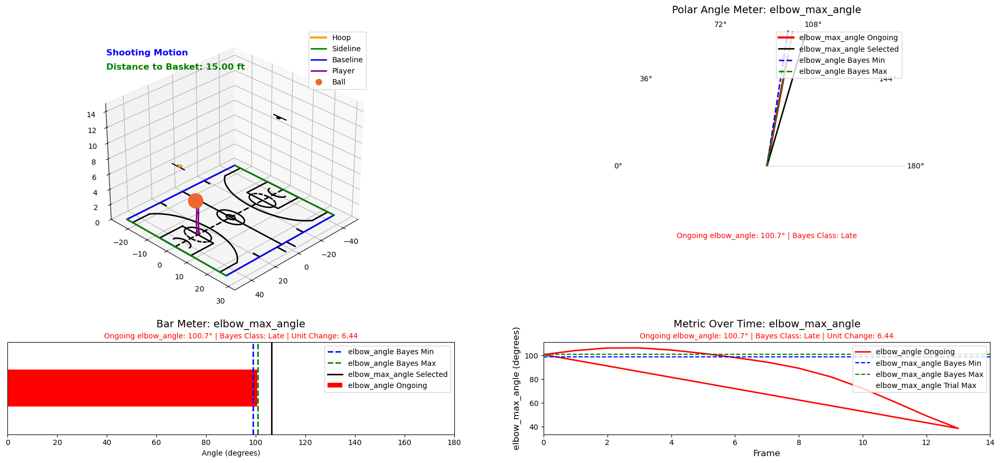

In [18]:
# Calculated, Bayesian, and SHAP feedback logic in `update_meter_with_mode`.
"""
Updated to unify calculated, bayesian, and shap feedback logic in `update_meter_with_mode`.
Introduces a polar subplot for the angle meter with angular ticks and a dynamic line graph.
"""

import logging
import pandas as pd 
import json
from IPython.display import HTML, display
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib.lines import Line2D
from matplotlib.gridspec import GridSpec
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from mplbasketball.court3d import Court3D, draw_court_3d
import matplotlib as mpl
import numpy as np
from typing import List, Tuple, Optional
from pathlib import Path

# add for if we ever want to recalculate the shap min and max values
from ml.config.config_loader import load_config
from ml.config.config_models import AppConfig
from ml.shap.shap_utils import load_dataset, setup_logging, load_configuration, initialize_logger
from ml.shap.predict_with_shap_usage import predict_and_shap

from animate.court import draw_court, get_hoop_position
from animate.viewpoints import get_viewpoint
from matplotlib.patches import Wedge

from animate.calc_bayes_shap_feature_engineering import automated_bayes_shap_summary
# Configure logging
logger = logging.getLogger('bayes_animate')
if not logger.hasHandlers():
    logger.setLevel(logging.DEBUG)  # Set to DEBUG to capture all logs
    handler = logging.StreamHandler()
    formatter = logging.Formatter('%(asctime)s - %(levelname)s - %(message)s')
    handler.setFormatter(formatter)
    logger.addHandler(handler)

# Increase the animation embed limit to 30 MB
mpl.rcParams['animation.embed_limit'] = 30.0  # Value is in MB

# Define calculated metrics list
CALCULATED_METRICS = [
    'release_knee_angle',
    'release_wrist_angle',
    'release_elbow_angle',
    'wrist_max_angle',
    'elbow_max_angle',
    'knee_max_angle'
]


def load_bayesian_metrics_dict(
    json_path: str,
    debug: bool = False
) -> dict:
    """
    Load the Bayesian metrics dictionary from a JSON file.

    Parameters:
        json_path (str): Path to the JSON file.
        debug (bool): Whether to print debug information. Default is False.

    Returns:
        dict: Bayesian metrics dictionary without 'filter_name'.
    """
    try:
        with open(json_path, 'r') as f:
            bayesian_metrics_dict = json.load(f)
        
        if debug:
            logger.debug(f"Loaded Bayesian metrics dictionary from {json_path}")
            logger.debug(json.dumps(bayesian_metrics_dict, indent=4))
        return bayesian_metrics_dict
    except FileNotFoundError:
        logger.error(f"Bayesian metrics JSON file not found at {json_path}")
        raise
    except json.JSONDecodeError:
        logger.error(f"JSON decoding failed for file {json_path}")
        raise

def generate_feedback_table_all_metrics(feedback_mode, bayesian_metrics_dict, trial_data, debug=False):
    """
    Generates a comprehensive feedback table for all metrics based on the feedback mode.
    
    Parameters:
        feedback_mode (str): The mode of feedback ('bayesian', 'shap', 'calculated').
        bayesian_metrics_dict (dict): Dictionary containing Bayesian metrics for all selected metrics.
        trial_data (pd.DataFrame): DataFrame containing the trial data.
        debug (bool): If True, outputs debugging information.
    
    Returns:
        pd.DataFrame: A DataFrame containing the feedback data for all metrics, including the actual metric value
                    ('actual_value') for comparison with the classification.
    """
    try:
        feedback_records = []

        for metric_key, metric_info in bayesian_metrics_dict.items():
            # Use the metric key as the selected metric.
            selected_metric = metric_key  # e.g., 'release_ball_direction_x'
            filter_name = metric_info.get('filter_name', selected_metric)

            record = {
                'Metric_Key': metric_key,
                'Ongoing Metric Name': filter_name
            }
            if debug:
                logger.debug(f"Processing metric: {metric_key} (Filter: {filter_name})")
            
            # Define columns based on feedback mode.
            if feedback_mode.lower() == "bayesian":
                columns = {
                    'bayes_classification': f"{selected_metric}_bayes_classification",
                    'bayes_optimized': f"{selected_metric}_bayes_optimized",
                    'bayes_max': f"{selected_metric}_bayes_max",
                    'bayes_min': f"{selected_metric}_bayes_min",
                    'bayes_unit_change': f"{selected_metric}_bayes_unit_change",
                    'shap_importance': f"shap_{selected_metric}_importance"
                }
            elif feedback_mode.lower() == "shap":
                columns = {
                    'shap_unit_change': f"shap_{selected_metric}_unit_change",
                    'shap_unit': f"shap_{selected_metric}_unit",
                    'shap_direction': f"shap_{selected_metric}_direction",
                    'shap_importance': f"shap_{selected_metric}_importance",
                    'shap_goal': f"shap_{selected_metric}_goal",
                    'shap_min': f"shap_{selected_metric}_min",
                    'shap_max': f"shap_{selected_metric}_max",
                    'shap_classification': f"shap_{selected_metric}_classification"
                }
            elif feedback_mode.lower() == "calculated":
                columns = {
                    'filtered_optimal_min': f"{selected_metric}_filtered_optimal_min",
                    'filtered_optimal_max': f"{selected_metric}_filtered_optimal_max",
                    'shot_classification': f"{selected_metric}_shot_classification"
                }
            else:
                raise ValueError("Invalid feedback mode selected.")

            # Extract values from trial_data for the defined columns.
            for key, col in columns.items():
                if col in trial_data.columns:
                    value = trial_data.at[0, col]
                    record[key] = value
                    if debug:
                        logger.debug(f"  {key}: {value}")
                else:
                    record[key] = np.nan
                    logger.warning(f"  Missing column: {col}")

            # NEW: Add the actual metric value from trial_data for comparison.
            if selected_metric in trial_data.columns:
                record['actual_value'] = trial_data.at[0, selected_metric]
                if debug:
                    logger.debug(f"  actual_value: {record['actual_value']}")
            else:
                record['actual_value'] = np.nan
                logger.warning(f"  Missing ongoing metric column: {selected_metric}")
            
            feedback_records.append(record)

        feedback_df = pd.DataFrame(feedback_records)

        if debug:
            logger.debug("Feedback table generated successfully.")
            logger.debug(feedback_df.head())

        return feedback_df

    except Exception as e:
        logger.error(f"Error in generate_feedback_table_all_metrics: {e}")
        raise




def add_bayes_optimal_lines(
    ax: plt.Axes,
    min_angle: float,
    max_angle: float,
    feedback_mode: str = None,  # new
    debug: bool = False
) -> None:
    """
    Add optimal min and max lines to the angle meter, including release min and max angles.
    """
    try:
        # Convert angles to radians
        min_angle_rad = min_angle * np.pi / 180
        max_angle_rad = max_angle * np.pi / 180

        # Check if lines already exist
        if not hasattr(ax, 'optimal_min_line'):
            ax.optimal_min_line, = ax.plot(
                [0, min_angle_rad], [0, 1], color='blue', lw=2, linestyle="--", label='Bayes Min'
            )
        if not hasattr(ax, 'optimal_max_line'):
            ax.optimal_max_line, = ax.plot(
                [0, max_angle_rad], [0, 1], color='green', lw=2, linestyle="--", label='Bayes Max'
            )

        if debug:
            logger.debug(
                f"Added optimal lines at {min_angle}°, {max_angle}° with labels 'Bayes Min' and 'Bayes Max'."
            )
    except Exception as e:
        logger.error(f"Error in add_bayes_optimal_lines: {e}")
        raise

def add_bayes_optimal_lines_to_bar(ax_bar, min_val, max_val, selected_metric: str, feedback_mode: str, debug=False):
    try:
        # Determine the labels based on the feedback mode:
        if feedback_mode.lower() == "shap":
            min_label = f"{selected_metric} SHAP Min"
            max_label = f"{selected_metric} SHAP Max"
        elif feedback_mode.lower() == "calculated":
            min_label = f"{selected_metric} Calc Min"
            max_label = f"{selected_metric} Calc Max"
        else:  # Assume bayesian or default
            min_label = f"{selected_metric} Bayes Min"
            max_label = f"{selected_metric} Bayes Max"

        if not hasattr(ax_bar, 'bar_min_line'):
            ax_bar.bar_min_line = ax_bar.axvline(x=min_val, color='blue', lw=2, linestyle='--', label=min_label)
        if not hasattr(ax_bar, 'bar_max_line'):
            ax_bar.bar_max_line = ax_bar.axvline(x=max_val, color='green', lw=2, linestyle='--', label=max_label)
        if debug:
            logger.debug(f"Added bar optimal lines at {min_val} and {max_val} with labels '{min_label}' and '{max_label}'.")
    except Exception as e:
        logger.error(f"Error in add_bayes_optimal_lines_to_bar: {e}")
        raise


def initialize_bayes_elements(
    ax: plt.Axes,
    connections: list,
    player_color: str,
    player_lw: float,
    ball_color: str,
    ball_size: float,
    debug: bool = False
) -> (dict, plt.Line2D, plt.Text, plt.Text, plt.Text):
    """
    Initialize plot elements such as lines for the player skeleton and the ball.
    """
    try:
        # Initialize lines for each body connection
        lines = {connection: ax.plot([], [], [], c=player_color, lw=player_lw)[0] for connection in connections}
        
        # Initialize the ball as a point
        ball, = ax.plot([], [], [], "o", markersize=ball_size, c=ball_color)
        
        # Text elements for annotations
        release_text = ax.text2D(0.05, 0.95, "", transform=ax.transAxes, color="red", fontsize=14, weight="bold")
        motion_text = ax.text2D(0.05, 0.90, "", transform=ax.transAxes, color="blue", fontsize=12, weight="bold")
        
        # New text element for distance (positioned below motion_text)
        distance_text = ax.text2D(0.05, 0.85, "", transform=ax.transAxes, color="green", fontsize=12, weight="bold")
        
        if debug:
            logger.debug("Elements initialized (lines, ball, text labels).")
        
        return lines, ball, release_text, motion_text, distance_text
    except Exception as e:
        logger.error(f"Error initializing elements: {e}")
        raise

def update_bayes_frame(
    ax: plt.Axes,
    frame: int,
    df: pd.DataFrame,
    release_frame: int,
    lines: dict,
    ball: plt.Line2D,
    release_text: plt.Text,
    motion_text: plt.Text,
    connections: list,
    ball_color: str,
    highlight_color: str,
    debug: bool = False,
    selected_metric: str = None,               # NEW optional parameter
    selected_metric_filter_name: str = None      # NEW optional parameter
):
    """
    Update the player's skeleton, ball position, and annotations for each frame.
    Now also adds a highlight over the selected joint or ball depending on the metric.
    
    If selected_metric is provided and contains "ball" (case-insensitive),
    the ball marker is highlighted. Otherwise, if selected_metric_filter_name is provided
    and corresponds to a joint name (with columns <joint>_x, <joint>_y, <joint>_z),
    a vertical highlight line is drawn at that joint.
    """
    try:
        # Update skeleton lines from joint positions.
        for connection in connections:
            joint_start, joint_end = connection
            x_start = df.at[frame, f"{joint_start}_x"]
            y_start = df.at[frame, f"{joint_start}_y"]
            z_start = df.at[frame, f"{joint_start}_z"]
            x_end = df.at[frame, f"{joint_end}_x"]
            y_end = df.at[frame, f"{joint_end}_y"]
            z_end = df.at[frame, f"{joint_end}_z"]
            lines[connection].set_data([x_start, x_end], [y_start, y_end])
            lines[connection].set_3d_properties([z_start, z_end])
        
        # Update ball position.
        ball_x = df.at[frame, "ball_x"]
        ball_y = df.at[frame, "ball_y"]
        ball_z = df.at[frame, "ball_z"]
        ball.set_data([ball_x], [ball_y])
        ball.set_3d_properties([ball_z])
        
        # Update text annotations.
        if frame == release_frame:
            release_text.set_text("Release Point")
            release_text.set_color(highlight_color)
        else:
            release_text.set_text("")
        
        if df.at[frame, "shooting_motion"] == 1:
            motion_text.set_text("Shooting Motion")
        else:
            motion_text.set_text("")
        
        # ----- NEW HIGHLIGHT LOGIC -----
        if selected_metric:
            if "ball" in selected_metric.lower():
                # If the metric is ball-related, highlight the ball marker.
                ball.set_markeredgecolor(highlight_color)
                ball.set_markeredgewidth(3)
                if debug:
                    logger.debug(f"Ball highlighted with color {highlight_color}.")
            else:
                # Otherwise, assume the selected_metric_filter_name is a joint name.
                joint_x_col = f"{selected_metric_filter_name}_x"
                if joint_x_col in df.columns:
                    x_joint = df.at[frame, f"{selected_metric_filter_name}_x"]
                    y_joint = df.at[frame, f"{selected_metric_filter_name}_y"]
                    z_joint = df.at[frame, f"{selected_metric_filter_name}_z"]
                    # Define delta: the vertical offset (halfway “up each way”).
                    delta = 0.5
                    if not hasattr(ax, 'joint_highlight_line'):
                        # Create the highlight line on first call.
                        ax.joint_highlight_line, = ax.plot(
                            [x_joint, x_joint],
                            [y_joint, y_joint],
                            [z_joint - delta, z_joint + delta],
                            color=highlight_color, lw=3,
                            label=f"{selected_metric_filter_name} Highlight"
                        )
                        if debug:
                            logger.debug(f"Created joint highlight for {selected_metric_filter_name} at frame {frame}.")
                    else:
                        # Update the existing highlight line.
                        ax.joint_highlight_line.set_data([x_joint, x_joint], [y_joint, y_joint])
                        ax.joint_highlight_line.set_3d_properties([z_joint - delta, z_joint + delta])
                        if debug:
                            logger.debug(f"Updated joint highlight for {selected_metric_filter_name} at frame {frame}.")
                else:
                    if debug:
                        logger.debug(f"Joint '{selected_metric_filter_name}' not found in DataFrame columns.")
        
        if debug:
            logger.debug(f"Updated frame {frame}: Player and ball positions updated (with joint highlight if applicable).")
    except Exception as e:
        logger.error(f"Error updating frame {frame}: {e}")
        raise



def update_meter_with_mode(
    ax_meter,
    df,
    frame,
    needle,
    one_liner,  # single text element for combined information
    angle_key: str,
    feedback_key: str,
    feedback_mode: str = "calculated",
    bayesian_metrics_dict: dict = None,
    debug: bool = False,
    conditional_max: bool = False
):
    """
    Update the polar angle meter based on the chosen feedback mode.
    This version updates a single dynamic text element (one_liner) that shows:
      "Ongoing {selected_metric_filter_name}: {angle:.1f}°"
    and, for SHAP feedback, appends the SHAP classification, unit change, unit, direction, and importance.
    
    Additionally, for calculated feedback mode, the shot classification is appended to the text.
    
    Parameters:
      - ax_meter: The polar axes.
      - df: DataFrame with the current frame data.
      - frame: The current frame index.
      - needle: The dynamic needle line.
      - one_liner: The single text element to display combined information.
      - angle_key: The column name for the ongoing angle (usually the filter name).
      - feedback_key: The key for looking up the metric in the dictionary.
      - feedback_mode: One of "calculated", "bayesian", or "shap".
      - bayesian_metrics_dict: The dictionary with metric info.
      - debug: If True, print debug information.
      - conditional_max: If True, apply conditional logic for max lines.
    """
    try:
        # Update the needle and compute the current angle in radians
        current_angle_degs = df.loc[frame, angle_key]
        rad = current_angle_degs * np.pi / 180.0
        needle.set_data([rad, rad], [0, 0.8])
        
        # Update gauge fill if it exists
        if hasattr(ax_meter, 'gauge_fill'):
            ax_meter.gauge_fill.theta2 = current_angle_degs
            if debug:
                print(f"Gauge fill updated: theta2={current_angle_degs}°.")
        
        # Start building the info string for the one-liner text element
        info = f"Ongoing {angle_key}: {current_angle_degs:.1f}°"
        
        if feedback_mode.lower() == "calculated":
            # --- NEW CODE: Compute optimal range based on percentiles for calculated feedback ---
            if selected_metric := feedback_key:  # use the selected metric name (or feedback_key)
                if selected_metric in df.columns:
                    # Fallback to the existing fixed columns if available
                    calc_min_col = f"{feedback_key}_filtered_optimal_min"
                    calc_max_col = f"{feedback_key}_filtered_optimal_max"
                    calc_min = df.loc[frame, calc_min_col] if calc_min_col in df.columns else np.nan
                    calc_max = df.loc[frame, calc_max_col] if calc_max_col in df.columns else np.nan
                    if debug:
                        print(f"Using fallback columns: {calc_min_col} and {calc_max_col}.")
            else:
                raise ValueError("Selected metric not found in DataFrame.")
            
            # Draw or update the calculated optimal lines
            if not hasattr(ax_meter, 'calc_min_line'):
                calc_min_rad = calc_min * np.pi / 180.0
                ax_meter.calc_min_line, = ax_meter.plot([0, calc_min_rad], [0, 1],
                                                        color='blue', lw=2, linestyle='--',
                                                        label=f"{angle_key} Calc Min")
                if debug:
                    print(f"Created Calculated Min line at {calc_min:.1f}°.")
            else:
                calc_min_rad = calc_min * np.pi / 180.0
                ax_meter.calc_min_line.set_data([0, calc_min_rad], [0, 1])
                if debug:
                    print(f"Updated Calculated Min line to {calc_min:.1f}°.")
            if not hasattr(ax_meter, 'calc_max_line'):
                calc_max_rad = calc_max * np.pi / 180.0
                if (not conditional_max) or (current_angle_degs >= calc_max):
                    ax_meter.calc_max_line, = ax_meter.plot([0, calc_max_rad], [0, 1],
                                                            color='green', lw=2, linestyle='--',
                                                            label=f"{angle_key} Calc Max")
                    if debug:
                        print(f"Created Calculated Max line at {calc_max:.1f}°.")
            else:
                calc_max_rad = calc_max * np.pi / 180.0
                if (not conditional_max) or (current_angle_degs >= calc_max):
                    ax_meter.calc_max_line.set_data([0, calc_max_rad], [0, 1])
                    if debug:
                        print(f"Updated Calculated Max line to {calc_max:.1f}°.")
            
            # NEW: Append shot classification to the info string if available
            shot_class_col = f"{feedback_key}_shot_classification"
            if shot_class_col in df.columns:
                shot_classification = df.loc[frame, shot_class_col]
                info += f" | Shot Class: {shot_classification}"
            else:
                info += " | Shot Class: N/A"
        
        elif feedback_mode.lower() == "bayesian":
            bayes_min_col = f"{feedback_key}_bayes_min"
            bayes_max_col = f"{feedback_key}_bayes_max"
            bayes_class_col = f"{feedback_key}_bayes_classification"
            if bayes_min_col in df.columns:
                bayes_min = df.loc[frame, bayes_min_col]
            else:
                bayes_min = bayesian_metrics_dict.get(feedback_key.lower(), {}).get("bayes_min", 0)
            if bayes_max_col in df.columns:
                bayes_max = df.loc[frame, bayes_max_col]
            else:
                bayes_max = bayesian_metrics_dict.get(feedback_key.lower(), {}).get("bayes_max", 180)
            if not hasattr(ax_meter, 'bayes_min_line'):
                ax_meter.bayes_min_line, = ax_meter.plot(
                    [0, bayes_min * np.pi / 180.0], [0, 1],
                    color='blue', lw=2, linestyle='--', label=f"{angle_key} Bayes Min"
                )
                if debug:
                    print(f"Created Bayes Min line at {bayes_min:.1f}°.")
            else:
                ax_meter.bayes_min_line.set_data([0, bayes_min * np.pi / 180.0], [0, 1])
                if debug:
                    print(f"Updated Bayes Min line to {bayes_min:.1f}°.")
            if (not conditional_max) or (current_angle_degs >= bayes_max):
                if not hasattr(ax_meter, 'bayes_max_line'):
                    ax_meter.bayes_max_line, = ax_meter.plot(
                        [0, bayes_max * np.pi / 180.0], [0, 1],
                        color='green', lw=2, linestyle='--', label=f"{angle_key} Bayes Max"
                    )
                    if debug:
                        print(f"Created Bayes Max line at {bayes_max:.1f}°.")
                else:
                    ax_meter.bayes_max_line.set_data([0, bayes_max * np.pi / 180.0], [0, 1])
                    if debug:
                        print(f"Updated Bayes Max line to {bayes_max:.1f}°.")
            if bayes_class_col in df.columns:
                bayes_classification = df.loc[frame, bayes_class_col]
            else:
                bayes_classification = bayesian_metrics_dict.get(feedback_key.lower(), {}).get("bayes_classification", "N/A")
            info += f" | Bayes Class: {bayes_classification}"
        
        elif feedback_mode.lower() == "shap":
            # Existing SHAP logic remains unchanged
            selected_metric = feedback_key  # for consistency
            shap_class_col = f"shap_{selected_metric}_classification"
            shap_unit_change_col = f"shap_{selected_metric}_unit_change"
            shap_unit_col = f"shap_{selected_metric}_unit"
            shap_direction_col = f"shap_{selected_metric}_direction"
            shap_imp_col = f"shap_{selected_metric}_importance"
            if shap_class_col in df.columns:
                shap_class = df.loc[frame, shap_class_col]
            else:
                shap_class = "N/A"
            if shap_unit_change_col in df.columns:
                shap_unit_change = df.loc[frame, shap_unit_change_col]
            else:
                shap_unit_change = "N/A"
            if shap_unit_col in df.columns:
                shap_unit = df.loc[frame, shap_unit_col]
            else:
                shap_unit = ""
            if shap_direction_col in df.columns:
                shap_direction = df.loc[frame, shap_direction_col]
            else:
                shap_direction = "N/A"
            if shap_imp_col in df.columns:
                shap_imp = df.loc[frame, shap_imp_col]
                try:
                    shap_importance = f"{float(shap_imp):.3f}"
                except (ValueError, TypeError):
                    shap_importance = shap_imp
            else:
                shap_importance = "N/A"
            # NEW code for SHAP min/max lines:
            shap_min_col = f"shap_{selected_metric}_min"
            shap_max_col = f"shap_{selected_metric}_max"
            if shap_min_col in df.columns:
                shap_min = df.loc[frame, shap_min_col]
            else:
                shap_min = 0
            if shap_max_col in df.columns:
                shap_max = df.loc[frame, shap_max_col]
            else:
                shap_max = 180
            shap_min_rad = shap_min * np.pi / 180.0
            shap_max_rad = shap_max * np.pi / 180.0
            if not hasattr(ax_meter, 'shap_min_line'):
                ax_meter.shap_min_line, = ax_meter.plot(
                    [0, shap_min_rad], [0, 1],
                    color='blue', lw=2, linestyle='--', label=f"{angle_key} SHAP Min"
                )
            else:
                ax_meter.shap_min_line.set_data([0, shap_min_rad], [0, 1])
            if (not conditional_max) or (current_angle_degs >= shap_max):
                if not hasattr(ax_meter, 'shap_max_line'):
                    ax_meter.shap_max_line, = ax_meter.plot(
                        [0, shap_max_rad], [0, 1],
                        color='green', lw=2, linestyle='--', label=f"{angle_key} SHAP Max"
                    )
                else:
                    ax_meter.shap_max_line.set_data([0, shap_max_rad], [0, 1])
            one_liner_str = (f"Ongoing {angle_key}: {df.loc[frame, angle_key]:.1f}° | "
                             f"SHAP Class: {shap_class} | Unit Change: {shap_unit_change} {shap_unit} | "
                             f"Direction: {shap_direction} | SHAP Imp: {shap_importance}")
        
        else:
            logger.warning(f"Unknown feedback mode: {feedback_mode}")
            info += " | Class: N/A | SHAP: N/A | Direction: N/A"
            if debug:
                print("Set default one-liner info to N/A for unknown feedback mode.")
        
        # For bayesian and non-SHAP modes, use the info string; for SHAP, use the one_liner_str built above
        one_liner.set_text(info if feedback_mode.lower() != "shap" else one_liner_str)
        
        if debug:
            print(f"Frame={frame}, feedback_mode='{feedback_mode}' => {one_liner.get_text()}")
    
    except Exception as e:
        logger.error(f"Error in update_meter_with_mode: {e}")
        raise








def initialize_bar_meter(ax_bar, min_val, max_val):
    """
    Initializes a horizontal bar to represent the angle from min_val to max_val.
    Returns the bar container so you can update it each frame.
    """
    ax_bar.set_xlim([min_val, max_val])
    ax_bar.set_ylim([-0.5, 0.5])  # Just enough space for a single bar
    ax_bar.set_xlabel("Angle (degrees)")
    ax_bar.set_yticks([])

    # Draw a single bar initially at zero
    bar_container = ax_bar.barh(
        y=0, width=0, height=0.4, color='red', align='center'
    )

    return bar_container

def update_bar_meter(bar_container, current_angle, min_val=0, max_val=180):
    """
    Updates the bar's width so that it visually represents the `current_angle`.
    """
    # bar_container is usually a list with a single bar (bar_container[0])
    bar = bar_container[0]
    
    # Constrain/clip angle if needed (optional).
    clipped_angle = max(min_val, min(current_angle, max_val))
    
    # Update the bar width
    bar.set_width(clipped_angle)



def initialize_line_graph(
    ax_line,
    static_min: float,
    static_max: float,
    selected_metric_filter_name: str,
    selected_metric: str,
    feedback_mode: str,
    debug=False
):
    """
    Initialize the line graph subplot with dynamic metric tracking.
    Updated to include the selected metric in the title and appropriate legend labels.
    
    static_min and static_max are the values to be used for the min and max lines.
    The dynamic (ongoing) metric line is drawn in red.
    
    CHANGES:
      - The title now includes the metric name.
      - The red ongoing line is labeled as "{selected_metric} Ongoing".
    """
    try:
        # CHANGED: Update title to include the metric name (or filter name)
        ax_line.set_title(f"Metric Over Time: {selected_metric}", fontsize=14, pad=20)
        ax_line.set_xlabel("Frame", fontsize=12)
        ax_line.set_ylabel(f"{selected_metric} (degrees)", fontsize=12)

        # Dynamic (ongoing) metric line in red, labeled appropriately
        line_metric, = ax_line.plot([], [], lw=2, color='red',
                                    label=f"{selected_metric_filter_name} Ongoing")

        # Determine labels based on feedback mode
        if feedback_mode.lower() == "shap":
            min_label = f"{selected_metric} SHAP Min"
            max_label = f"{selected_metric} SHAP Max"
        elif feedback_mode.lower() == "calculated":
            min_label = f"{selected_metric} Calc Min"
            max_label = f"{selected_metric} Calc Max"
        else:  # bayesian or default
            min_label = f"{selected_metric} Bayes Min"
            max_label = f"{selected_metric} Bayes Max"

        # Static min and max lines
        line_min = ax_line.axhline(y=static_min, color='blue', linestyle='--', label=min_label)
        line_max = ax_line.axhline(y=static_max, color='green', linestyle='--', label=max_label)

        # Optional trial max line (initially invisible)
        line_trial_max, = ax_line.plot([], [], lw=2, color='red', linestyle='--',
                                       label=f"{selected_metric} Trial Max")
        line_trial_max.set_visible(False)

        data_frames = []
        data_values = []

        # Set initial y-limits with padding
        initial_lower = static_min - 5
        initial_upper = static_max + 5
        ax_line.set_ylim(initial_lower, initial_upper)

        # Create a temporary legend (may be rebuilt later)
        ax_line.legend(loc='upper right')

        if debug:
            logger.debug("Line graph initialized with dynamic metric tracking.")

        return {
            'line_metric': line_metric,
            'line_min': line_min,
            'line_max': line_max,
            'line_trial_max': line_trial_max,
            'data_frames': data_frames,
            'data_values': data_values,
            'current_ymin': initial_lower,
            'current_ymax': initial_upper,
            'current_trial_max': static_max,
            'trial_max_reached': False
        }
    except Exception as e:
        logger.error(f"Error initializing line graph: {e}")
        raise



def animate_trial_with_calc_bayes_shap_angle_meter(
    df: pd.DataFrame,
    release_frame: int,
    selected_metric: str,
    bayesian_metrics_dict: dict,
    feedback_mode: str = "bayesian",
    viewpoint_name: str = "side_view_right",
    connections: list = None,
    zlim: float = 15.0,
    player_color: str = "purple",
    player_lw: float = 2.0,
    ball_color: str = "#ee6730",
    ball_size: float = 20.0,
    highlight_color: str = "red",
    show_court: bool = True,
    court_type: str = "nba",
    units: str = "ft",
    notebook_mode: bool = True,
    debug: bool = False,
    frames_to_animate: list = None,
    show_selected_metric: bool = False,
    # New arguments for toggling each plot:
    polar_plot: bool = True,
    bar_plot: bool = True,
    line_plot: bool = True
) -> HTML:
    """
    Animate a basketball trial with integrated angle and line meters.
    Each subplot builds its own legend based on the feedback mode and persistent line objects.
    
    NEW FEATURES:
      - The polar meter now includes a solid black line for "{selected_metric} Selected" in its legend.
      - The bar meter now includes a solid black line for "{selected_metric} Selected" in its legend.
      - In the polar plot, the dynamic "Ongoing: {angle}" text is removed (since the title already shows the angle)
        and instead a new text element is placed in the bottom 25% of the chart (centered) showing combined
        polar information (e.g. classification and SHAP details).
    
    All existing functionality remains intact.
    """
    try:
        if connections is None:
            logger.error("No connections provided for player skeleton.")
            raise ValueError("Connections list cannot be None.")

        if debug:
            logger.debug("Starting animation setup.")
            logger.debug(f"Total frames in DataFrame: {len(df)}")
            logger.debug(f"Release frame index provided: {release_frame}")
            logger.debug(f"Selected viewpoint: {viewpoint_name}")
            logger.debug(f"Selected metric for angle meter: {selected_metric}")

        # Retrieve viewpoint
        try:
            viewpoint = get_viewpoint(viewpoint_name)
            elev = viewpoint['elev']
            azim = viewpoint['azim']
            if debug:
                logger.debug(f"Retrieved viewpoint '{viewpoint_name}': elev={elev}, azim={azim}")
        except KeyError:
            logger.error(f"Invalid viewpoint_name: {viewpoint_name}. Using default.")
            viewpoint = get_viewpoint("side_view_right")
            elev = viewpoint['elev']
            azim = viewpoint['azim']
            if debug:
                logger.debug(f"Using default viewpoint: elev={elev}, azim={azim}")

        # Set up figure and subplots
        fig = plt.figure(figsize=(24, 10))
        gs = GridSpec(2, 2, figure=fig, height_ratios=[3, 1])
        
        # 3D subplot (always created)
        ax_3d = fig.add_subplot(gs[0, 0], projection='3d')
        ax_3d.view_init(elev=elev, azim=azim)
        ax_3d.set_zlim(0, zlim)

        # Create the polar meter if requested
        if polar_plot:
            ax_meter = fig.add_subplot(gs[0, 1], polar=True)
        else:
            ax_meter = None

        # Create the bar meter if requested
        if bar_plot:
            ax_bar = fig.add_subplot(gs[1, 0])
        else:
            ax_bar = None

        # Create the line graph if requested
        if line_plot:
            ax_line = fig.add_subplot(gs[1, 1])
        else:
            ax_line = None

        # --- Draw court and hoop on the 3D plot ---
        if show_court:
            draw_court(ax_3d, court_type=court_type, units=units, debug=debug)
            hoop_x, hoop_y, hoop_z = get_hoop_position(court_type=court_type, units=units, debug=debug)
        else:
            hoop_x = hoop_y = hoop_z = None

        # Initialize dynamic 3D plot elements
        lines, ball, release_text, motion_text, distance_text = initialize_bayes_elements(
            ax=ax_3d, connections=connections, player_color=player_color,
            player_lw=player_lw, ball_color=ball_color, ball_size=ball_size, debug=debug)

        # Retrieve the filter name for the selected metric
        metric_info = bayesian_metrics_dict.get(selected_metric.lower())
        if not metric_info:
            logger.error(f"Selected metric '{selected_metric}' not found in bayesian_metrics_dict.")
            raise ValueError(f"Selected metric '{selected_metric}' not found in bayesian_metrics_dict.")
        selected_metric_filter_name = metric_info.get('filter_name', selected_metric)
        if debug:
            logger.debug(f"Selected metric filter name: {selected_metric_filter_name}")

        # Compute static min/max values based on the feedback mode
        if feedback_mode.lower() == "shap":
            shap_min_col = f"shap_{selected_metric}_min"
            shap_max_col = f"shap_{selected_metric}_max"
            static_min = df.loc[0, shap_min_col] if shap_min_col in df.columns else 0
            static_max = df.loc[0, shap_max_col] if shap_max_col in df.columns else 180
        elif feedback_mode.lower() == "calculated":
            # --- UPDATED: Use filtered optimal columns for calculated feedback mode ---
            calc_min_col = f"{selected_metric}_filtered_optimal_min"
            calc_max_col = f"{selected_metric}_filtered_optimal_max"
            static_min = df.loc[0, calc_min_col] if calc_min_col in df.columns else 0
            static_max = df.loc[0, calc_max_col] if calc_max_col in df.columns else 180
        else:
            static_min = metric_info.get("bayes_min", 0)
            static_max = metric_info.get("bayes_max", 180)

        # ----- Initialize the Polar Meter -----
        if polar_plot:
            if not hasattr(ax_meter, 'gauge_fill'):
                ax_meter.gauge_fill = Wedge(center=(0, 0), r=1.0, theta1=0, theta2=0,
                                            facecolor='red', alpha=0.3, transform=ax_meter.transData)
                ax_meter.add_patch(ax_meter.gauge_fill)
            needle, = ax_meter.plot([0, 0], [0, 0.8], lw=3, color='red',
                                    label=f"{selected_metric.lower()} Ongoing")
            ax_meter.gauge_fill.set_zorder(1)
            needle.set_zorder(2)
            
            ax_meter.set_title(f"Polar Angle Meter: {selected_metric}", fontsize=14, pad=20)
            
            # NEW: Create a single one-liner text element at the bottom 25% of the chart.
            one_liner = ax_meter.text(0.5, 0.25, "", transform=ax_meter.transAxes,
                                    ha='center', va='center', fontsize=10, color='red', zorder=12)
            
            ax_meter.set_theta_offset(np.pi)
            ax_meter.set_theta_direction(-1)
            angle_ticks = np.linspace(0, np.pi, 6)
            angle_labels = [f'{int(deg)}°' for deg in np.linspace(0, 180, 6)]
            ax_meter.set_xticks(angle_ticks)
            ax_meter.set_xticklabels(angle_labels)
            ax_meter.set_yticklabels([])
            ax_meter.grid(False)
            ax_meter.set_ylim(0, 1)
            ax_meter.fill_between(np.linspace(np.pi, 2*np.pi, 100), 0, 1, color="white", zorder=10)
            ax_meter.spines['polar'].set_visible(False)
            ax_meter.plot([0, np.pi], [0, 1], color='black', lw=1)
            
            # NEW: Create the selected metric line (solid black) in the polar plot if not present
            selected_value = df[selected_metric].iloc[0]
            selected_value_rad = selected_value * np.pi / 180.0
            if not hasattr(ax_meter, 'selected_metric_line'):
                ax_meter.selected_metric_line, = ax_meter.plot(
                    [0, selected_value_rad], [0, 1],
                    color='black', lw=2, linestyle='-', label=f"{selected_metric} Selected"
                )
            # Build the polar legend so it includes the selected line
            ax_meter.legend(loc='upper right')
            
            # Instead of multiple text elements, we now store only one_liner.
            angle_meter_obj = {
                'ax_meter': ax_meter,
                'needle': needle,
                'one_liner': one_liner  # <-- our combined dynamic text element
            }
        else:
            angle_meter_obj = None

        # ----- Initialize the Bar Meter -----
        if bar_plot:
            ax_bar.set_title(f"Bar Meter: {selected_metric}", fontsize=14, pad=20)
            # NEW: Add a dynamic text element below the title for the bar meter
            bar_ongoing_text = ax_bar.text(0.5, 1.02, "", transform=ax_bar.transAxes,
                                           ha='center', va='bottom', fontsize=10, color='red')
            bar_container = initialize_bar_meter(ax_bar, min_val=0, max_val=180)
            add_bayes_optimal_lines_to_bar(ax_bar, static_min, static_max, selected_metric_filter_name, feedback_mode, debug)
            # NEW: Label the red bar as "Ongoing" and also create a vertical black line for the selected value
            bar_container[0].set_label(f"{selected_metric_filter_name} Ongoing")
            if not hasattr(ax_bar, 'selected_metric_line'):
                selected_value = df[selected_metric].iloc[0]
                ax_bar.selected_metric_line = ax_bar.axvline(
                    x=selected_value, color='black', lw=2, linestyle='-', label=f"{selected_metric} Selected"
                )
            # Rebuild the bar meter legend to include all handles
            bar_handles = []
            if hasattr(ax_bar, 'bar_min_line'):
                bar_handles.append(ax_bar.bar_min_line)
            if hasattr(ax_bar, 'bar_max_line'):
                bar_handles.append(ax_bar.bar_max_line)
            if hasattr(ax_bar, 'selected_metric_line'):
                bar_handles.append(ax_bar.selected_metric_line)
            if hasattr(ax_bar, 'trial_release_line'):
                bar_handles.append(ax_bar.trial_release_line)
            bar_handles.append(bar_container[0])
            ax_bar.legend(handles=bar_handles, loc='upper right')
        else:
            bar_container = None

        # ----- Initialize the Line Graph -----
        if line_plot:
            line_graph_obj = initialize_line_graph(ax_line, static_min, static_max, selected_metric_filter_name, selected_metric, feedback_mode, debug)
            # NEW: Add a dynamic text element below the title for the line graph
            line_ongoing_text = ax_line.text(0.5, 1.02, "", transform=ax_line.transAxes,
                                            ha='center', va='bottom', fontsize=10, color='red')
            # Optionally add a selected metric line to the line graph (already handled in initialize_line_graph if needed)
            if show_selected_metric:
                selected_value = df[selected_metric].iloc[0]
                line_graph_obj['selected_metric_line'] = ax_line.axhline(
                    y=selected_value, color='black', linestyle='-', lw=2, label=f"{selected_metric_filter_name} Selected"
                )
                # Rebuild the legend to include the selected line:
                line_handles = [
                    line_graph_obj['line_min'],
                    line_graph_obj['line_max'],
                    line_graph_obj['line_metric'],
                    line_graph_obj['selected_metric_line']
                ]
                ax_line.legend(handles=line_handles, loc='upper right')
        else:
            line_graph_obj = None
            line_ongoing_text = None

        # ----- Create legend for 3D plot (unchanged) -----
        hoop_handle = Line2D([0], [0], color='orange', lw=3, label='Hoop')
        baseline_handle = Line2D([0], [0], color='blue', lw=2, label='Baseline')
        sideline_handle = Line2D([0], [0], color='green', lw=2, label='Sideline')
        player_handle = Line2D([0], [0], color=player_color, lw=player_lw, label='Player')
        ball_handle = Line2D([0], [0], marker='o', color='w', label='Ball', markerfacecolor=ball_color, markersize=10)
        ax_3d.legend(handles=[hoop_handle, sideline_handle, baseline_handle, player_handle, ball_handle], loc='upper right')

        if debug:
            logger.debug(f"Initialized angle meter for metric '{selected_metric_filter_name}' (if enabled).")

        # Adjust line graph y-limits if line graph exists
        if line_plot:
            ax_line.set_ylim(bottom=min(static_min, df[selected_metric_filter_name].min() - 5),
                             top=max(static_max, df[selected_metric_filter_name].max() + 5))
            if debug:
                logger.debug("Adjusted y-limits for line graph.")

        # Create trial release lines if a release point exists (colored purple)
        if df.loc[release_frame, 'release_point_filter'] == 1:
            trial_release = df.loc[release_frame, selected_metric_filter_name]
            if debug:
                logger.debug(f"Trial release for metric '{selected_metric_filter_name}': {trial_release}")
        else:
            trial_release = None

        # ----- Define the update function for the animation -----
        def update_func(frame: int):
            # Update the 3D plot elements (always)
            update_bayes_frame(
                ax=ax_3d, 
                frame=frame, 
                df=df, 
                release_frame=release_frame,
                lines=lines, 
                ball=ball, 
                release_text=release_text,
                motion_text=motion_text, 
                connections=connections,
                ball_color=ball_color, 
                highlight_color=highlight_color, 
                debug=debug,
                selected_metric=selected_metric,                   # NEW: Pass the selected metric
                selected_metric_filter_name=selected_metric_filter_name  # NEW: Pass its filter name
            )
    
    # ... (rest of update_func remains unchanged)

            
            # Update the polar meter if enabled
            if polar_plot and angle_meter_obj:
                update_meter_with_mode(
                    ax_meter=angle_meter_obj['ax_meter'], df=df, frame=frame,
                    needle=angle_meter_obj['needle'], one_liner=angle_meter_obj['one_liner'],
                    angle_key=selected_metric_filter_name, feedback_key=selected_metric,
                    feedback_mode=feedback_mode, bayesian_metrics_dict=bayesian_metrics_dict, debug=debug
                )

                if frame == 0:
                    angle_meter_obj['ax_meter'].legend(loc='upper right')
            
            # Build the dynamic one-liner text based on the feedback mode.
            if feedback_mode.lower() == "bayesian":
                bayes_class_col = f"{selected_metric}_bayes_classification"
                if bayes_class_col in df.columns:
                    bayes_class = df.loc[frame, bayes_class_col]
                else:
                    bayes_class = "N/A"
                bayes_unit_change_col = f"{selected_metric}_bayes_unit_change"
                if bayes_unit_change_col in df.columns:
                    bayes_unit_change = df.loc[frame, bayes_unit_change_col]
                else:
                    bayes_unit_change = "N/A"
                one_liner_str = (f"Ongoing {selected_metric_filter_name}: {df.loc[frame, selected_metric_filter_name]:.1f}° | "
                                f"Bayes Class: {bayes_class} | Unit Change: {bayes_unit_change}")
            elif feedback_mode.lower() == "shap":
                # Define SHAP columns.
                shap_class_col = f"shap_{selected_metric}_classification"
                shap_unit_change_col = f"shap_{selected_metric}_unit_change"
                shap_unit_col = f"shap_{selected_metric}_unit"
                shap_direction_col = f"shap_{selected_metric}_direction"
                shap_importance_col = f"shap_{selected_metric}_importance"
                # Retrieve each value or use a default.
                if shap_class_col in df.columns:
                    shap_class = df.loc[frame, shap_class_col]
                else:
                    shap_class = "N/A"
                if shap_unit_change_col in df.columns:
                    shap_unit_change = df.loc[frame, shap_unit_change_col]
                else:
                    shap_unit_change = "N/A"
                if shap_unit_col in df.columns:
                    shap_unit = df.loc[frame, shap_unit_col]
                else:
                    shap_unit = ""
                if shap_direction_col in df.columns:
                    shap_direction = df.loc[frame, shap_direction_col]
                else:
                    shap_direction = "N/A"
                if shap_importance_col in df.columns:
                    shap_imp = df.loc[frame, shap_importance_col]
                    try:
                        shap_importance = f"{float(shap_imp):.3f}"
                    except (ValueError, TypeError):
                        shap_importance = shap_imp
                else:
                    shap_importance = "N/A"
                # Build the one-liner string for SHAP feedback.
                one_liner_str = (f"Ongoing {selected_metric_filter_name}: {df.loc[frame, selected_metric_filter_name]:.1f}° | "
                                f"SHAP Class: {shap_class} | Unit Change: {shap_unit_change} {shap_unit} | "
                                f"Direction: {shap_direction} | SHAP Imp: {shap_importance}")
            elif feedback_mode.lower() == "calculated":
                # NEW: Append shot classification to the one-liner text for calculated feedback mode.
                shot_class_col = f"{selected_metric}_shot_classification"
                if shot_class_col in df.columns:
                    shot_classification = df.loc[frame, shot_class_col]
                else:
                    shot_classification = "N/A"
                one_liner_str = (f"Ongoing {selected_metric_filter_name}: {df.loc[frame, selected_metric_filter_name]:.1f}° | "
                                 f"Shot Class: {shot_classification}")
            else:
                one_liner_str = (f"Ongoing {selected_metric_filter_name}: {df.loc[frame, selected_metric_filter_name]:.1f}°")

            
            # Update the bar meter one-liner text.
            if bar_plot and bar_container is not None:
                current_angle = df.loc[frame, selected_metric_filter_name]
                update_bar_meter(bar_container=bar_container, current_angle=current_angle, min_val=0, max_val=180)
                bar_ongoing_text.set_text(one_liner_str)
                if 'distance_to_basket' in df.columns:
                    distance = df.at[frame, 'distance_to_basket']
                    distance_text.set_text(f"Distance to Basket: {distance:.2f} ft" if not pd.isna(distance) else "")
                else:
                    distance_text.set_text("")
            
            # Update the line graph one-liner text.
            if line_plot and line_graph_obj is not None:
                frame_number = frame
                metric_value = df.loc[frame, selected_metric_filter_name]
                line_graph_obj['data_frames'].append(frame_number)
                line_graph_obj['data_values'].append(metric_value)
                line_graph_obj['line_metric'].set_data(line_graph_obj['data_frames'], line_graph_obj['data_values'])
                ax_line.set_xlim(left=0, right=max(line_graph_obj['data_frames']) + 1)
                current_min = min(line_graph_obj['data_values']) - 5
                current_max = max(line_graph_obj['data_values']) + 5
                if current_min < line_graph_obj['current_ymin'] or current_max > line_graph_obj['current_ymax']:
                    new_ymin = min(line_graph_obj['current_ymin'], current_min)
                    new_ymax = max(line_graph_obj['current_ymax'], current_max)
                    ax_line.set_ylim(new_ymin, new_ymax)
                    line_graph_obj['current_ymin'] = new_ymin
                    line_graph_obj['current_ymax'] = new_ymax
                if "max_" in selected_metric:
                    if metric_value > line_graph_obj['current_trial_max']:
                        line_graph_obj['current_trial_max'] = metric_value
                        if not hasattr(line_graph_obj['line_trial_max'], 'xdata'):
                            line_graph_obj['line_trial_max'].set_data([frame_number], [metric_value])
                        else:
                            current_x = line_graph_obj['line_trial_max'].get_xdata()
                            current_y = line_graph_obj['line_trial_max'].get_ydata()
                            new_x = np.append(current_x, frame_number)
                            new_y = np.append(current_y, metric_value)
                            line_graph_obj['line_trial_max'].set_data(new_x, new_y)
                        line_graph_obj['line_trial_max'].set_visible(True)
                else:
                    line_graph_obj['line_trial_max'].set_visible(False)
                if trial_release is not None and frame >= release_frame:
                    if "release_" in selected_metric and line_graph_obj and 'trial_release_line' in line_graph_obj:
                        line_graph_obj['trial_release_line'].set_visible(True)
                line_ongoing_text.set_text(one_liner_str)
            
            fig.canvas.draw_idle()

        if frames_to_animate:
            frames = frames_to_animate
        else:
            frames = range(len(df))

        anim = FuncAnimation(fig, update_func, frames=frames, interval=1000/30, blit=False)
        if notebook_mode:
            return HTML(anim.to_jshtml())
        else:
            return anim

    except json.JSONDecodeError:
        logger.error("Error decoding JSON.")
        raise
    except Exception as e:
        logger.error(f"An unexpected error occurred: {e}")
        raise








    
def display_combined_output(feedback_table, animation_html, feedback_mode):
    """
    Displays the feedback table and animation side by side.

    Parameters:
        feedback_table (pd.DataFrame): The feedback metrics table.
        animation_html (IPython.display.HTML): The animation HTML object.
        feedback_mode (str): The current feedback mode for labeling purposes.
    """
    # Convert Feedback Table to HTML
    feedback_table_html = feedback_table.to_html(index=False)

    # Create an HTML layout to display both the table and the animation side by side
    combined_html = f"""
    <div style="display: flex; justify-content: space-between;">
        <div style="width: 50%;">
            <h3>Feedback Table ({feedback_mode.capitalize()} Mode)</h3>
            {feedback_table_html}
        </div>
        <div style="width: 45%;">
            <h3>Animation</h3>
            {animation_html.data}
        </div>
    </div>
    """

    # Display the combined layout
    display(HTML(combined_html))


def run_shot_meter_animation(
    bayesian_metrics_json_path: str,
    merged_data_path: str,
    trial_id: str,
    selected_metric: str,
    feedback_mode: str = "bayesian",
    viewpoint_name: str = "diagonal_player_centric",
    connections: list = None,
    debug: bool = False,
    frames_to_animate: list = None,
    show_selected_metric: bool = False,
    polar_plot: bool = True,
    bar_plot: bool = True,
    line_plot: bool = True,
    # Renamed percentile arguments based on feedback mode:
    bayesian_range_percentile: int = 10,       # For bayesian feedback (used for bayes_min_max_range_percentile)
    calculated_range_percentile: int = 10,       # For calculated feedback (used for calc_feedback_range_percentile)
    shap_range_percentile: int = 10,             # For SHAP feedback (used for new_shap_min_max_percentile)
    update_percentiles: bool = False,            # Explicit override flag (optional)
    config: Optional["AppConfig"] = None         # Required if we are reloading (update_percentiles==True)
):
    """
    Run the complete shot-meter animation pipeline.
    
    This function loads the bayesian metrics dictionary and the merged data; if any of the percentile parameters 
    differ from the default (10) or update_percentiles is True, it calls automated_bayes_shap_summary with the 
    new percentile values so that the merged data and bayesian metrics are re-calculated.
    
    Parameters:
        bayesian_metrics_json_path (str): Path to the bayesian metrics JSON file.
        merged_data_path (str): Path to the merged dataset CSV.
        trial_id (str): Trial identifier.
        selected_metric (str): The metric to be used (e.g. 'elbow_max_angle').
        feedback_mode (str): Feedback mode to use ("bayesian", "shap", or "calculated").
        viewpoint_name (str): The viewpoint for the 3D plot.
        connections (list): List of connections for the player skeleton.
        debug (bool): If True, prints debug information.
        frames_to_animate (list): List of frame indices to animate.
        show_selected_metric (bool): If True, displays the selected metric as a solid line.
        polar_plot (bool): Whether to create a polar plot.
        bar_plot (bool): Whether to create a bar meter.
        line_plot (bool): Whether to create a line graph.
        bayesian_range_percentile (int): New percentile for bayesian min/max range computation.
        calculated_range_percentile (int): New percentile for calculated feedback range computation.
        shap_range_percentile (int): New percentile for SHAP min/max range reloading.
        update_percentiles (bool): If True, forces re-calculation of percentiles.
        config (Optional[AppConfig]): The configuration object; required if percentiles are to be updated.
        
    Returns:
        None. Displays animation and feedback output.
    """
    import os  # Ensure os is imported
    try:
        # Automatically trigger percentile update if any of the passed percentile values differ from the defaults.
        if (bayesian_range_percentile != 10 or calculated_range_percentile != 10 or shap_range_percentile != 10):
            update_percentiles = True
            if debug:
                print(f"[run_shot_meter_animation] Percentile values changed from defaults: "
                      f"bayesian_range_percentile={bayesian_range_percentile}, calculated_range_percentile={calculated_range_percentile}, "
                      f"shap_range_percentile={shap_range_percentile}. Triggering update.")

        # If update_percentiles is True, call automated_bayes_shap_summary with the new values.
        if update_percentiles:
            if config is None:
                raise ValueError("To update percentiles, a valid AppConfig must be provided via 'config'.")
            # Call automated_bayes_shap_summary using the new percentile names.
            merged_data, bayesian_metrics_dict, classification_summary = automated_bayes_shap_summary(
                granular_data_path=merged_data_path,  # Here we assume merged_data_path is used as input for reloading
                release_angles_output_dir=os.path.dirname(merged_data_path),
                max_angles_output_dir=os.path.dirname(merged_data_path),
                # Assuming the bayesian metrics CSV path is derived from the JSON path:
                bayesian_metrics_file_path="../../data/predictions/bayesian_optimization_results/bayesian_optimization_results.csv",
                final_ml_file_path="../../data/processed/final_ml_dataset.csv",
                final_ml_with_predictions_path="../../data/predictions/shap_results/final_predictions_with_shap.csv",

                pickle_path="../../data/preprocessor/features_info/final_ml_df_selected_features_columns.pkl",
                y_variable="result",
                bayes_min_max_range_percentile=bayesian_range_percentile,       # New name for bayesian percentile
                calc_feedback_range_percentile=calculated_range_percentile,       # New name for calculated percentile
                output_dir=os.path.dirname(merged_data_path),
                output_filename="bayesian_shot_meter_granular_dataset.csv",
                debug=debug,
                reload_shap_data=True,
                new_shap_min_max_percentile=shap_range_percentile,                # New name for SHAP percentile
                config=config
            )
            if debug:
                print("[run_shot_meter_animation] Data reloaded with new percentile values.")
        else:
            # Otherwise, simply load the merged data and the bayesian metrics dictionary from file.
            merged_data = pd.read_csv(merged_data_path)
            bayesian_metrics_dict = load_bayesian_metrics_dict(json_path=bayesian_metrics_json_path, debug=debug)
        
        if debug:
            print(f"[run_shot_meter_animation] Merged data loaded with {len(merged_data)} rows.")
        # Filter trial data for the selected trial and sort by frame_time.
        trial_data = merged_data[merged_data['trial_id'] == trial_id].sort_values(by='frame_time').reset_index(drop=True)
        if trial_data.empty:
            raise ValueError(f"No data found for trial_id {trial_id}.")
        if debug:
            print(f"[run_shot_meter_animation] Trial data for {trial_id} contains {len(trial_data)} frames (shape {trial_data.shape}).")
        
        # Retrieve filter_name for the selected metric from the bayesian_metrics_dict.
        metric_info = bayesian_metrics_dict.get(selected_metric.lower())
        if not metric_info:
            raise ValueError(f"Selected metric '{selected_metric}' not found in bayesian_metrics_dict.")
        selected_metric_filter_name = metric_info.get('filter_name', selected_metric)
        if debug:
            print(f"[run_shot_meter_animation] Selected metric filter name: {selected_metric_filter_name}")
        
        # Determine the release frame from trial_data.
        release_frames = trial_data.index[trial_data["release_point_filter"] == 1].tolist()
        release_frame = release_frames[0] if release_frames else None
        if release_frame is None:
            print(f"[run_shot_meter_animation] Warning: No release frame found for trial {trial_id}.")
        else:
            if debug:
                print(f"[run_shot_meter_animation] Release frame for trial {trial_id} is {release_frame}.")
        
        # Filter frames where shooting_motion == 1.
        shooting_frames = trial_data[trial_data['shooting_motion'] == 1].index.tolist()
        if release_frame is not None and release_frame not in shooting_frames:
            shooting_frames.append(release_frame)
            if debug:
                print(f"[run_shot_meter_animation] Added release_frame {release_frame} to shooting_frames.")
        if debug:
            print(f"[run_shot_meter_animation] Animating {len(shooting_frames)} frames.")
        
        # Generate the feedback table for all metrics.
        feedback_table = generate_feedback_table_all_metrics(feedback_mode, bayesian_metrics_dict, trial_data, debug=debug)
        print("\nFeedback Table:")
        display(feedback_table)
        
        # Run the animation.
        animation_html = animate_trial_with_calc_bayes_shap_angle_meter(
            df=trial_data,
            release_frame=release_frame,
            selected_metric=selected_metric,
            bayesian_metrics_dict=bayesian_metrics_dict,
            feedback_mode=feedback_mode,
            viewpoint_name=viewpoint_name,
            connections=connections,
            debug=debug,
            frames_to_animate=shooting_frames,
            show_selected_metric=show_selected_metric,
            polar_plot=polar_plot,
            bar_plot=bar_plot,
            line_plot=line_plot
        )
        
        # Display the combined output (feedback table and animation side by side).
        display_combined_output(feedback_table, animation_html, feedback_mode)
        if not debug:
            print("Shot meter animation completed successfully.")
    
    except Exception as e:
        print(f"[run_shot_meter_animation] Error: {e}")
        raise



def initialize_bar_meter(ax_bar, min_val, max_val):
    """
    Initialize a horizontal bar for the bar meter.
    """
    ax_bar.set_xlim([min_val, max_val])
    ax_bar.set_ylim([-0.5, 0.5])
    ax_bar.set_xlabel("Angle (degrees)")
    ax_bar.set_yticks([])
    bar_container = ax_bar.barh(y=0, width=0, height=0.4, color='red', align='center')
    return bar_container

def update_bar_meter(bar_container, current_angle, min_val=0, max_val=180):
    """
    Update the bar meter width based on the current angle.
    """
    bar = bar_container[0]
    clipped_angle = max(min_val, min(current_angle, max_val))
    bar.set_width(clipped_angle)

def initialize_line_graph(ax_line, static_min: float, static_max: float,
                          selected_metric_filter_name: str, selected_metric: str,
                          feedback_mode: str, debug=False):
    """
    Initialize the line graph subplot with dynamic metric tracking.
    static_min and static_max are used for the static min/max lines.
    """
    try:
        ax_line.set_title(f"Metric Over Time: {selected_metric}", fontsize=14, pad=20)
        ax_line.set_xlabel("Frame", fontsize=12)
        ax_line.set_ylabel(f"{selected_metric} (degrees)", fontsize=12)

        line_metric, = ax_line.plot([], [], lw=2, color='red',
                                    label=f"{selected_metric_filter_name} Ongoing")
        if feedback_mode.lower() == "shap":
            min_label = f"{selected_metric} SHAP Min"
            max_label = f"{selected_metric} SHAP Max"
        elif feedback_mode.lower() == "calculated":
            min_label = f"{selected_metric} Calc Min"
            max_label = f"{selected_metric} Calc Max"
        else:
            min_label = f"{selected_metric} Bayes Min"
            max_label = f"{selected_metric} Bayes Max"

        line_min = ax_line.axhline(y=static_min, color='blue', linestyle='--', label=min_label)
        line_max = ax_line.axhline(y=static_max, color='green', linestyle='--', label=max_label)

        line_trial_max, = ax_line.plot([], [], lw=2, color='red', linestyle='--',
                                       label=f"{selected_metric} Trial Max")
        line_trial_max.set_visible(False)

        data_frames = []
        data_values = []

        initial_lower = static_min - 5
        initial_upper = static_max + 5
        ax_line.set_ylim(initial_lower, initial_upper)
        ax_line.legend(loc='upper right')

        if debug:
            logger.debug("Line graph initialized with dynamic metric tracking.")

        return {
            'line_metric': line_metric,
            'line_min': line_min,
            'line_max': line_max,
            'line_trial_max': line_trial_max,
            'data_frames': data_frames,
            'data_values': data_values,
            'current_ymin': initial_lower,
            'current_ymax': initial_upper,
            'current_trial_max': static_max,
            'trial_max_reached': False
        }
    except Exception as e:
        logger.error(f"Error initializing line graph: {e}")
        raise


# Main execution
if __name__ == "__main__":

    # # Define connections outside and pass them
    # connections = [
    #     ("R_EYE", "L_EYE"), ("R_EYE", "NOSE"), ("L_EYE", "NOSE"),
    #     ("R_EYE", "R_EAR"), ("L_EYE", "L_EAR"), ("R_SHOULDER", "L_SHOULDER"),
    #     ("R_SHOULDER", "R_ELBOW"), ("L_SHOULDER", "L_ELBOW"), ("R_ELBOW", "R_WRIST"),
    #     ("L_ELBOW", "L_WRIST"), ("R_SHOULDER", "R_HIP"), ("L_SHOULDER", "L_HIP"),
    #     ("R_HIP", "L_HIP"), ("R_HIP", "R_KNEE"), ("L_HIP", "L_KNEE"),
    #     ("R_KNEE", "R_ANKLE"), ("L_KNEE", "L_ANKLE"), ("R_WRIST", "R_1STFINGER"),
    #     ("R_WRIST", "R_5THFINGER"), ("L_WRIST", "L_1STFINGER"), ("L_WRIST", "L_5THFINGER"),
    #     ("R_ANKLE", "R_1STTOE"), ("R_ANKLE", "R_5THTOE"), ("L_ANKLE", "L_1STTOE"),
    #     ("L_ANKLE", "L_5THTOE"), ("R_ANKLE", "R_CALC"), ("L_ANKLE", "L_CALC"),
    #     ("R_1STTOE", "R_5THTOE"), ("L_1STTOE", "L_5THTOE"), ("R_1STTOE", "R_CALC"),
    #     ("L_1STTOE", "L_CALC"), ("R_5THTOE", "R_CALC"), ("L_5THTOE", "L_CALC"),
    #     ("R_1STFINGER", "R_5THFINGER"), ("L_1STFINGER", "L_5THFINGER")
    # ]

    # # Feedback mode = shap: use shap_{selected_metric}_min, shap_{selected_metric}_max, and the {selected_metric} for lines on the graph. 
    # # Feedback mode = bayesian: use {selected_metric}_bayes_min, {selected_metric}_bayes_max, and the {selected_metric} for lines on the graph. 
    # # Feedback mode = calculated: use {selected_metric}_optimal_min, {selected_metric}_optimal_max, and the {selected_metric} for lines on the graph. 

    # # shap feedback mode:
    # #     shap_{selected_metric}_unit_change
    # #     shap_{selected_metric}_unit
    # #     shap_{selected_metric}_direction
    # #     shap_{selected_metric}_importance
    # #     shap_{selected_metric}_goal
    # #     shap_{selected_metric}_min
    # #     shap_{selected_metric}_max
    # #     shap_{selected_metric}_classification
    # # calculated feedback mode:
    # #     {selected_metric}_filtered_optimal_min
    # #     {selected_metric}_filtered_optimal_max
    # #     {selected_metric}_shot_classification
    # # bayesian feedback mode:
    # #     {selected_metric}_bayes_min
    # #     {selected_metric}_bayes_max
    # #     {selected_metric}_bayes_optimized
    # #     {selected_metric}_bayes_classification
    # #     {selected_metric}__bayes_unit_change  
    # # **Select Feedback Mode**
    # feedback_mode = "shap"  # Options: 'bayesian', 'shap', 'calculated'



    
    # # **Display the Feedback Table and Animation Together**
    # display_combined_output(feedback_table, animation_html, feedback_mode)
    config_path = Path('../../data/model/preprocessor_config/preprocessor_config.yaml')
    try:
        config: AppConfig = load_config(config_path)
        print(f"Configuration loaded successfully from {config_path}.")
    except Exception as e:
        print(f"❌ Failed to load configuration: {e}")
        exit(1)
        
    bayesian_metrics_json_path = "../../data/model/shot_meter_docs/bayesian_metrics_dict.json"
    merged_data_path = "../../data/processed/final_granular_dataset.csv"
    selected_trial_id = "T0001"
    selected_metric = "elbow_max_angle"
    
    # Define connections for the player skeleton (example list)
    connections = [
        ("R_EYE", "L_EYE"), ("R_EYE", "NOSE"), ("L_EYE", "NOSE"),
        ("R_EYE", "R_EAR"), ("L_EYE", "L_EAR"), ("R_SHOULDER", "L_SHOULDER"),
        ("R_SHOULDER", "R_ELBOW"), ("L_SHOULDER", "L_ELBOW"), ("R_ELBOW", "R_WRIST"),
        ("L_ELBOW", "L_WRIST"), ("R_SHOULDER", "R_HIP"), ("L_SHOULDER", "L_HIP"),
        ("R_HIP", "L_HIP"), ("R_HIP", "R_KNEE"), ("L_HIP", "L_KNEE"),
        ("R_KNEE", "R_ANKLE"), ("L_KNEE", "L_ANKLE"), ("R_WRIST", "R_1STFINGER"),
        ("R_WRIST", "R_5THFINGER"), ("L_WRIST", "L_1STFINGER"), ("L_WRIST", "L_5THFINGER"),
        ("R_ANKLE", "R_1STTOE"), ("R_ANKLE", "R_5THTOE"), ("L_ANKLE", "L_1STTOE"),
        ("L_ANKLE", "L_5THTOE"), ("R_ANKLE", "R_CALC"), ("L_ANKLE", "L_CALC"),
        ("R_1STTOE", "R_5THTOE"), ("L_1STTOE", "L_5THTOE"), ("R_1STTOE", "R_CALC"),
        ("L_1STTOE", "L_CALC"), ("R_5THTOE", "R_CALC"), ("L_5THTOE", "L_CALC"),
        ("R_1STFINGER", "R_5THFINGER"), ("L_1STFINGER", "L_5THFINGER")
    ]
    
    run_shot_meter_animation(
        bayesian_metrics_json_path=bayesian_metrics_json_path,
        merged_data_path=merged_data_path,  # changed here
        trial_id="T0001",
        selected_metric="elbow_max_angle",
        feedback_mode="bayesian", # bayesian, calculated, shap
        viewpoint_name="diagonal_player_centric",
        connections=connections,
        debug=True,
        polar_plot=True,
        bar_plot=True,
        line_plot=True,
        bayesian_range_percentile=10,
        calculated_range_percentile=10,
        shap_range_percentile=1,
        update_percentiles=True,
        config=config
    )


